In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sys import exit
import pandas as pd
import glob
import pickle
from textwrap import wrap
import time
import math
import scipy
from scipy import signal## because scipy doesn't always load its submodules for some reason
from scipy import stats
from sklearn.metrics.cluster import adjusted_rand_score
from copy import deepcopy
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score, pairwise_distances
from scipy.optimize import fsolve
import scipy.optimize
from scipy.stats import levy_stable
import warnings
from sklearn.metrics import pairwise_distances
from scipy.spatial import distance as scipy_spatial_distance
import shared_analysis_functions as shared_func
import importlib
import powerlaw
importlib.reload(shared_func)



def create_color_list(scheme_name='sns_tab10',num_colors=6): 
    #https://matplotlib.org/3.1.0/gallery/color/named_colors.html
    #https://seaborn.pydata.org/tutorial/color_palettes.html
    if scheme_name.lower()=='tableau':
        color_list=list(mcolors.TABLEAU_COLORS.values())## only had 10 colors
    elif scheme_name.lower()=='css':
        color_list=list(mcolors.CSS4_COLORS.values())
    elif scheme_name.lower()=='base':
        color_list=list(mcolors.BASE_COLORS.values())
    elif scheme_name.lower()=='sns_tab10':
        color_list=list(sns.color_palette(palette='tab10',n_colors=num_colors))
    elif scheme_name.lower()=='sns_deep':
        color_list=list(sns.color_palette(palette='deep',n_colors=num_colors))
    elif scheme_name.lower()=='sns_muted':
        color_list=list(sns.color_palette(palette='muted',n_colors=num_colors))
    elif scheme_name.lower()=='sns_colorblind':
        color_list=list(sns.color_palette(palette='colorblind',n_colors=num_colors))
    elif scheme_name.lower()=='sns_spectral':
        color_list=list(sns.color_palette(palette='Spectral',n_colors=num_colors))
    else:
        print ('scheme not implemented')
    if 'sns' not in scheme_name.lower():
        color_list=[color for color in color_list if sum(mcolors.to_rgb(color))<2.5] ## remove white
        mcolors.to_rgb(color_list[0])
    return  color_list
color_list_def=create_color_list()



def compute_pairwise_distances(X, distance_metric):
    dist_bw_pwise=False ## compute distance again assuming pairwise distances are features. 
    if 'dist_bw_pwise_' in distance_metric:
        dist_bw_pwise=True
        distance_metric=distance_metric.replace('dist_bw_pwise_','')
    
    if distance_metric is 'jensenshannon':
        temp_Distances = scipy_spatial_distance.pdist(
            X, metric=distance_metric)
        Distances = scipy_spatial_distance.squareform(temp_Distances)
    else:
        Distances = pairwise_distances(X, metric=distance_metric)
        
    if dist_bw_pwise:
        Distance2=compute_pairwise_distances(Distances, distance_metric)
        return Distance2
    else:
        return Distances
    
##identify naics codes
def naics_at_fixed_resolution(full_naics_list, naics_resolution=2,drop_list=[]):
    '''returns naics codes at the required resolution'''
    new_naics_list = []
    for naics in list(full_naics_list):
        new_naics = naics.replace('-', '').replace('/', '')
        if len(new_naics) == naics_resolution:
            new_naics_list.append(new_naics)
    unq_naics_list = list(np.sort(list(set(new_naics_list))))   
    for code in drop_list:
        unq_naics_list.remove(code)
    unq_naics_fullcodes_list=[]
    for naics in unq_naics_list:
        if len(naics)<=2:
            naics_fullcode='{:-<6}'.format(naics)
        else:
            naics_fullcode='{:/<6}'.format(naics)
        unq_naics_fullcodes_list.append(naics_fullcode)
        
    tot_and_unqnaics_fullcodes=['{:-<6}'.format('')]
    tot_and_unqnaics_fullcodes.extend(unq_naics_fullcodes_list)      
    naics_keys=['naics_'+naics for naics in unq_naics_list]
    return unq_naics_list, unq_naics_fullcodes_list, tot_and_unqnaics_fullcodes,naics_keys

def naics_from_sector(sector_name, df_naics_ref, full_naics_list, naics_resolution=2):
    if 'total' in sector_name or 'summed' in sector_name:
        return sector_name
    unq_naics_list,_, _,_=naics_at_fixed_resolution(full_naics_list,
                                                    naics_resolution=naics_resolution)
        
    for naics in unq_naics_list:
        name_naics=sector_from_naics(df_naics_ref, naics, shorten=False)
        if sector_name.lower() in name_naics.lower():
            print (sector_name,' is in: ',name_naics)
            return 'naics_'+naics
    
    return None
        
def sector_from_naics(df_naics_ref, naics_code, shorten=False):
    if 'total' in naics_code or 'summed' in naics_code:
        return naics_code
    naics_code = naics_code.replace('naics_', '')  # replaced if it exists
    if len(naics_code) <= 2:
        full_code = naics_code.ljust(6, '-')
    else:
        full_code = naics_code.ljust(6, '/')
    sector_name = df_naics_ref[(
        df_naics_ref.NAICS == full_code)]['DESCRIPTION'].values[0]
#     assert len(
#         sector_name) == 1, '0 or multiple matches. Matched sectors were '+sector_name
    if shorten:
        shorter_name = sector_name.split()[0]
        if len(sector_name.split(',')[0])<len(shorter_name):
            shorter_name = sector_name.split(',')[0]
        sector_name=shorter_name
            ##manual modification ofname:
        if full_code=='99----':
            sector_name='unclassified'
        elif full_code=='53----':
            sector_name='Real Estate'
    return sector_name



fontSize=12
fontSizeSmall=10
labelSize=8
sns.set(rc= {'figure.facecolor':'white'}) #'axes.facecolor':'cornflowerblue',

'''
figure size and font settings
'''   
## figure settings
SMALL_SIZE = 10
MEDIUM_SIZE = 12
BIGGER_SIZE = 14

# plt.rc('font', size=SMALL_SIZE, family='sans-serif', serif='Arial')          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE, titleweight='bold')     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE, labelweight='bold')    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.rc('text')

from matplotlib.ticker import MaxNLocator
my_locator = MaxNLocator(6)

# def figure_size_setting(WIDTH):
#     #WIDTH = 700.0  # the number latex spits out
#     FACTOR = 0.8  # the fraction of the width you'd like the figure to occupy
#     fig_width_pt  = WIDTH * FACTOR
#     inches_per_pt = 1.0 / 72.27
#     golden_ratio  = (np.sqrt(5) - 1.0) / 2.0  # because it looks good
#     fig_width_in  = fig_width_pt * inches_per_pt  # figure width in inches
#     fig_height_in = fig_width_in * golden_ratio   # figure height in inches
#     fig_dims    = [fig_width_in, fig_height_in] # fig dims as a list
#     return fig_dims


In /Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /User

# read and retabulate data

In [3]:
data_path = '/Users/ashish/Box/research/James/CBP employment data/'
processed_datafolder='/Users/ashish/Box/research/James/CBP employment data/processed_data/'
master_df_msacounty=pd.read_csv(data_path+'2018/msa_county_reference17.txt',encoding='ISO-8859–1', dtype=str)
master_df_msacounty=master_df_msacounty.astype({'msa': 'int64'}) 
fips_codes=[]
for state,cty in zip(master_df_msacounty['fipstate'].values,master_df_msacounty['fipscty'].values):
    fips_codes.append(state.zfill(2)+cty.zfill(3))
master_df_msacounty['FIPS'] = fips_codes
msa_list = list(np.sort(list(set(master_df_msacounty["msa"].values))))

temp_df = pd.read_csv('/Users/ashish/Box/research/James/county business count data/2018 data set/cbp18msa.txt')
temp_df=temp_df[['msa', 'naics', 'emp_nf', 'emp']]


unq_naics_list,_,tot_and_unqnaics_fullcodes = naics_at_fixed_resolution(
    temp_df["naics"], naics_resolution=2)



ValueError: too many values to unpack (expected 3)

In [11]:
tot_and_unqnaics_fullcodes

['------',
 '11----',
 '21----',
 '22----',
 '23----',
 '31----',
 '42----',
 '44----',
 '48----',
 '51----',
 '52----',
 '53----',
 '54----',
 '55----',
 '56----',
 '61----',
 '62----',
 '71----',
 '72----',
 '81----',
 '99----']

### save base_msa_df from 2018 to serve as base for other years as well.

In [3]:
## save 
df1 = temp_df.copy()
df_names = master_df_msacounty.copy()
dict_msa = {'msa': [], 'msa_name': [], 'Metro': [],
            'FIPS': [], 'total_emp': [], 'total_emp_NF': [], }
for naics in unq_naics_list:
    dict_msa.update({'naics_'+naics: [], 'naics_'+naics+'_NF': []})

for msa in msa_list:
    dict_msa['msa'].append(msa)
    for naics in unq_naics_list:
        suffix1 = '----'
        suffix2 = '////'
        temp = df1[(df1.msa == msa) & (
            (df1.naics == naics+suffix1) | (df1.naics == naics+suffix2))]
        if not temp.empty:
            dict_msa['naics_'+naics].append(temp['emp'].values[0])
            dict_msa['naics_'+naics+'_NF'].append(temp['emp_nf'].values[0])
        else:
            dict_msa['naics_'+naics].append(0)
            dict_msa['naics_'+naics+'_NF'].append('O')
    # total employees
    temp = df1[(df1.msa == msa) & (df1.naics == '------')]
    if not temp.empty:
        dict_msa['total_emp'].append(temp['emp'].values[0])
        dict_msa['total_emp_NF'].append(temp['emp_nf'].values[0])
    else:
        dict_msa['total_emp'].append(0)
        dict_msa['total_emp_NF'].append('O')
for msa in msa_list:
    temp = df_names[(df_names.msa == msa)]
    if not temp.empty:
        dict_msa['msa_name'].append(temp['name_msa'].values[0])
        if 'Metro' in temp['name_msa'].values[0] and 'Micro' in temp['name_msa'].values[0]:
            print('error, Metro and Micro in it')
            print(temp['name_msa'])
            exit(1)
        elif 'Metro' in temp['name_msa'].values[0]:
            dict_msa['Metro'].append(True)
        elif 'Micro' in temp['name_msa'].values[0]:
            dict_msa['Metro'].append(False)
        else:
            print('error! neither Metro nor Micro in it')
            print(temp['name_msa'])
            exit(1)
        FIPS_5digit = [
            i + j for i, j in zip(list(temp['fipstate'].values), list(temp['fipscty'].values))]
        dict_msa['FIPS'].append(FIPS_5digit)
    else:
        dict_msa['total_emp'].append(0)
        dict_msa['total_emp_NF'].append('O')        
        
df_to_save = pd.DataFrame.from_dict(dict_msa)
df_to_save.to_csv(processed_datafolder+'df_msa_base.csv')

In [5]:
df_to_save.head()

,msa,msa_name,Metro,FIPS,total_emp,total_emp_NF,naics_11,naics_11_NF,naics_21,naics_21_NF,...,naics_62,naics_62_NF,naics_71,naics_71_NF,naics_72,naics_72_NF,naics_81,naics_81_NF,naics_99,naics_99_NF
0,10100,"Aberdeen, SD Micro Area",False,"[46013, 46045]",19331,G,16,J,26,J,...,3361,H,364,J,2139,G,822,G,0,O
1,10140,"Aberdeen, WA Micro Area",False,[53027],15857,G,390,H,0,O,...,2803,G,220,H,2186,G,897,G,4,G
2,10180,"Abilene, TX Metro Area",True,"[48059, 48253, 48441]",60128,G,26,J,1197,G,...,13308,G,745,G,7413,G,3302,G,0,O
3,10220,"Ada, OK Micro Area",False,[40123],12696,G,0,O,294,G,...,3210,H,192,H,1398,G,563,G,0,O
4,10300,"Adrian, MI Micro Area",False,[26091],23514,G,19,J,0,O,...,3399,G,292,H,2782,G,1575,H,6,G


## read base msa 

In [19]:
df_msa_base = pd.read_csv(processed_datafolder+'df_msa_base.csv', index_col=0,converters={'FIPS':eval}) 
## to read fips code list as a list and not as a string
df_metro_base=df_msa_base[df_msa_base['Metro']].copy()

df_msa_time=df_msa_base.copy()
renaming_dict={}
for key in df_msa_time.keys():
    if 'naics' in key or 'total' in key:
        renaming_dict.update({key:key+'-Y18'})    
df_msa_time=df_msa_time.rename(columns=renaming_dict)
df_metro_time=df_msa_time[df_msa_time['Metro']].copy()
df_metro_base.reset_index(drop=True,inplace=True)
df_metro_time.reset_index(drop=True,inplace=True)

In [102]:
df_metro_time.head()

,msa,msa_name,Metro,FIPS,total_emp-Y18,total_emp_NF-Y18,naics_11-Y18,naics_11_NF-Y18,naics_21-Y18,naics_21_NF-Y18,...,naics_62-Y18,naics_62_NF-Y18,naics_71-Y18,naics_71_NF-Y18,naics_72-Y18,naics_72_NF-Y18,naics_81-Y18,naics_81_NF-Y18,naics_99-Y18,naics_99_NF-Y18
0,10180,"Abilene, TX Metro Area",True,"[48059, 48253, 48441]",60128,G,26,J,1197,G,...,13308,G,745,G,7413,G,3302,G,0,O
1,10420,"Akron, OH Metro Area",True,"[39133, 39153]",293328,G,58,J,250,G,...,50040,G,4893,G,29045,G,13118,G,8,G
2,10500,"Albany, GA Metro Area",True,"[13007, 13095, 13177, 13273, 13321]",45563,G,438,H,0,O,...,9406,H,348,J,5405,G,1986,G,5,J
3,10540,"Albany, OR Metro Area",True,[41043],37022,G,607,G,33,H,...,5613,H,228,G,3552,G,1885,G,2,G
4,10580,"Albany-Schenectady-Troy, NY Metro Area",True,"[36001, 36083, 36091, 36093, 36095]",358272,G,237,H,453,H,...,69617,G,8965,G,36473,G,15528,G,14,G


## read data from counties and add them up.

- What if we restricted study to just metros?

To summarize, before 2007 empflag matters. From 2007 to 2017 emp_NF matters most. If emp_NF is D or S then data is suppressed and empflag matters. For 2018, no idea if data was suppressed





Till 2007, for each msa/county the employment counts for some industry categories were suppressed when they were present in a very small number. This was recorded in "empflag"
After 2007, while empflag was still present, they also provided a noisy estimate of the total employment in the naics category. Thus for data from 2002-2006, not all naics categories might be available.


The noise suppression flags mean the following
<code>
A 0-19
B 20-99
C 100-249
E 250-499
F 500-999
G 1,000-2,499
H 2,500-4,999
I 5,000-9,999
J 10,000-24,999
K 25,000-49,999
L 50,000-99,999
M 100,000 or More
</code>

For years before 2007 we save noise flag of Y if nothing was suppressed.


For emp_NF, the defintion has changed a little.

From 2007 to 2015: 
<code>
        G       0 to < 2% noise (low noise)
        H       2 to < 5% noise (medium noise)
        D       Withheld to avoid disclosing data for individual companies; data are included in higher level totals. Employment 
                or payroll field set to zero.
        S       Withheld because estimate did not meet publication standards. Employment or payroll field set to zero.
</code>
From 2015:
<code>
        G       0 to < 2% noise (low noise)
        H       2 to < 5% noise (medium noise)
        J	>= 5% noise (high noise)
        D       Withheld to avoid disclosing data for individual companies; data are included in higher level totals. Employment 
                or payroll field set to zero.
</code>
In 2018, they also dropped D
<code>
    G       0 to < 2% noise (low noise)
    H       2 to < 5% noise (medium noise)
	J	>= 5% noise (high noise)
</code>


Also column names change from lower to upper case in between

In [62]:
def estimate_emp_from_empflag(empflag):
    est_dict={'A':math.ceil(np.sqrt(1*20)),
              'B':math.ceil(np.sqrt(20*100)),
              'C':math.ceil(np.sqrt(100*250)),
              'E':math.ceil(np.sqrt(250*500)),
              'F':math.ceil(np.sqrt(500*1000)),
              'G':math.ceil(np.sqrt(1000*2500)),
              'H':math.ceil(np.sqrt(2500*5000)),
              'I':math.ceil(np.sqrt(5000*10000)),
              'J':math.ceil(np.sqrt(1e4*2.5e4)),
              'K':math.ceil(np.sqrt(2.5e4*5e4)),
              'L':math.ceil(np.sqrt(5e4*1e5)),
              'M':math.ceil(np.sqrt(1e5*5e5)),
              'S':0##Withheld because estimate did not meet publication standards. Employment or payroll field set to zero.
             }
    return int(est_dict[empflag])
'''
A 0-19
B 20-99
C 100-249
E 250-499
F 500-999
G 1,000-2,499
H 2,500-4,999
I 5,000-9,999
J 10,000-24,999
K 25,000-49,999
L 50,000-99,999
M 100,000 or More
2015, 2016 and 2017 had the additional flag:
S Withheld because estimate did not meet publication standards. Employment or payroll field set to zero.
we replace data with zero then.
'''  

def convert_naics_fullcode_to_key(naics_code):
    if naics_code=='------':
        return 'total'
    else:
        temp=naics_code.replace('-','').replace('/','')
        return 'naics_'+temp
    



time taken by metro code below for reading cty file and calculating dict for 
1 msa was 12.7 secs
and 
all metros in 2012  was 4657.528650999069 secs


## for metros

In [63]:
# 

years =[k.zfill(2) for k in np.arange(15,19).astype(int).astype(str)]
# [k.zfill(2) for k in np.arange(2,18).astype(int).astype(str)]#['12']
metro_list = list(np.sort(list(set(df_metro_base["msa"].values))))
for year in years:
    print('\n year', year)
    
    data_folder = data_path+'20'+year+'/'
    file_name = 'cbp'+year+'co.txt'
    temp_df = pd.read_csv(data_folder+file_name)
    temp_df.columns = temp_df.columns.str.lower()
    
    subset_keys=["fipstate", "fipscty", 'naics', 'emp']
    if 'emp_nf' in temp_df.keys(): subset_keys.append('emp_nf')        
    if 'empflag' in temp_df.keys(): subset_keys.append('empflag')      
    df_cty = temp_df[subset_keys]
    
    fips_codes = []
    for state, cty in zip(df_cty['fipstate'].values, df_cty['fipscty'].values):
        fips_codes.append(str(state).zfill(2)+str(cty).zfill(3))
    df_cty['FIPS'] = fips_codes
    
    dict_msa = {'msa': [],'total': [], 'total_NF': [], 'total_empflag':[]}
    for naics in unq_naics_list:
        dict_msa.update({'naics_'+naics: [], 'naics_'+naics+'_NF': [], 
                         'naics_'+naics+'_empflag':[]})

    msa_ctr=0    
    start_time = time.time()
    for msa in metro_list: 
        if msa_ctr%50==0:print (msa_ctr,msa)            
        msa_ctr+=1
        fips_in_msa = df_metro_base[df_metro_base['msa']==msa]['FIPS'].values[0]
        naics_emp = []
        naics_emp_NF = []
        naics_empflag= []
        n_counties=len(fips_in_msa)
        n_naics=len(tot_and_unqnaics_fullcodes)       
        
        for fips in fips_in_msa:
            for naics_code in tot_and_unqnaics_fullcodes:
                df_sub=df_cty[(df_cty['FIPS'] == fips) & (df_cty['naics'] == naics_code)]                
                if not df_sub.empty:
                    data_suppressed=False
                    if 'emp_nf' in df_sub.keys(): ## from 2007 onwards
                        nf=df_sub['emp_nf'].values[0]
                        naics_emp_NF.append(nf)
                        if nf=='S' or nf=='D':
                            data_suppressed=True
                    if 'empflag' in df_sub.keys(): ## for all years except 2018
                        flag=df_sub['empflag'].values[0]
                        if flag!=flag: flag='Y'  ## the flag is NaN                           
                        naics_empflag.append(flag)
                        if 'emp_nf' not in df_sub.keys(): ## then empflag is used to check data, years 2002-2007ta suppression.
                            if flag!= 'Y' and flag!='r': ## data was suppressed
                                data_suppressed=True                                
                    employment=int(df_sub['emp'].values)
                    if data_suppressed:
                        assert employment==0,'data suppressed must mean replacement by zero'
                        employment=estimate_emp_from_empflag(flag)  
                    naics_emp.append(employment)                       
                else:
                    naics_emp.append(0)
                    if 'emp_nf' in df_sub.keys():
                        naics_emp_NF.append('0')
                    if 'empflag' in df_sub.keys():
                        naics_empflag.append('0')
        
        temp_emp=np.array(naics_emp).reshape(n_counties,n_naics)
        msa_naics_emp=np.sum(temp_emp,axis=0).T
        if 'emp_nf' in df_sub.keys():
            msa_naics_emp_NF=np.array(naics_emp_NF).reshape(n_counties,n_naics).T
        else:
            msa_naics_emp_NF=np.array([None]*n_naics)
        if 'empflag' in df_sub.keys():
            msa_naics_empflag=np.array(naics_empflag).reshape(n_counties,n_naics).T
        else:
            msa_naics_empflag=np.array([None]*n_naics)
#         print (msa,fips_in_msa)
#         print (msa_naics_emp)
#         print (msa_naics_emp_NF,msa_naics_empflag)        
        dict_msa['msa'].append(msa)
        for i,naics_code in enumerate(tot_and_unqnaics_fullcodes):         
            key=convert_naics_fullcode_to_key(naics_code)            
            dict_msa[key].append(msa_naics_emp[i])
            dict_msa[key+'_NF'].append(msa_naics_emp_NF[i])
            dict_msa[key+'_empflag'].append(msa_naics_empflag[i])
    
    df_metro_yr = pd.DataFrame.from_dict(dict_msa)
    df_metro_yr.to_csv(processed_datafolder+'df_metro_Y'+year+'.csv')   
    end_time = time.time()
    print('time for block', end_time-start_time,'secs')    
        
                


 year 15


/Users/ashish/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4810.435375213623 secs

 year 16
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4629.15679526329 secs

 year 17
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 2328.422065973282 secs

 year 18
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 2331.286455154419 secs


In [51]:
df_metro_base[df_metro_base['msa']==msa]['FIPS'].values[0][0]

'39133'

##### output from long run was:


<code>
year 02
/Users/ashish/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4884.359133005142 secs

 year 03
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4726.144986152649 secs

 year 04
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4633.763556241989 secs

 year 05
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4631.482438087463 secs

 year 06
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4754.327019691467 secs

 year 07
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4688.539951086044 secs

 year 08
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4594.940008878708 secs

 year 09
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4550.3967390060425 secs

 year 10
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4542.895789861679 secs

 year 11
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4533.1564218997955 secs

 year 12
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4506.563496828079 secs

 year 13
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4513.695584058762 secs

 year 14
0 10180
50 15500
100 20220
150 25500
200 30140
250 35660
300 41100
350 46220
time for block 4537.998830795288 secs

 year 15
0 10180

---------------------------------------------------------------------------
KeyError                                  Traceback (most recent call last)
<ipython-input-59-da32d278752e> in <module>
     58                     if data_suppressed:
     59                         assert employment==0,'data suppressed must mean replacement by zero'
---> 60                         employment=estimate_emp_from_empflag(flag)
     61                     naics_emp.append(employment)
     62                 else:

<ipython-input-31-529b0ae7d30a> in estimate_emp_from_empflag(empflag)
     13               'M':math.ceil(np.sqrt(1e5*5e5))
     14              }
---> 15     return int(est_dict[empflag])
     16 '''
     17 A 0-19

KeyError: 'S'

</code>

In [58]:
df_temporal_temp = pd.DataFrame.from_dict(dict_msa)
df_temporal_temp.to_csv(data_path+'df_msa_2012temp.csv')
df_temporal_temp.head()

,msa,total,total_NF,total_empflag,naics_11,naics_11_NF,naics_11_empflag,naics_21,naics_21_NF,naics_21_empflag,...,naics_71_empflag,naics_72,naics_72_NF,naics_72_empflag,naics_81,naics_81_NF,naics_81_empflag,naics_99,naics_99_NF,naics_99_empflag
0,10180,57474,"[G, G, G]","[Y, Y, Y]",33,"[0, H, D]","[0, Y, A]",2184,"[H, G, G]","[Y, Y, Y]",...,"[A, A, Y]",6544,"[S, G, G]","[C, Y, Y]",3102,"[H, G, G]","[Y, Y, Y]",10,"[0, D, S]","[0, A, A]"
1,10420,284198,"[G, G]","[Y, Y]",50,"[D, S]","[B, A]",292,"[G, D]","[Y, C]",...,"[Y, Y]",26314,"[G, G]","[Y, Y]",13384,"[G, G]","[Y, Y]",10,"[D, S]","[A, A]"
2,10500,46716,"[H, G, G, H, G]","[Y, Y, Y, Y, Y]",364,"[D, D, D, D, H]","[A, C, B, B, Y]",5,"[0, 0, D, 0, 0]","[0, 0, A, 0, 0]",...,"[0, E, 0, A, Y]",4802,"[0, G, G, H, S]","[0, Y, Y, Y, C]",2163,"[S, G, G, G, H]","[A, Y, Y, Y, Y]",10,"[0, D, 0, D, 0]","[0, A, 0, A, 0]"
3,10540,32484,[G],[Y],572,[G],[Y],45,[D],[B],...,[Y],2811,[G],[Y],1564,[G],[Y],4,[G],[Y]
4,10580,330245,"[G, G, G, G, G]","[Y, Y, Y, Y, Y]",163,"[S, G, G, D, G]","[A, Y, Y, A, Y]",274,"[D, H, D, D, D]","[B, Y, A, C, B]",...,"[Y, Y, Y, Y, Y]",31368,"[G, G, G, G, G]","[Y, Y, Y, Y, Y]",14625,"[G, G, G, G, H]","[Y, Y, Y, Y, Y]",23,"[G, D, S, D, D]","[Y, A, A, A, A]"


In [26]:
np.array(naics_emp).reshape(3,20)

array([[    0,    94,     5,   112,   159,    32,   328,    45,     5,
           55,    45,    48,     5,     5,     5,   124,     5,   159,
          109,     0],
       [   28,   223,    32,   354,   260,   114,   225,    87,    45,
          111,     5,    46,     5,    45,     5,   693,     5,   121,
          132,     5],
       [    5,  1867,   378,  2520,  2142,  2096,  7917,  1530,  1033,
         2858,   796,  1788,   751,  2507,  3371, 12233,   643,  6264,
         2861,     5]])

In [54]:
df_cty[df_cty['FIPS']=='39133']

,fipstate,fipscty,naics,emp,emp_nf,empflag,FIPS
1437599,39,133,------,43602,G,NaN,39133
1437600,39,133,11----,0,D,B,39133
1437601,39,133,113///,0,D,A,39133
1437602,39,133,1131//,0,D,A,39133
1437603,39,133,11311/,0,D,A,39133
...,...,...,...,...,...,...,...
1438821,39,133,81393/,37,H,NaN,39133
1438822,39,133,813930,37,H,NaN,39133
1438823,39,133,81399/,0,S,A,39133
1438824,39,133,813990,0,S,A,39133


##### for micros, counties have incomplete data.

In [118]:
# [k.zfill(2) for k in np.arange(2,18).astype(int).astype(str)]#
years = ['02']
msa_list = list(np.sort(list(set(master_df_msacounty["msa"].values))))
for year in years:
    data_folder = data_path+'20'+year+'/'
    file_name = 'cbp'+year+'co.txt'
    temp_df = pd.read_csv(data_folder+file_name)
    if 'emp_nf' in temp_df.keys():
        df_cty = temp_df[["fipstate", "fipscty", 'naics', 'emp_nf', 'emp']]
    elif 'empflag' in temp_df.keys():
        df_cty = temp_df[["fipstate", "fipscty", 'naics', 'empflag', 'emp']]
    else:
        print('no noise flag?', temp_df.keys())
        sys.exit()
    fips_codes = []
    for state, cty in zip(df_cty['fipstate'].values, df_cty['fipscty'].values):
        fips_codes.append(str(state).zfill(2)+str(cty).zfill(3))
    df_cty['FIPS'] = fips_codes
    dict_msa = {'msa': []}
    for naics in unq_naics_list:
        dict_msa.update({'naics_'+naics: [], 'naics_'+naics+'_NF': []})
    for msa in msa_list:
        dict_msa['msa'].append(msa)
        
        fips_in_msa = df_msa_base[df_msa_base['msa']==msa]['FIPS'][0]
        naics_emp = []
        naics_emp_NF = []
        for fips in fips_in_msa:
            for naics_code in unq_naics_fullcodes_list:
                df_sub=df_cty[(df_cty['FIPS'] == fips) & (df_cty['naics'] == naics_code)]
                if not df_sub.empty:
                    if 'emp_nf' in df_sub.keys(): ## from 2007 onwards
                        naics_emp_NF.append(df_sub['emp_nf'].values[0])
                    if 'empflag' in df_sub.keys(): ## for all years except 2018
                        flag=df_sub['empflag'].values[0]
                        if flag!=flag:  naics_empflag.append('Y')## the flag is NaN
                        else:naics_empflag.append(flag)                       
                    naics_emp.append(int(df_sub['emp'].values))                       
                else:
                    naics_emp.append(0)
                    if 'emp_nf' in df_sub:
                        naics_emp_NF.append('0')
                    if 'empflag' in df_sub.keys():
                        naics_empflag.append('0')
                    
        
        print (msa,fips_in_msa)
        print(naics_emp, naics_emp_NF)
        
        
        break
        
        
        
'''
either Y or 0 is good in the noise flag. other letters indicate suppression'''                

/Users/ashish/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


10100 ['46013', '46045']
[0, 0, 92, 637, 1915, 833, 2904, 206, 411, 739, 252, 446, 128, 1837, 558, 2880, 164, 1627, 837, 1, 1, 0, 0, 33, 0, 93, 224, 15, 0, 48, 7, 13, 0, 0, 0, 139, 0, 39, 33, 0] ['A', 'B', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', '0', 'A', 'Y', 'A', 'Y', 'Y', 'Y', 'A', 'Y', 'Y', 'Y', 'A', 'A', 'A', 'Y', 'A', 'Y', 'Y', 'A']


'\neither Y or 0 is good in the noise flag. other letters indicate suppression'

In [108]:
df_cty[(df_cty['FIPS'] == fips)]


,fipstate,fipscty,naics,empflag,emp,FIPS
828753,46,45,------,NaN,688,46045
828754,46,45,11----,NaN,1,46045
828755,46,45,114///,A,0,46045
828756,46,45,1142//,A,0,46045
828757,46,45,11421/,A,0,46045
...,...,...,...,...,...,...
829025,46,45,813///,NaN,15,46045
829026,46,45,8131//,NaN,15,46045
829027,46,45,81311/,NaN,15,46045
829028,46,45,813110,NaN,15,46045


In [115]:
naics_emp_NF[2]==naics_emp_NF[2]

False

In [40]:
df_cty[(df_cty['FIPS']=='46013')& (df_cty['naics']=='11----')]

,fipstate,fipscty,naics,emp_nf,emp,FIPS
852134,46,013,11----,G,20,46013


## merge each year's processed data

In [114]:
import ast
data_path = '/Users/ashish/Box/research/James/CBP employment data/'
processed_datafolder = '/Users/ashish/Box/research/James/CBP employment data/processed_data/'

df_msa_base = pd.read_csv(
    processed_datafolder+'df_msa_base.csv', index_col=0, converters={'FIPS': eval})
# to read fips code list as a list and not as a string
df_metro_base = df_msa_base[df_msa_base['Metro']].copy()

df_msa_time = df_msa_base.copy()
df_metro_time = df_msa_time[df_msa_time['Metro']].copy()
df_metro_base.reset_index(drop=True, inplace=True)
df_metro_time.reset_index(drop=True, inplace=True)


subset_keys = ['msa', 'msa_name', 'Metro', 'FIPS']
df_metro_time = df_metro_time[subset_keys].copy()
df_msa_time = df_msa_time[subset_keys].copy()


temp_df = pd.read_csv(
    '/Users/ashish/Box/research/James/county business count data/2018 data set/cbp18msa.txt')
temp_df = temp_df[['msa', 'naics', 'emp_nf', 'emp']]
unq_naics_list, _, tot_and_unqnaics_fullcodes = naics_at_fixed_resolution(
    temp_df["naics"], naics_resolution=2)


years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]
metro_list = list(np.sort(list(set(df_metro_base["msa"].values))))
for year in years:
    print
    converter_dict = {'total_NF': eval, 'total_empflag': eval}
    df_metro_year = pd.read_csv(processed_datafolder+'df_metro_Y'+year+'.csv')

    keys_to_keep = ['msa', 'total', 'total_NF', 'total_empflag']
    for naics in unq_naics_list:
        keys_to_keep.extend(
            ['naics_'+naics, 'naics_'+naics+'_NF', 'naics_'+naics+'_empflag'])
    renaming_dict = {}
    for key in keys_to_keep:
        renaming_dict.update({key: key+'-Y'+year})

    assert np.array_equal(
        df_metro_year['msa'].values, df_metro_time['msa'].values), 'msa order needs to be same'

    df_sub = df_metro_year[keys_to_keep].copy()
    # convert list of strings to just a string
    for key in keys_to_keep:
        if 'empflag' in key or 'NF' in key:
            if type(df_sub[key][0]) == str:
                temp = df_sub[key].apply(ast.literal_eval)
                df_sub[key] = df_sub[key].apply(lambda x: x.replace('[', '').replace(
                    "'", "").replace(']', '').replace(' ', '').replace('\n', ''))

    df_sub = df_sub.rename(columns=renaming_dict)
    # pd.concat([df_metro_time,df_metro_year])
    df_metro_time = df_metro_time.merge(
        df_sub, left_on='msa', right_on='msa'+'-Y'+year)

df_metro_time.to_csv(processed_datafolder+'df_metro_time.csv')

In [115]:
df_metro_time

,msa,msa_name,Metro,FIPS,msa-Y02,total-Y02,total_NF-Y02,total_empflag-Y02,naics_11-Y02,naics_11_NF-Y02,...,naics_71_empflag-Y18,naics_72-Y18,naics_72_NF-Y18,naics_72_empflag-Y18,naics_81-Y18,naics_81_NF-Y18,naics_81_empflag-Y18,naics_99-Y18,naics_99_NF-Y18,naics_99_empflag-Y18
0,10180,"Abilene, TX Metro Area",True,"[48059, 48253, 48441]",10180,54004,NaN,YYY,75,NaN,...,NaN,7413,GGG,NaN,3302,HGG,NaN,0,000,NaN
1,10420,"Akron, OH Metro Area",True,"[39133, 39153]",10420,289151,NaN,YY,16,NaN,...,NaN,29045,GG,NaN,13118,GG,NaN,8,GG,NaN
2,10500,"Albany, GA Metro Area",True,"[13007, 13095, 13177, 13273, 13321]",10500,50369,NaN,YYYYY,417,NaN,...,NaN,5404,0GGJG,NaN,1986,JGHGH,NaN,0,00000,NaN
3,10540,"Albany, OR Metro Area",True,[41043],10540,32547,NaN,Y,560,NaN,...,NaN,3552,G,NaN,1885,G,NaN,2,G,NaN
4,10580,"Albany-Schenectady-Troy, NY Metro Area",True,"[36001, 36083, 36091, 36093, 36095]",10580,317209,NaN,YYYYY,105,NaN,...,NaN,36473,GGGGG,NaN,15528,GGGGH,NaN,13,JGJ00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378,49420,"Yakima, WA Metro Area",True,[53077],49420,59160,NaN,Y,1393,NaN,...,NaN,7016,G,NaN,2538,G,NaN,18,J,NaN
379,49620,"York-Hanover, PA Metro Area",True,[42133],49620,157700,NaN,Y,40,NaN,...,NaN,14466,G,NaN,7936,G,NaN,12,J,NaN
380,49660,"Youngstown-Warren-Boardman, OH-PA Metro Area",True,"[39099, 39155, 42085]",49660,210102,NaN,YYY,71,NaN,...,NaN,21232,GGG,NaN,9608,GGG,NaN,2,G00,NaN
381,49700,"Yuba City, CA Metro Area",True,"[06101, 06115]",49700,28026,NaN,YY,427,NaN,...,NaN,3823,GG,NaN,1217,GH,NaN,0,00,NaN


In [113]:
df_metro_time[df_metro_time['msa_name'].str.contains("New York")]

,msa,msa_name,Metro,FIPS,msa-Y02,total-Y02,total_NF-Y02,total_empflag-Y02,naics_11-Y02,naics_11_NF-Y02,...,naics_71_empflag-Y02,naics_72-Y02,naics_72_NF-Y02,naics_72_empflag-Y02,naics_81-Y02,naics_81_NF-Y02,naics_81_empflag-Y02,naics_99-Y02,naics_99_NF-Y02,naics_99_empflag-Y02
249,35620,"New York-Newark-Jersey City, NY-NJ-PA Metro Area",True,"[34003, 34013, 34017, 34019, 34023, 34025, 340...",35620,7666437,NaN,YYYYYYYYYYYYYYYYYYYYYYYYY,2147,NaN,...,YYYYYYYYYYYYYYYYYYYYYYYYY,476836,NaN,YYYYYYYYYYYYYYYYYYYYYYYYY,361174,NaN,YYYYYYYYYYYYYYYYYYYYYYYYY,2107,NaN,CBBAYYBYBAABBBYCYYYYBYYYA


# read processed data and plot

In [2]:
processed_datafolder='/Users/ashish/Box/research/James/CBP employment data/processed_data/'
df_metro_time = pd.read_csv(
    processed_datafolder+'df_metro_time.csv', index_col=0, converters={'FIPS': eval})

for key in df_metro_time.keys():
    if 'empflag' in key or 'NF' in key:
        if type(df_metro_time[key][0]) == str:
            df_metro_time[key] = df_metro_time[key].apply(lambda x: x.replace('[', '').replace(
                "'", "").replace(']', '').replace(' ', '').replace('\n', ''))
df_2018 = pd.read_csv(
    '/Users/ashish/Box/research/James/county business count data/2018 data set/cbp18msa.txt')
df_2018 = df_2018[['msa', 'naics', 'emp_nf', 'emp']]
unq_naics_list, _, tot_and_unqnaics_fullcodes,naics_keys = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2)

df_naics_ref = pd.read_csv( '/Users/ashish/Box/research/James/county business count data/2018 data set/naics2017.txt',
                           encoding='ISO-8859–1', dtype=str)


def make_imputation_column(df_metro_time,naics_keys_list,years):
    df_metro_time_imputed=df_metro_time.copy()
    years2to7=[k.zfill(2) for k in np.arange(2, 7).astype(int).astype(str)]
    years7to18=[k.zfill(2) for k in np.arange(7, 18).astype(int).astype(str)]
    emp_suppresion_flags = ['A', 'B', 'C', 'E',
                            'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'S']
    NF_suppresion_flags = ['D', 'S']   
    for year in years:
        naics_yr = [naics+'-Y'+year for naics in naics_keys_list]
        emp_naics = np.ravel(df_metro_time_imputed[naics_yr].values)
        imputedflag_keys=[naics+'_imputed'+'-Y'+year for naics in naics_keys_list]  
        not_suppressed_idx=[]
        if year in years2to7:
            empflag_keys=[naics+'_empflag'+'-Y'+year for naics in naics_keys_list]   
            for empflag_key,imputedflag_key in zip(empflag_keys,imputedflag_keys):
                empflag_naics=df_metro_time_imputed[empflag_key].values
                imputed_flag_naics=np.zeros(len(empflag_naics), dtype=bool)
                for idx,val in enumerate(empflag_naics):
                    if any(x in val for x in emp_suppresion_flags):
                        imputed_flag_naics[idx]=True
                df_metro_time_imputed[imputedflag_key] =  imputed_flag_naics  
        elif year in years7to18: 
            NF_keys=[naics+'_NF'+'-Y'+year for naics in naics_keys_list]   
#             NF_naics = np.ravel(df_metro_time_imputed[NF_keys].values)
            for NF_key,imputedflag_key in zip(NF_keys,imputedflag_keys):
                NF_naics =df_metro_time_imputed[NF_key].values
                imputed_flag_naics=np.zeros(len(NF_naics), dtype=bool)       
                for idx,val in enumerate(NF_naics):
                    if any(x in val for x in NF_suppresion_flags):
                        imputed_flag_naics[idx]=True
                df_metro_time_imputed[imputedflag_key] =  imputed_flag_naics
        else: ## for 2018, no imputation!
            NF_keys=[naics+'_NF'+'-Y'+year for naics in naics_keys_list] 
            for NF_key,imputedflag_key in zip(NF_keys,imputedflag_keys):
                NF_naics =df_metro_time_imputed[NF_key].values
                imputed_flag_naics=np.zeros(len(NF_naics), dtype=bool) 
                df_metro_time_imputed[imputedflag_key] =  imputed_flag_naics
    return df_metro_time_imputed
def get_nonimputed_data(df_metro_time,naics_keys_to_plot,year):
    naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
    imputed_keys_yr=[naics+'_imputed-Y'+year for naics in naics_keys_to_plot]

    emp_naics = np.ravel(df_metro_time[naics_yr].values)
    imputed_flags=np.ravel(df_metro_time[imputed_keys_yr].values)    
    return emp_naics,np.where(imputed_flags==False)[0]

total_plus_naics_keys=['total']+naics_keys
years=[k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]
df_metro_time=make_imputation_column(df_metro_time,total_plus_naics_keys,years)



In [3]:
df_metro_time.head()

,msa,msa_name,Metro,FIPS,msa-Y02,total-Y02,total_NF-Y02,total_empflag-Y02,naics_11-Y02,naics_11_NF-Y02,...,naics_53_imputed-Y18,naics_54_imputed-Y18,naics_55_imputed-Y18,naics_56_imputed-Y18,naics_61_imputed-Y18,naics_62_imputed-Y18,naics_71_imputed-Y18,naics_72_imputed-Y18,naics_81_imputed-Y18,naics_99_imputed-Y18
0,10180,"Abilene, TX Metro Area",True,"[48059, 48253, 48441]",10180,54004,NaN,YYY,75,NaN,...,False,False,False,False,False,False,False,False,False,False
1,10420,"Akron, OH Metro Area",True,"[39133, 39153]",10420,289151,NaN,YY,16,NaN,...,False,False,False,False,False,False,False,False,False,False
2,10500,"Albany, GA Metro Area",True,"[13007, 13095, 13177, 13273, 13321]",10500,50369,NaN,YYYYY,417,NaN,...,False,False,False,False,False,False,False,False,False,False
3,10540,"Albany, OR Metro Area",True,[41043],10540,32547,NaN,Y,560,NaN,...,False,False,False,False,False,False,False,False,False,False
4,10580,"Albany-Schenectady-Troy, NY Metro Area",True,"[36001, 36083, 36091, 36093, 36095]",10580,317209,NaN,YYYYY,105,NaN,...,False,False,False,False,False,False,False,False,False,False


#### investigating punta gorda.

punta gorda 'total' is supposedly accurate while management has been imputed...

In [35]:
management_time_keys=['naics_55-Y02', 'naics_55-Y03', 'naics_55-Y04', 'naics_55-Y05', 'naics_55-Y06', 'naics_55-Y07', 'naics_55-Y08', 'naics_55-Y09', 'naics_55-Y10', 'naics_55-Y11', 'naics_55-Y12', 'naics_55-Y13', 'naics_55-Y14', 'naics_55-Y15', 
               'naics_55-Y16', 'naics_55-Y17']
df_metro_time[df_metro_time['msa']==39460][management_time_keys]

,naics_55-Y02,naics_55-Y03,naics_55-Y04,naics_55-Y05,naics_55-Y06,naics_55-Y07,naics_55-Y08,naics_55-Y09,naics_55-Y10,naics_55-Y11,naics_55-Y12,naics_55-Y13,naics_55-Y14,naics_55-Y15,naics_55-Y16,naics_55-Y17
282,61,26,45,45,45,60,15812,7072,7072,79,354,60,66,138,123,127


In [33]:
# total_keys=[k.replace('naics_55','total') for k in management_time_keys]
# df_metro_time[df_metro_time['msa']==39460][total_keys]
total_imputed_keys=[k.replace('naics_55-','total_imputed-') for k in management_time_keys]
df_metro_time[df_metro_time['msa']==39460][total_imputed_keys]

,total_imputed-Y02,total_imputed-Y03,total_imputed-Y04,total_imputed-Y05,total_imputed-Y06,total_imputed-Y07,total_imputed-Y08,total_imputed-Y09,total_imputed-Y10,total_imputed-Y11,total_imputed-Y12,total_imputed-Y13,total_imputed-Y14,total_imputed-Y15,total_imputed-Y16,total_imputed-Y17
282,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [34]:
df_metro_time[df_metro_time['msa']==39460]

,msa,msa_name,Metro,FIPS,msa-Y02,total-Y02,total_NF-Y02,total_empflag-Y02,naics_11-Y02,naics_11_NF-Y02,...,naics_53_imputed-Y17,naics_54_imputed-Y17,naics_55_imputed-Y17,naics_56_imputed-Y17,naics_61_imputed-Y17,naics_62_imputed-Y17,naics_71_imputed-Y17,naics_72_imputed-Y17,naics_81_imputed-Y17,naics_99_imputed-Y17
282,39460,"Punta Gorda, FL Metro Area",True,[12015],39460,31486,NaN,Y,5,NaN,...,False,False,False,False,False,False,False,False,False,False


## plot time series for a single city

In [20]:
def get_1city_stacked_df(df_metro_time,city_name,unq_naics_list):    
    df_1city=df_metro_time[df_metro_time['msa_name'].str.contains(city_name)]
    assert len(df_1city)==1
    naics_keys=['naics_'+naics for naics in unq_naics_list]
    years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]

    dict_1city_stacked={'year':[],'total':[]}
    for key in naics_keys:
        dict_1city_stacked.update({key:[]})
    # df_1city_stacked=pd.DataFrame([],columns=['year'].extend(keys_to_plot))
    for year in years:
        dict_1city_stacked['year'].append(year)
        dict_1city_stacked['total'].append(float(df_1city['total-Y'+year].values))
        for key in naics_keys:
            dict_1city_stacked[key].append(float(df_1city[key+'-Y'+year].values))
    df_1city_stacked=pd.DataFrame.from_dict(dict_1city_stacked)    
    return df_1city_stacked, naics_keys

def stackPlot_for_1city(df_metro_time,city_name,unq_naics_list):
    df_1city_stacked,naics_keys=get_1city_stacked_df(df_metro_time,city_name,unq_naics_list )
    fig = plt.figure(figsize=(12, 4))
    label_naics=[sector_from_naics(df_naics_ref, key, shorten=True) for key in naics_keys]
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.plot(df_1city_stacked['year'],
             df_1city_stacked['total'], 'r-', linewidth=4)
    ax1.set_xlabel('year')
    ax1.set_ylabel('total employment')

    ax2 = fig.add_subplot(1, 3, 2)
    color_list=sns.color_palette(palette='tab20',n_colors=20)
    stckplot = ax2.stackplot(
        df_1city_stacked['year'], df_1city_stacked[naics_keys].values.T, labels=label_naics,
         colors=color_list,linewidth=0.0)
    # color_list = plt.cm.get_cmap('nipy_spectral')(np.asarray(np.linspace(0, 256, len(df_1city_stacked)), dtype=int))
    # color_list = plt.cm.get_cmap('tab20')(np.arange(0,len(df_1city_stacked), dtype=int))
    ax2.plot(df_1city_stacked['year'],
             df_1city_stacked['total'], 'k--', linewidth=2)
    ax2.set_xlabel('year')
    ax2.set_ylabel('employment in naics category')

    fig.legend(stckplot, label_naics, loc='upper right',
               bbox_to_anchor=(.97, 0.9), ncol=2)
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.axis('off')
    for ax in [ax1,ax2]:# [ax1, ax2, ax3]:  # make bigger font
        ax.yaxis.label.set_size(12)
        ax.yaxis.label.set_weight('bold')
        ax.xaxis.label.set_size(12)
        ax.xaxis.label.set_weight('bold')
    ax1.set_title(city_name,fontSize=12, weight='bold')
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()


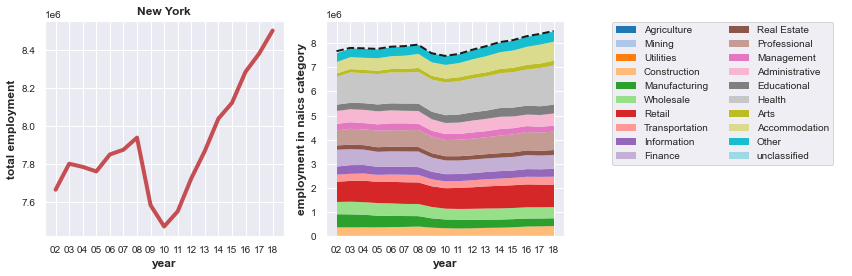

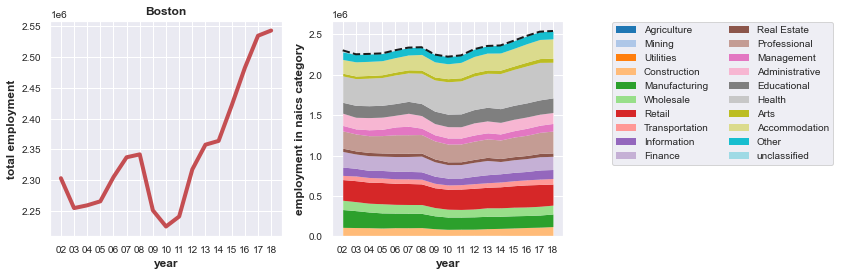

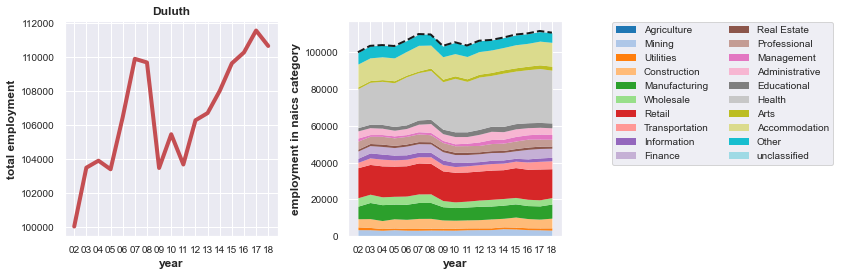

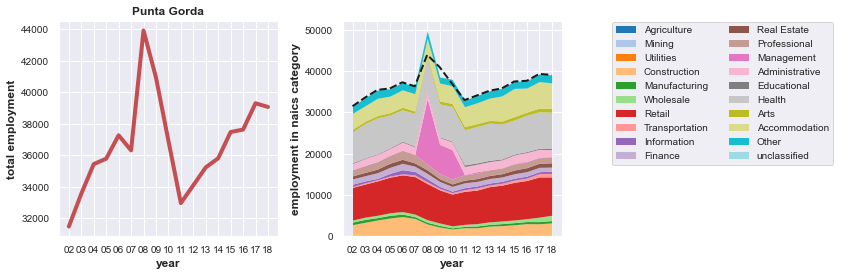

In [21]:
stackPlot_for_1city(df_metro_time,'New York',unq_naics_list)
stackPlot_for_1city(df_metro_time,'Boston',unq_naics_list)
stackPlot_for_1city(df_metro_time,'Duluth',unq_naics_list)

stackPlot_for_1city(df_metro_time,'Punta Gorda',unq_naics_list)

Punta Gorda data had an issue. Some of the data was suppressed, and indicated a huge jump in the management category for years 07-08-09. This jump is not fully reflected in the total employment... but there is still a jump in the total employment and we don't know how much noise there is in the total employment estimate.

## total employment for many cities

the range of city employmens go from:
smallest is 8293 in 2002 to 8503944 in 2018

In [19]:
for year in years:
    print(np.min(df_metro_time['total-Y'+year].values),
          np.max(df_metro_time['total-Y'+year].values) )

8293 7666437
10054 7803017
11108 7786402
11199 7762493
10715 7851797
10825 7876928
11612 7940436
13434 7585194
11796 7472771
12262 7552366
12527 7725583
12632 7870219
12444 8040243
12898 8123112
12478 8286695
12320 8382135
13122 8503944


In [51]:
'''
use of linecollection for multline plot based on
https://stackoverflow.com/questions/38208700/matplotlib-plot-lines-with-colors-through-colormap
'''
from matplotlib.collections import LineCollection
def multiline(xs, ys, c, ax=None, **kwargs):
    """Plot lines with different colorings

    Parameters
    ----------
    xs : iterable container of x coordinates
    ys : iterable container of y coordinates
    c : iterable container of numbers mapped to colormap
    ax (optional): Axes to plot on.
    kwargs (optional): passed to LineCollection

    Notes:
        len(xs) == len(ys) == len(c) is the number of line segments
        len(xs[i]) == len(ys[i]) is the number of points for each line (indexed by i)

    Returns
    -------
    lc : LineCollection instance.
    """

    # find axes
    ax = plt.gca() if ax is None else ax

    # create LineCollection
    segments = [np.column_stack([x, y]) for x, y in zip(xs, ys)]
    lc = LineCollection(segments, **kwargs)

    # set coloring of line segments
    #    Note: I get an error if I pass c as a list here... not sure why.
    lc.set_array(np.asarray(c))

    # add lines to axes and rescale 
    #    Note: adding a collection doesn't autoscalee xlim/ylim
    ax.add_collection(lc)
    ax.autoscale()
    return lc

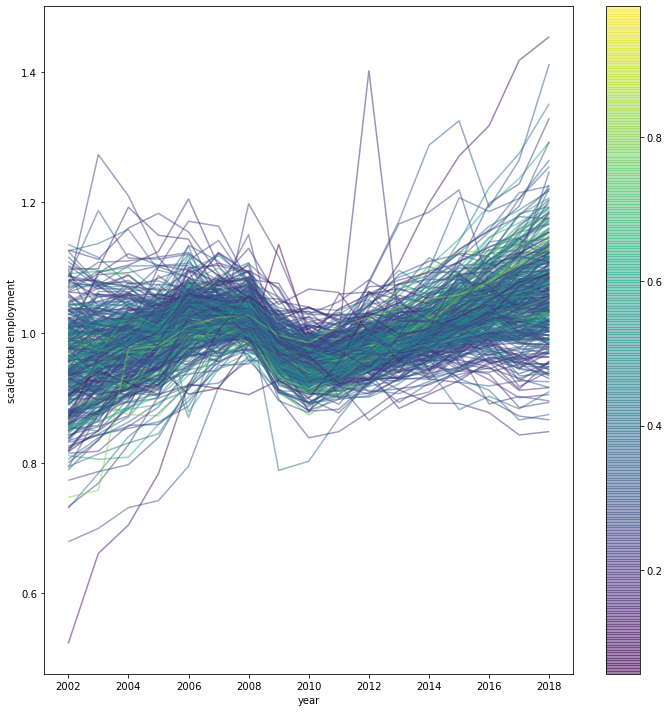

In [50]:
msas_to_plot_list=df_metro_time['msa'].values
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]
fig = plt.figure(figsize=(10, 10))
ax1 = fig.add_subplot()
popn_min=8e3
popn_max=9e6
total_emps_list=[]
years_list=[]
mean_pops_list=[]
log_pops_list=[]
for msa in msas_to_plot_list:
    total_emp=[]
    for year in years:
        total_emp.append(float(df_metro_time[df_metro_time['msa']==msa]['total-Y'+year].values))
    scaled_total_emp=np.asarray(total_emp)/np.asarray(total_emp).mean()
    mean_pop=np.asarray(total_emp).mean()
#     test=ax1.plot(years,total_emp,'-', alpha=0.5, color=get_popncolor(mean_pop))    
    mean_pops_list.append(mean_pop)
    log_pops_list.append( (np.log10(mean_pop)-np.log10(popn_min)
                          )/(np.log10(popn_max)-np.log10(popn_min)) )    
    total_emps_list.append(scaled_total_emp)
    years_list.append([2000+int(y) for y in years])
lc=multiline(years_list, total_emps_list, log_pops_list, ax=ax1, cmap='viridis',alpha=0.5)
ax1.set_xlabel('year')
ax1.set_ylabel('scaled total employment')
plt.colorbar(lc)
fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()

Outliers in growth tend to be some of the smaller cities. Larger cities really seem to follow the same trajectory. A little bit like a random death process in all cities at some fixed rate??

## Does current employment composition predict employment change?


### Linear model predicting change in employment from current composition

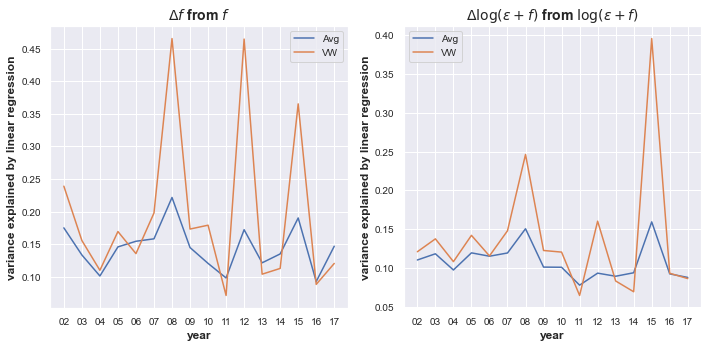

In [85]:
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]
msas = df_metroF_time['msa'].values
n_msas = len(msas)
Rsqd_VW_list=[]
Rsqd_Avg_list=[]
Rsqd_VW_list_log=[]
Rsqd_Avg_list_log=[]
for i in range(len(years)-1):
    year=years[i]
    year2=years[i+1]
    naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
    naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
    total_yr = ['total-Y'+year]

    empF_naics1 = df_metroF_time[naics_yr].values
    empF_naics2 = df_metroF_time[naics_yr2].values
    change_naics_yr=empF_naics2-empF_naics1    
    lin_reg1 = linear_model.LinearRegression()
    lin_reg1.fit(empF_naics1, change_naics_yr)
    Rsqd_Avg_list.append( r2_score(change_naics_yr,lin_reg1.predict(empF_naics1),
                               multioutput='uniform_average')) 
    Rsqd_VW_list.append( r2_score(change_naics_yr,lin_reg1.predict(empF_naics1),
                               multioutput='variance_weighted')) 
    ## =linreg1.score, but linreg1.score might change to 'uniform average' in futre python version
    emplogF_naics1 = df_metro_logF_time[naics_yr].values
    emplogF_naics2 = df_metro_logF_time[naics_yr2].values
    logchange_naics_yr=empF_naics2-empF_naics1    
    lin_reg1 = linear_model.LinearRegression()
    lin_reg1.fit(emplogF_naics1, logchange_naics_yr)
    Rsqd_Avg_list_log.append( r2_score(logchange_naics_yr,lin_reg1.predict(emplogF_naics1),
                               multioutput='uniform_average')) 
    Rsqd_VW_list_log.append( r2_score(logchange_naics_yr,lin_reg1.predict(emplogF_naics1),
                               multioutput='variance_weighted')) 
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(1,2,1)
ax1.plot(years[:-1],Rsqd_Avg_list,label='Avg')
ax1.plot(years[:-1],Rsqd_VW_list,label='VW')
ax1.set_ylabel(r'variance explained by linear regression')
ax1.set_xlabel('year')
ax1.legend(loc='best') 
ax1.set_title(r'$\Delta f$ from $f$')

ax2 = fig.add_subplot(1,2,2)
ax2.plot(years[:-1],Rsqd_Avg_list_log,label='Avg')
ax2.plot(years[:-1],Rsqd_VW_list_log,label='VW')
ax2.set_ylabel(r'variance explained by linear regression')
ax2.set_xlabel('year')
ax2.legend(loc='best') 
ax2.set_title(r'$\Delta \log(\epsilon+f)$ from $\log(\epsilon+f)$')

fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()

### Correlation between pairwise compositional distance and compositional change distance
look at correlation $\langle D[\vec{N}^{(t)}\vec{N}^{(t)}],  D[\Delta \vec{N}^{(t+1)}\Delta \vec{N}^{(t+1)}]\rangle$ where #D referse to pairwise distance


[//]: # ($\langle D(N_{Ai}^{(t)}N_{Bi}^{(t)}),  D(\Delta N_{Ai}^{(t+1)}\Delta N_{Bi}^{(t+1)})\rangle$ over cities A, B and industries. $D$ refers to pairwise distance )

Compare this with the correlation of the change in employment with the national average (set by global economic fluctuations..)

changes in employment  in similar cities is more similar during the financial crisis.
when looking at fractional composition of cities, we see a peak during the financial crisis.

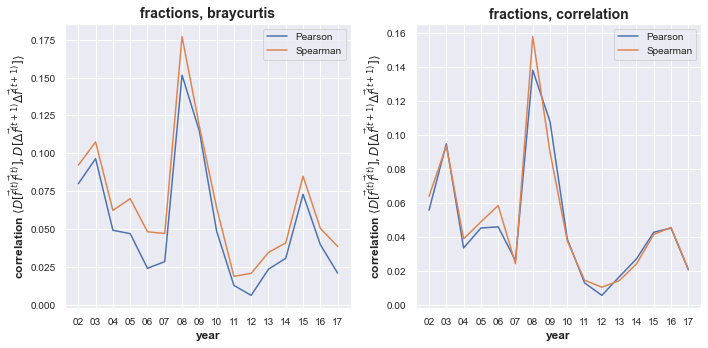

correlation between responses was higher during financial crisis


In [84]:
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]

msas = df_metro_time['msa'].values
n_msas = len(msas)
distance_metric = 'braycurtis'
distance_metric2 = 'correlation'
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
pearsonCorr_list=[]
spearmanCorr_list=[]
pearsonCorr_list2=[]
spearmanCorr_list2=[]
for i in range(len(years)-1):
    year=years[i]
    year2=years[i+1]
    naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
    naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
    total_yr = ['total-Y'+year]
    

    empF_naicsA = df_metroF_time[naics_yr].values
    empF_naicsA2 = df_metroF_time[naics_yr2].values
    ##distance metric 1
    dist_msas=scipy_spatial_distance.pdist(empF_naicsA,metric=distance_metric)
    dist_msas2=scipy_spatial_distance.pdist(empF_naicsA2,metric=distance_metric)
    dist_delta_msas=scipy_spatial_distance.pdist(empF_naicsA2-empF_naicsA,metric=distance_metric)
    pearson_corr,_=scipy.stats.pearsonr(dist_msas,dist_delta_msas)
    spearman_corr,_=scipy.stats.spearmanr(dist_msas,dist_delta_msas)
    pearsonCorr_list.append(pearson_corr)
    spearmanCorr_list.append(spearman_corr)
    
    ##distance metric 2
    dist_msas=scipy_spatial_distance.pdist(empF_naicsA,metric=distance_metric2)
    dist_msas2=scipy_spatial_distance.pdist(empF_naicsA2,metric=distance_metric2)
    dist_delta_msas=scipy_spatial_distance.pdist(empF_naicsA2-empF_naicsA,metric=distance_metric2)
    pearson_corr,_=scipy.stats.pearsonr(dist_msas,dist_delta_msas)
    spearman_corr,_=scipy.stats.spearmanr(dist_msas,dist_delta_msas)
    pearsonCorr_list2.append(pearson_corr)
    spearmanCorr_list2.append(spearman_corr)
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(1,2,1)
ax1.set_title('fractions, '+distance_metric)
ax1.plot(years[:-1],pearsonCorr_list,label='Pearson')
ax1.plot(years[:-1],spearmanCorr_list,label='Spearman')
ax1.set_ylabel(r'correlation $\langle D[\vec{f}^{(t)}\vec{f}^{(t)}],  D[\Delta \vec{f}^{(t+1)}\Delta \vec{f}^{(t+1)}]\rangle$')
ax1.set_xlabel('year')
ax1.legend(loc='best')

ax2 = fig.add_subplot(1,2,2)
ax2.set_title('fractions, '+distance_metric2)
ax2.plot(years[:-1],pearsonCorr_list2,label='Pearson')
ax2.plot(years[:-1],spearmanCorr_list2,label='Spearman')
ax2.set_ylabel(r'correlation $\langle D[\vec{f}^{(t)}\vec{f}^{(t)}],  D[\Delta \vec{f}^{(t+1)}\Delta \vec{f}^{(t+1)}]\rangle$')
ax2.set_xlabel('year')
ax2.legend(loc='best')
fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()
print('correlation between responses was higher during financial crisis')

For logfractions

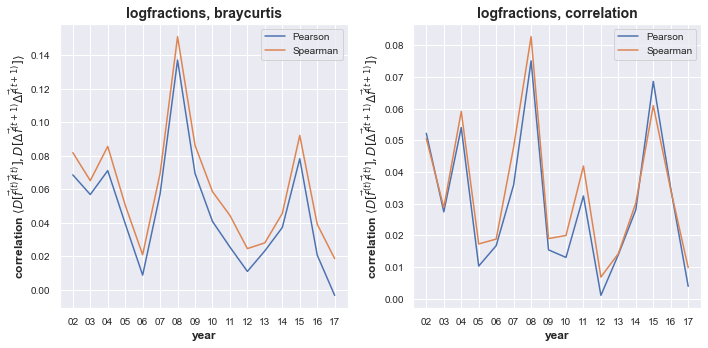

correlation between responses was higher during financial crisis


In [14]:
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]
msas = df_metro_time['msa'].values
n_msas = len(msas)
distance_metric = 'braycurtis'
distance_metric2 = 'correlation'
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
pearsonCorr_list=[]
spearmanCorr_list=[]
pearsonCorr_list2=[]
spearmanCorr_list2=[]
for i in range(len(years)-1):
    year=years[i]
    year2=years[i+1]
    naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
    naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
    total_yr = ['total-Y'+year]
    

    empF_naicsA = df_metro_logF_time[naics_yr].values
    empF_naicsA2 = df_metro_logF_time[naics_yr2].values
    ##distance metric 1
    dist_msas=scipy_spatial_distance.pdist(empF_naicsA,metric=distance_metric)
    dist_msas2=scipy_spatial_distance.pdist(empF_naicsA2,metric=distance_metric)
    dist_delta_msas=scipy_spatial_distance.pdist(empF_naicsA2-empF_naicsA,metric=distance_metric)
    pearson_corr,_=scipy.stats.pearsonr(dist_msas,dist_delta_msas)
    spearman_corr,_=scipy.stats.spearmanr(dist_msas,dist_delta_msas)
    pearsonCorr_list.append(pearson_corr)
    spearmanCorr_list.append(spearman_corr)
    
    ##distance metric 2
    dist_msas=scipy_spatial_distance.pdist(empF_naicsA,metric=distance_metric2)
    dist_msas2=scipy_spatial_distance.pdist(empF_naicsA2,metric=distance_metric2)
    dist_delta_msas=scipy_spatial_distance.pdist(empF_naicsA2-empF_naicsA,metric=distance_metric2)
    pearson_corr,_=scipy.stats.pearsonr(dist_msas,dist_delta_msas)
    spearman_corr,_=scipy.stats.spearmanr(dist_msas,dist_delta_msas)
    pearsonCorr_list2.append(pearson_corr)
    spearmanCorr_list2.append(spearman_corr)
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(1,2,1)
ax1.set_title('logfractions, '+distance_metric)
ax1.plot(years[:-1],pearsonCorr_list,label='Pearson')
ax1.plot(years[:-1],spearmanCorr_list,label='Spearman')
ax1.set_ylabel(r'correlation $\langle D[\vec{f}^{(t)}\vec{f}^{(t)}],  D[\Delta \vec{f}^{(t+1)}\Delta \vec{f}^{(t+1)}]\rangle$')
ax1.set_xlabel('year')
ax1.legend(loc='best')

ax2 = fig.add_subplot(1,2,2)
ax2.set_title('logfractions, '+distance_metric2)
ax2.plot(years[:-1],pearsonCorr_list2,label='Pearson')
ax2.plot(years[:-1],spearmanCorr_list2,label='Spearman')
ax2.set_ylabel(r'correlation $\langle D[\vec{f}^{(t)}\vec{f}^{(t)}],  D[\Delta \vec{f}^{(t+1)}\Delta \vec{f}^{(t+1)}]\rangle$')
ax2.set_xlabel('year')
ax2.legend(loc='best')
fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()
print('correlation between responses was higher during financial crisis')

if we look at log RCA instead, then there is a peak in 2015. Why? 
Could this be due to change in naics classification or something around 2014-2015?

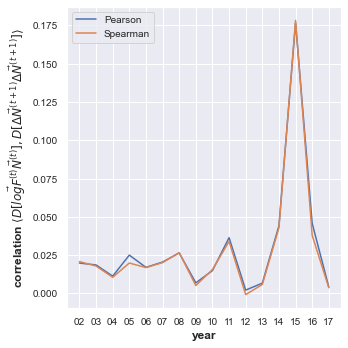

correlation between responses was higher during financial crisis


In [46]:
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]
# year = '03'
# year2 = '04'
msas = df_metro_time['msa'].values
n_msas = len(msas)

_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
pearsonCorr_list=[]
spearmanCorr_list=[]
for i in range(len(years)-1):
    year=years[i]
    year2=years[i+1]
    naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
    naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
    total_yr = ['total-Y'+year]
    distance_metric = 'correlation'

    empF_naicsA = df_metro_logRCA_time[naics_yr].values
    empF_naicsA2 = df_metro_logRCA_time[naics_yr2].values
    
    dist_msas=scipy_spatial_distance.pdist(empF_naicsA,metric=distance_metric)
    dist_msas2=scipy_spatial_distance.pdist(empF_naicsA2,metric=distance_metric)
    dist_delta_msas=scipy_spatial_distance.pdist(empF_naicsA2-empF_naicsA,metric=distance_metric)

    pearson_corr,_=scipy.stats.pearsonr(dist_msas,dist_delta_msas)
    spearman_corr,_=scipy.stats.spearmanr(dist_msas,dist_delta_msas)
    pearsonCorr_list.append(pearson_corr)
    spearmanCorr_list.append(spearman_corr)
#     print('years'+year+'-'+year2)
#     print ('Pearson and spearman correlation is ', pearson_corr,spearman_corr)
fig = plt.figure(figsize=(5, 5))
ax1 = fig.add_subplot()
ax1.plot(years[:-1],pearsonCorr_list,label='Pearson')
ax1.plot(years[:-1],spearmanCorr_list,label='Spearman')
ax1.set_ylabel(r'correlation $\langle D[\vec{logF}^{(t)}\vec{N}^{(t)}],  D[\Delta \vec{N}^{(t+1)}\Delta \vec{N}^{(t+1)}]\rangle$')
ax1.set_xlabel('year')
ax1.legend(loc='best')
fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()
print('correlation between responses was higher during financial crisis')

## Cross correlation of employment time series

What is the question here?

to look at robustness of clustering use scipy.cluster.hierarchy.linkage function
based on this tutorial https://joernhees.de/blog/2015/08/26/scipy-hierarchical-clustering-and-dendrogram-tutorial/

look at how robust the clusters are depending on the clustering method (single, average,etc). do clusters agree between methods? use https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html to compare similarity of clusterings.


equal-time cross correlation of total employment

nmlzd0_total_emp_list is: $\frac{N(t)-\bar{N} }{\bar{N}}$

/Users/ashish/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


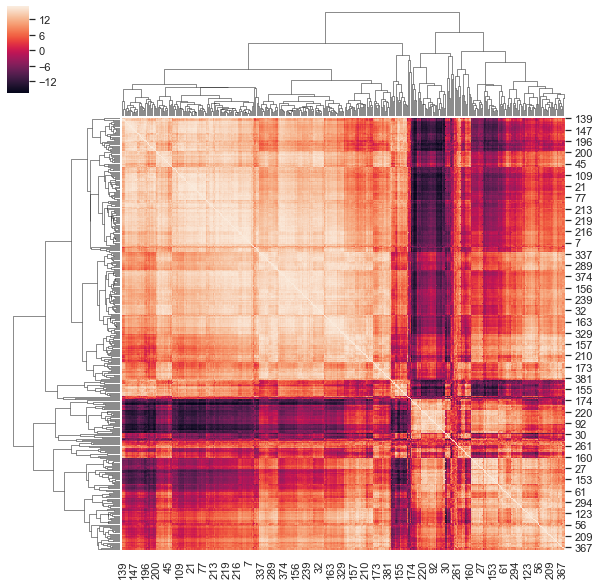

In [105]:
from scipy import signal
msas_to_plot_list = df_metro_time['msa'].values
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]

popn_min = 8e3
popn_max = 9e6
nmlzd0_total_emp_list = []
years_list = []
mean_pops_list = []
log_pops_list = []
for msa in msas_to_plot_list:
    total_emp = []
    for year in years:
        total_emp.append(
            float(df_metro_time[df_metro_time['msa'] == msa]['total-Y'+year].values))
    mean_pop = np.asarray(total_emp).mean()
    scaled_total_emp = np.asarray(total_emp)/mean_pop
    
    mean_pops_list.append(mean_pop)

    nmlzd0_total_emp_list.append(scaled_total_emp-1)
    years_list.append([2000+int(y) for y in years])

n_metros = len(nmlzd0_total_emp_list)
cross_corr_total_emp = np.zeros((n_metros, n_metros))
for i in range(n_metros):
    for j in range(n_metros):
        cross_corr_total_emp[i, j] = scipy.signal.correlate(
            nmlzd0_total_emp_list[i], nmlzd0_total_emp_list[j], mode='valid')/(
            np.std(nmlzd0_total_emp_list[i])*np.std(nmlzd0_total_emp_list[j]) )
# fig = plt.figure(figsize=(5, 5))
# ax1 = fig.add_subplot()
# sns.heatmap(cross_corr_total_emp,ax=ax1)
# fig.patch.set_facecolor('white')
# plt.tight_layout()

sns.set(rc= {'figure.facecolor':'white'}) #'axes.facecolor':'cornflowerblue',
sns.clustermap(cross_corr_total_emp)
plt.tight_layout()
plt.show()

### Cross correlation of temporal employment composition reveals clusters


Using fractional composition of cities

Here "msa_naics_time_0nrmlzd" for industry $i$ and city $c$ is 

$=f_{ci}(t)-\bar{f_{ci}}$

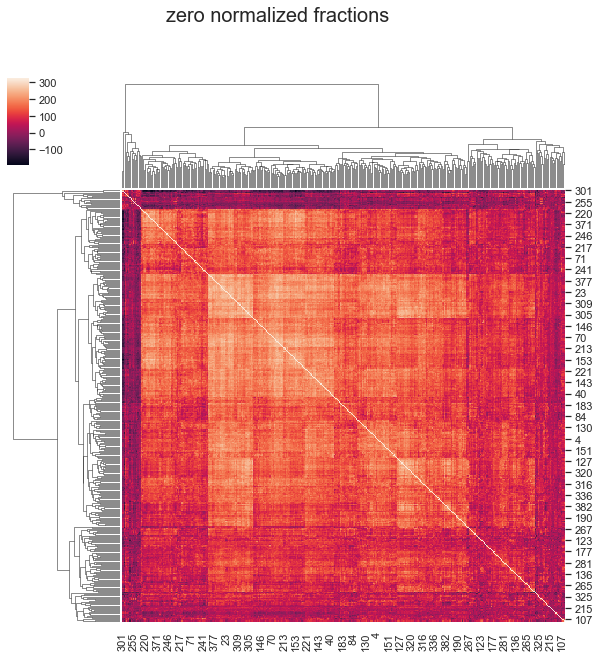

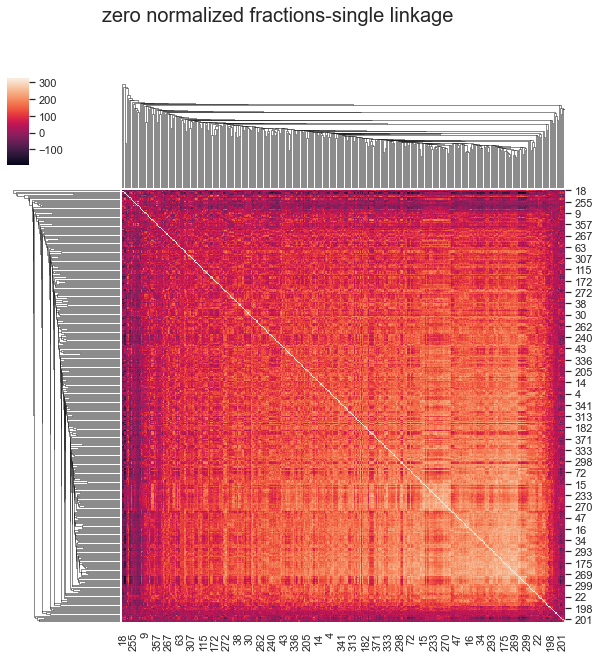

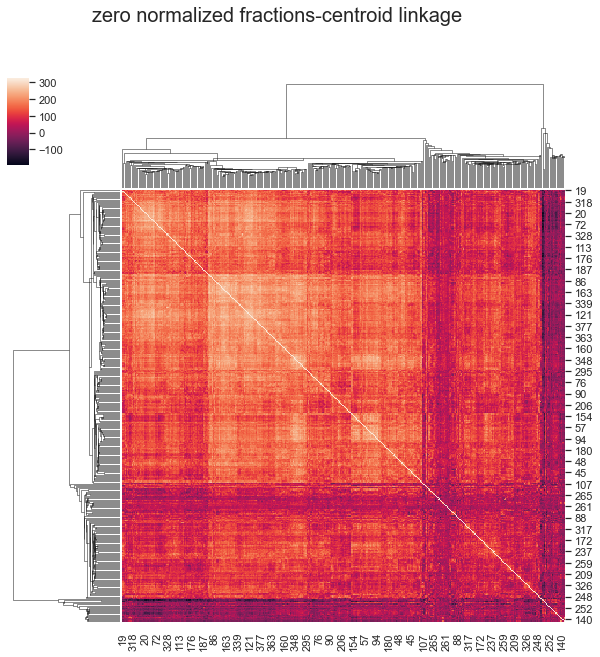

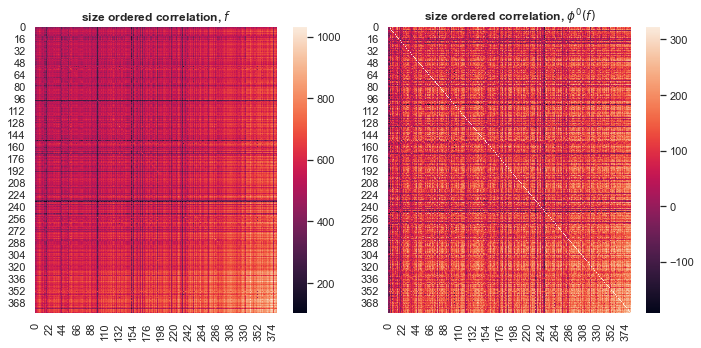

In [109]:
msas_to_plot_list = df_metro_time['msa'].values
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]

_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2,drop_list=['99'])



popn_min = 8e3
popn_max = 9e6


dicts_metros_naicsTime={'msa':[],'msa_naics_time':[],
                        'msa_naics_time_0nrmlzd':[],'total_emp_time':[],
                        'total_emp_mean':[],
                        'naics_plotted':naics_keys_to_plot}

total_yrs=['total-Y'+year for year in years]
for msa in msas_to_plot_list:
    metro_naics_time=[]
    metro_naics_time_nmlzd=[]
    for naics in naics_keys_to_plot:
        keys_yrs=[naics+'-Y'+year for year in years]
        emp_naics=np.ravel(df_metroF_time[df_metroF_time['msa'] == msa][keys_yrs].values)        
        metro_naics_time.append(emp_naics)
        nmlzd_emp= emp_naics-np.mean(emp_naics)
        metro_naics_time_nmlzd.append(nmlzd_emp)
    total_emp=np.ravel(df_metroF_time[df_metroF_time['msa'] == msa][total_yrs].values)
    dicts_metros_naicsTime['total_emp_time'].append(total_emp)
    dicts_metros_naicsTime['total_emp_mean'].append(float(np.mean(total_emp)))
    dicts_metros_naicsTime['msa'].append(msa)
    dicts_metros_naicsTime['msa_naics_time'].append(np.array(metro_naics_time))
    dicts_metros_naicsTime['msa_naics_time_0nrmlzd'].append(np.array(metro_naics_time_nmlzd))
years_list.append([2000+int(y) for y in years])    

    

n_metros = len(msas_to_plot_list)
cross_corr_naics_emp = np.zeros((n_metros, n_metros))
cross_corr_0nmzd_naics_emp = np.zeros((n_metros, n_metros))
for i in range(n_metros):
    for j in range(n_metros):
        x,y= dicts_metros_naicsTime['msa_naics_time'][i], dicts_metros_naicsTime['msa_naics_time'][j]
        cross_corr_naics_emp[i, j] = scipy.signal.correlate2d(x,y, mode='valid')/(
        np.std(x)*np.std(y))
        
        x,y= dicts_metros_naicsTime['msa_naics_time_0nrmlzd'][i], dicts_metros_naicsTime['msa_naics_time_0nrmlzd'][j]
        cross_corr_0nmzd_naics_emp[i, j]= scipy.signal.correlate2d(x,y, mode='valid')/(
        np.std(x)*np.std(y))


# clust_map=sns.clustermap(cross_corr_naics_emp)
# clust_map.ax_heatmap.set_title('fraction',fontsize=20,color='blue')
clust_map2=sns.clustermap(cross_corr_0nmzd_naics_emp)
clust_map2.fig.suptitle('zero normalized fractions',fontsize=20)
clust_map3=sns.clustermap(cross_corr_0nmzd_naics_emp,method='single')
clust_map3.fig.suptitle('zero normalized fractions-single linkage',fontsize=20)
clust_map4=sns.clustermap(cross_corr_0nmzd_naics_emp,method='centroid')
clust_map4.fig.suptitle('zero normalized fractions-centroid linkage',fontsize=20)


size_order=np.argsort(dicts_metros_naicsTime['total_emp_mean'])
## rearrange the cross correlation matrix
ordered_cross_corr=cross_corr_naics_emp[np.ix_(size_order, size_order)]
ordered_cross_corr_0nmzd=cross_corr_0nmzd_naics_emp[np.ix_(size_order, size_order)]

fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(1,2,1)
ax1.set_title(r'size ordered correlation, $f$')
sns.heatmap(ordered_cross_corr,ax=ax1)

ax2 = fig.add_subplot(1,2,2)
ax2.set_title(r'size ordered correlation, $\phi^0 (f)$')
sns.heatmap(ordered_cross_corr_0nmzd,ax=ax2)


fig.patch.set_facecolor('white')
plt.tight_layout()



plt.show()

In [62]:
size_order

array([3, 2, 6, 8, 0, 9, 1, 5, 7, 4])

using CLR(f) of cities

/Users/ashish/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


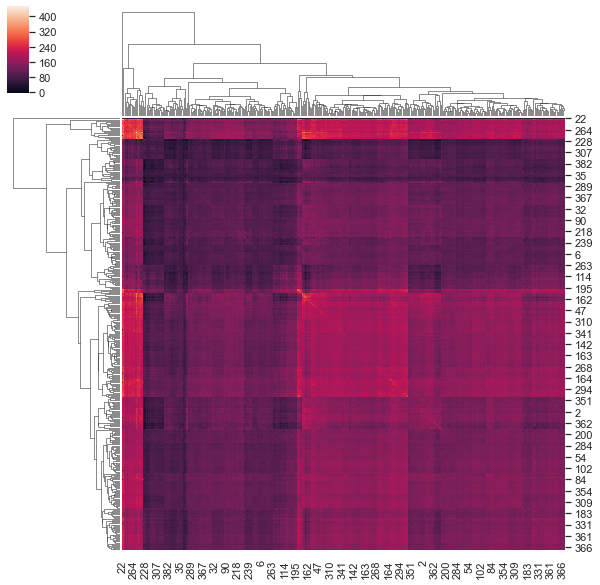

In [53]:
msas_to_plot_list = df_metro_time['msa'].values
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]

_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2,drop_list=['99'])
df_metroF_time

naics_keys
popn_min = 8e3
popn_max = 9e6


dicts_metros_naicsTime={'msa':[],'msa_naics_time':[],'naics_plotted':naics_keys_to_plot}

total_emps_list = []
years_list = []
mean_pops_list = []
log_pops_list = []
for msa in msas_to_plot_list:
    metro_naics_time=[]
    for naics in naics_keys_to_plot:
        keys_yrs=[naics+'-Y'+year for year in years]
        metro_naics_time.append(
            np.ravel(df_metro_CLRf_time[df_metro_CLRf_time['msa'] == msa][keys_yrs].values))
    dicts_metros_naicsTime['msa'].append(msa)
    dicts_metros_naicsTime['msa_naics_time'].append(np.array(metro_naics_time))
    
years_list.append([2000+int(y) for y in years])    

    

n_metros = len(msas_to_plot_list)
cross_corr_naics_emp = np.zeros((n_metros, n_metros))
for i in range(n_metros):
    for j in range(n_metros):
        cross_corr_naics_emp[i, j] = scipy.signal.correlate2d(
            dicts_metros_naicsTime['msa_naics_time'][i], dicts_metros_naicsTime['msa_naics_time'][j], mode='valid')


sns.set(rc= {'figure.facecolor':'white'}) #'axes.facecolor':'cornflowerblue',
sns.clustermap(cross_corr_naics_emp)
plt.tight_layout()
plt.show()

using log(RCA)

In [ ]:
msas_to_plot_list = df_metro_time['msa'].values
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]

_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2,drop_list=['99'])
df_metroF_time

naics_keys
popn_min = 8e3
popn_max = 9e6


dicts_metros_naicsTime={'msa':[],'msa_naics_time':[],'naics_plotted':naics_keys_to_plot}

total_emps_list = []
years_list = []
mean_pops_list = []
log_pops_list = []
for msa in msas_to_plot_list:
    metro_naics_time=[]
    for naics in naics_keys_to_plot:
        keys_yrs=[naics+'-Y'+year for year in years]
        metro_naics_time.append(
            np.ravel(df_metro_logRCA_time[df_metro_logRCA_time['msa'] == msa][keys_yrs].values))
    dicts_metros_naicsTime['msa'].append(msa)
    dicts_metros_naicsTime['msa_naics_time'].append(np.array(metro_naics_time))
    
years_list.append([2000+int(y) for y in years])    

    

n_metros = len(msas_to_plot_list)
cross_corr_naics_emp = np.zeros((n_metros, n_metros))
for i in range(n_metros):
    for j in range(n_metros):
        cross_corr_naics_emp[i, j] = scipy.signal.correlate2d(
            dicts_metros_naicsTime['msa_naics_time'][i], dicts_metros_naicsTime['msa_naics_time'][j], mode='valid')


sns.set(rc= {'figure.facecolor':'white'}) #'axes.facecolor':'cornflowerblue',
clust_map=sns.clustermap(cross_corr_naics_emp)
clust_map.fig.suptitle('log(RCA)-avg linkage')
clust_map2=sns.clustermap(cross_corr_naics_emp,method='single')
clust_map2.fig.suptitle('log(RCA)-single linkage')
clust_map3=sns.clustermap(cross_corr_naics_emp,method='centroid')
clust_map3.fig.suptitle('log(RCA)-centroid linkage')
plt.tight_layout()
plt.show()

Do clusters from different metrics agree somewhat? What causes the clustering?

# Statistical scaling laws -tests

In [3]:
#
unq_naics_list, _, tot_and_unqnaics_fullcodes, naics_keys = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2,drop_list=['99'])


df_metroF_time=df_metro_time.copy()
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]
naics_keys_yrs=[]
for year in years:
    naics_keys_yr=[k+'-Y'+year for k in naics_keys]
    naics_keys_yrs.extend(naics_keys_yr)
    df_metroF_time[naics_keys_yr]=df_metro_time[naics_keys_yr].values*1./df_metro_time['total-Y'+year].values[:,None]
    imputed_totals=df_metro_time['total_imputed-Y'+year].values
    if np.any(imputed_totals):
        print('number of cities with total emp imputed in year', year, ' = ', 
              len(np.where(imputed_totals==True)[0]))        
        imputed_naics_keys_yr=[k+'_imputed'+'-Y'+year for k in naics_keys]
        
        for city in np.where(imputed_totals==True)[0]:
#             print(df_metroF_time.iloc[city][naics_keys_yr])
#             print(df_metroF_time.iloc[city][imputed_naics_keys_yr])
            for imputed_key in imputed_naics_keys_yr:
                df_metroF_time.iloc[city,df_metroF_time.columns.get_loc(imputed_key)]=True

fracs=df_metroF_time[naics_keys_yrs].values
##multiplicative pseduo count independent of city size
pseudo_count = np.min(fracs[fracs > 0]/10)
df_metro_logF_time=df_metroF_time.copy()
df_metro_CLRf_time=df_metroF_time.copy()

for year in years:
    naics_keys_yr=[k+'-Y'+year for k in naics_keys]
    Fracs_yr=df_metroF_time[naics_keys_yr].values    
    for city_idx in range(len(Fracs_yr)):
        if np.any(Fracs_yr[city_idx]==0):
            temp=np.array(Fracs_yr[city_idx])   
            delta=pseudo_count
            n_zeros=len(np.where(temp==0)[0])
            temp[np.nonzero(temp)]=temp[np.nonzero(temp)]*(1.-n_zeros*delta)
            temp[np.where(temp==0)[0]]=delta
            Fracs_yr[city_idx]=temp      

    df_metro_logF_time[naics_keys_yr]=np.log10(Fracs_yr) 
    gmean=scipy.stats.gmean(Fracs_yr,axis=1)
    clr_frac=np.log10(Fracs_yr/gmean[:,np.newaxis])
    df_metro_CLRf_time[naics_keys_yr]=clr_frac
    
    
      
df_metroRCA_time=df_metroF_time.copy()    
df_metro_logRCA_time=df_metroF_time.copy() 
for year in years:
    naics_keys_yr=[k+'-Y'+year for k in naics_keys]
    for naics in naics_keys_yr:
        country_wideF= np.sum(df_metro_time[naics].values)*1./np.sum(df_metro_time['total-Y'+year].values)       
        df_metroRCA_time[naics]=df_metroF_time[naics]/country_wideF 
for year in years:
    naics_keys_yr=[k+'-Y'+year for k in naics_keys]
    df_metro_logRCA_time[naics_keys_yr]=np.log10(pseudo_count+df_metroRCA_time[naics_keys_yr].values)

_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])


def get_nonimputed_data(df_metro_time,naics_keys_to_plot,year):
    '''returns single year data'''
    naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
    imputed_keys_yr=[naics+'_imputed-Y'+year for naics in naics_keys_to_plot]

    emp_naics = np.ravel(df_metro_time[naics_yr].values)
    imputed_flags=np.ravel(df_metro_time[imputed_keys_yr].values)    
    return emp_naics,np.where(imputed_flags==False)[0]
    
def get_nonimputed_data_oldmethod(df_metro_time,naics_keys_to_plot,year):
    years2to7=[k.zfill(2) for k in np.arange(2, 7).astype(int).astype(str)]
    years7to18=[k.zfill(2) for k in np.arange(7, 18).astype(int).astype(str)]
    emp_suppresion_flags = ['A', 'B', 'C', 'E',
                            'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'S']
    NF_suppresion_flags = ['D', 'S']

    naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
    emp_naics = np.ravel(df_metro_time[naics_yr].values)
    not_suppressed_idx=[]
    if year in years2to7:
        empflag_keys=[naics+'_empflag'+'-Y'+year for naics in naics_keys_to_plot]   
        empflag_naics = np.ravel(df_metro_time[empflag_keys].values)
        for idx,val in enumerate(empflag_naics):
            if any(x in val for x in emp_suppresion_flags):
                continue
            else:
                not_suppressed_idx.append(idx)
    if year in years7to18: 
        NF_keys=[naics+'_NF'+'-Y'+year for naics in naics_keys_to_plot]   
        NF_naics = np.ravel(df_metro_time[NF_keys].values)
        for idx,val in enumerate(NF_naics):
            if any(x in val for x in NF_suppresion_flags):
                continue
            else:
                not_suppressed_idx.append(idx)
    return emp_naics,np.array(not_suppressed_idx)

def get_strictest_log_ratio_time_series(df_metroF_time, naics_keys_to_plot, years):
    '''The logration time series where complete data, where the particular trajectory
    has no imputation or zeros'''    
    delta_log_ratio=[]
    for naics in naics_keys_to_plot:
        naics_yrs = [naics+'-Y'+year for year in years]
        imputed_keys_yrs=[naics+'_imputed-Y'+year for year in years]

        for index, row in df_metroF_time.iterrows():
            if np.any(row[imputed_keys_yrs]):
                continue
            elif np.any(row[naics_yrs]==0):
                continue
            else:
                delta_log_ratio.append(np.diff(np.log(row[naics_yrs].values.astype(float))))
    
    print (np.shape(delta_log_ratio))
    return (delta_log_ratio)

def get_strictest_non_imputed_data(df_metro_time, naics_keys_to_plot, years):
    '''returns multi-year data where the entire trajectory has no imputation or zeros'''    
    strict_data_dict={}
    strict_data_all=[]
    for naics in naics_keys_to_plot:
        naics_yrs = [naics+'-Y'+year for year in years]
        imputed_keys_yrs=[naics+'_imputed-Y'+year for year in years]
        temp=[]
        for index, row in df_metroF_time.iterrows():
            if np.any(row[imputed_keys_yrs]):
                continue
            elif np.any(row[naics_yrs]==0):
                continue
            else:   
                temp.append(row[naics_yrs].values)
                strict_data_all.append(row[naics_yrs].values)
        strict_data_dict.update({naics:temp})      
    return strict_data_dict, np.array(strict_data_all).astype('float')

number of cities with total emp imputed in year 02  =  2
number of cities with total emp imputed in year 03  =  1
number of cities with total emp imputed in year 05  =  2
number of cities with total emp imputed in year 06  =  2
number of cities with total emp imputed in year 07  =  2
number of cities with total emp imputed in year 08  =  5
number of cities with total emp imputed in year 09  =  5
number of cities with total emp imputed in year 10  =  4
number of cities with total emp imputed in year 11  =  4
number of cities with total emp imputed in year 12  =  7
number of cities with total emp imputed in year 13  =  3
number of cities with total emp imputed in year 14  =  5
number of cities with total emp imputed in year 15  =  1
number of cities with total emp imputed in year 16  =  1


In [5]:
naics_keys

['naics_11',
 'naics_21',
 'naics_22',
 'naics_23',
 'naics_31',
 'naics_42',
 'naics_44',
 'naics_48',
 'naics_51',
 'naics_52',
 'naics_53',
 'naics_54',
 'naics_55',
 'naics_56',
 'naics_61',
 'naics_62',
 'naics_71',
 'naics_72',
 'naics_81']

## distribution of employment sizes

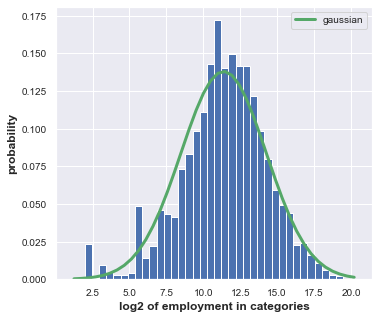

In [36]:
year='14'
naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]

def symm_weibull_dis(x,k,l):
            return (k/l) * np.power((np.abs(x)/l),k-1.) * np.exp(-np.power((np.abs(x)/l),k))  
def get_plot_params(log_size,n_histbins=21):
    mu=np.mean(log_size)
    sigma=np.std(log_size)
    b_laplace=sigma/np.sqrt(2)
    histogram, histbins = np.histogram(log_size, bins=n_histbins, density=True)
    histbin_centers = 0.5*(histbins[1:] + histbins[:-1])

    def func(k, ratio):
        return 0.5*scipy.special.gamma(1+4./k)/np.square(scipy.special.gamma(1+2./k))-ratio

    moment_ratio=stats.moment(log_size,moment=4)/np.power(sigma,4)
    sol_result=  scipy.optimize.root(func, .5,args=moment_ratio)
    weibull_k=float(sol_result.x)
    weibull_lambda= np.sqrt(np.square(sigma)/(2.*scipy.special.gamma(1.+2./weibull_k)) )
#             print ('k= ',"{:.4f}".format(weibull_k),';  lambda= ',"{:.4f}".format(weibull_lambda))

    ### Mculloch estimate, not MLE which is very slow.
    guess_params=levy_stable._fitstart(log_size)
    return  n_histbins, histbin_centers, mu,sigma,b_laplace,weibull_k,weibull_lambda,guess_params


emp_sizes=df_metro_time[naics_yr].values
emp_sizes=np.ravel(emp_sizes[emp_sizes>0])
log_N=np.log2(emp_sizes)
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(1,2,1)
n_histbins, histbin_centers, mu,sigma,b_laplace,weibull_k,weibull_lambda,guess_params=get_plot_params(
    log_N,n_histbins=40)
ax1.hist(log_N,bins=n_histbins,density=True)
ax1.plot(histbin_centers,scipy.stats.norm.pdf(histbin_centers,loc=mu,scale=sigma),
         'g-',label='gaussian',lw=3)
# ax1.plot(histbin_centers,scipy.stats.laplace.pdf(histbin_centers,loc=mu,scale=b_laplace),
#          'c-',label='Laplace')
# ax1.plot(histbin_centers,symm_weibull_dis(histbin_centers,weibull_k,weibull_lambda),
#          'k-',lw=3,label='Symm_Weibull')
# ax1.plot(histbin_centers, levy_stable.pdf(histbin_centers,guess_params[0],guess_params[1], 
#             loc=guess_params[2],scale=guess_params[3]),'r-',lw=3,label='Levy stable')                                                          
ax1.set_xlabel(r'log2 of employment in categories')
ax1.set_ylabel(r'probability')
ax1.legend(loc='best')

# ax2 = fig.add_subplot(1,2,2)
# n_histbins, histbin_centers, mu,sigma,b_laplace,weibull_k,weibull_lambda,guess_params=get_plot_params(
#     dlogF_sub,n_histbins=21)
# ax2.hist(dlogF_sub,bins=n_histbins,density=True)
# ax2.plot(histbin_centers,scipy.stats.norm.pdf(histbin_centers,loc=mu,scale=sigma),
#          'g-',label='gaussian')
# ax2.plot(histbin_centers,scipy.stats.laplace.pdf(histbin_centers,loc=mu,scale=b_laplace),
#          'c-',label='Laplace')
# ax2.plot(histbin_centers,symm_weibull_dis(histbin_centers,weibull_k,weibull_lambda),
#          'k-',lw=3,label='Symm_Weibull')
# ax2.plot(histbin_centers, levy_stable.pdf(histbin_centers,guess_params[0],guess_params[1], 
#             loc=guess_params[2],scale=guess_params[3]),'r-',lw=3,label='Levy stable')                                                          
# ax2.legend(loc='best')       
# ax2.set_xlabel(r'log$F_{t+\tau}/F_t$')

#         print(start, sigma, 1./sigma)
# for ax in [ax1,ax2]:
#     ax.set_ylabel(r'probability') 
#     if (1./sigma)<18: ## if not change y lim so we can see the top of the plot.
#         ax.set_ylim(5e-4,5.)
#     else:
#         print('triggered for', start, end)
#         ax.set_ylim(1e-4*2./sigma,2./sigma)
#     ax.set_yscale('log')

# fig.suptitle('bin interval=({:.0e}, {:.0e}) and number of points={:.1e}'.format(
#     start,end, len(dlogN_sub)))
fig.patch.set_facecolor('white')
#         plt.tight_layout()
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


### stratified by naics

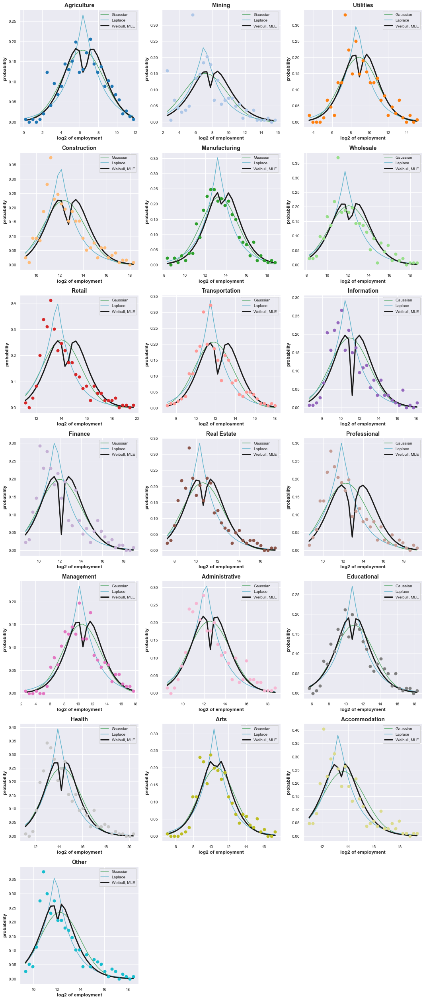

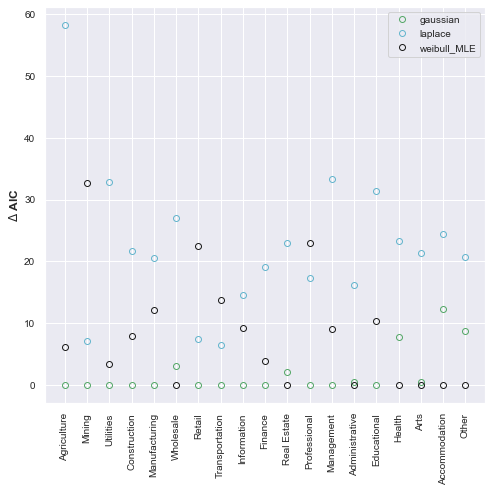

In [4]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
year = '15'
shared_func.plot_abundance_fit_by_naics(df_metro_time, naics_keys_to_plot, year,
                             BLS=False, remove_imputed_values=True)

weibull MLE, k=  1.2729 ;  lambda=  0.8525
AIC dict= {'gaussian': [20606.987502131848], 'laplace': [21034.067459865837], 'weibull_MLE': [20619.65823597766], 'weibull_MM': []}


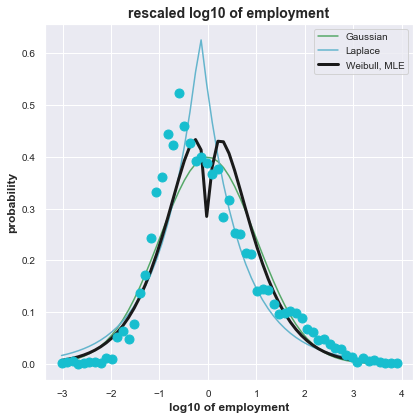

In [5]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
year = '15'
shared_func.plot_agg_rescaled_employment(df_metro_time, naics_keys_to_plot, year,
                             BLS=False, remove_imputed_values=True)

## distribution of log ratio step sizes
PDF of $\log(f_i(t+1)/f_i(t))$ and $\log(N_i(t+1)/N_i(t))$ are Weibull/leptokurtic

symmetric weibull distribution is 

\begin{equation}
f(x)= \frac{k}{2l} (\frac{|x|}{\lambda})^{k-1} e^{(-|x|/\lambda)^k}
\end{equation}



$\frac{<x^4>}{<x^2>^2}=\frac{1}{2} \frac{\Gamma (1+4/k)}{\Gamma^2(1+2/k)}$
to solve for $k$
and then $\lambda$ can be derived from
$<x^2>=2\lambda\Gamma(1+2/k)$






MLE for levy stable would take ~418000 secs or 116 hours. as we have 418236 data points
k in weibull variest from 0.4 to 0.6 depending on industry category. When fit to all industries together, k=0.45
$k<1$ and so there is a delta function at zero

approximate inverse of gamma function in terms of lambert W and log, 
https://mathoverflow.net/questions/12828/inverse-gamma-function

In [4]:
from scipy.optimize import fsolve
import scipy.optimize
from scipy.stats import levy_stable



def plot_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot, years,title=None,
                                   xlabel=r'$\Delta$ logratio, $\log(f_i(t+\tau)/f_i(t))$',
                                   tau=1, MLE_levy=False,remove_imputed_values=False,
                                   return_fit_vals=False):    
    
    def L_of_x(x):
        c= 0.036534
        return np.log((x+c)/np.sqrt(2*np.pi))
    def invGamma_of_x(x):
        return L_of_x(x)/scipy.special.lambertw(L_of_x(x)/np.e) + 0.5   
    
    
    logratio_change_naics=[]
    msas = df_metroF_time['msa'].values
    n_msas = len(msas)
    for i in range(len(years)-tau):
        year=years[i]
        year2=years[i+tau]
        naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
        naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
        total_yr = ['total-Y'+year]

        if remove_imputed_values:           
            emp1, non_imputed_idx1=get_nonimputed_data(df_metroF_time,naics_keys_to_plot,year)
            emp2, non_imputed_idx2=get_nonimputed_data(df_metroF_time,naics_keys_to_plot,year2)
            non_imputed_idx=np.intersect1d(non_imputed_idx1,non_imputed_idx2,assume_unique=True)
            empF_naics1=emp1[non_imputed_idx]
            empF_naics2=emp2[non_imputed_idx]
        else:
            empF_naics1 = df_metroF_time[naics_yr].values
            empF_naics2 = df_metroF_time[naics_yr2].values
        ratio_change_naics_yr=np.ravel(empF_naics2[empF_naics1>0]*1./empF_naics1[empF_naics1>0])    
        logratio_change_naics.extend(np.log(ratio_change_naics_yr[ratio_change_naics_yr>0.]))
    
    logratio_change_naics=np.array(logratio_change_naics)
#     print ('size of logratio change naics=', np.shape(logratio_change_naics),print ('size of logratio change naics=', np.size(logratio_change_naics)))
    n_bins=21 ## odd is symmetric
    histogram, bins = np.histogram(logratio_change_naics, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])

    mu=np.mean(logratio_change_naics)
    sigma=np.std(logratio_change_naics)
    b_laplace=sigma/np.sqrt(2)
    
    print ('mean',mu,stats.moment(logratio_change_naics*1.,moment=1),
            'sigma',sigma,np.sqrt(stats.moment(logratio_change_naics,moment=2)))
#     print ('mean',mu,stats.moment(logratio_change_naics*1.,moment=1), 
#            np.sum(logratio_change_naics)/len(logratio_change_naics),
#            'sigma',sigma,np.sqrt(stats.moment(logratio_change_naics,moment=2)),
#            'skewness',stats.moment(logratio_change_naics,moment=3)/np.power(sigma,3),
#            'kurtosis',stats.moment(logratio_change_naics,moment=4)/np.power(sigma,4) -3.,
#            'weird coincidence',stats.moment(logratio_change_naics,moment=4)/np.power(sigma,2) -3.
#           )
    
    def func(k, ratio):
        return scipy.special.gamma(1+4./k)/np.square(scipy.special.gamma(1+2./k))-ratio # removed 1/2     def symm_weibull_dis(x,k,l):
    def symm_weibull_dis(x,k,l):
        return (k/l) * np.power((np.abs(x)/l),k-1.) * np.exp(-np.power((np.abs(x)/l),k))/2. # added 1/2
    
    
    
    moment_ratio=stats.moment(logratio_change_naics,moment=4)/np.power(sigma,4)
#     weibull_k = fsolve(func, 100,args=moment_ratio)
    sol_result=  scipy.optimize.root(func, .5,args=moment_ratio)
#     print(sol_result)
    weibull_k=float(sol_result.x)
    error=np.abs(func(weibull_k,moment_ratio))
    print ('error=',error)
    if error>1e-3:
        print('hybrid method failed')
        ctr=0
        methods_list=['lm','broyden1','broyden2','anderson','df-sane'
                      'linearmixing','diagbroyden','excitingmixing','krylov']
        while (error>1e-3 and ctr<8):
            sol_result=  scipy.optimize.root(func, .5,args=moment_ratio,
                                             method=methods_list[ctr])
            weibull_k=float(sol_result.x)
            error=np.abs(func(weibull_k,moment_ratio))
            print ('error=',error,'method=',methods_list[ctr])
            ctr+=1
        if error>1e-3:
            print('All methods failed!!')
    
    
    
    weibull_lambda= np.sqrt(np.square(sigma)/scipy.special.gamma(1.+2./weibull_k) ) ## removed 1/2
    print ('k= ',"{:.4f}".format(weibull_k),';  lambda= ',"{:.4f}".format(weibull_lambda))
    
    ### Mculloch estimate, not MLE which is very slow.
    guess_params=levy_stable._fitstart(logratio_change_naics)
    print ('Levy parameters quick estimate =',guess_params)

    if return_fit_vals: ## skip the plots.
        fit_params={'weibull_k':weibull_k,'weibull_lambda':weibull_lambda,
                    'levy_params_est':guess_params,
                    'MLE_Levy_flag':MLE_levy,
                    'removed_imputation':remove_imputed_values,
                   'tau':tau}
        return fit_params
    
    suppress_plots=False #False
    if suppress_plots==True: return 0
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(8, 6),
                                                 gridspec_kw={'height_ratios': [1.75, 1]})
#     ax1 = fig.add_subplot(2,2,1)
    ax1.plot(bin_centers,histogram,'-o',label='data')
    ax1.plot(bin_centers,scipy.stats.norm.pdf(bin_centers,loc=mu,scale=sigma),
             'g-',label='gaussian')
    ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu,scale=b_laplace),
             'c-',label='Laplace')
#     ax1.plot(bin_centers,scipy.stats.lognorm.pdf(bin_centers,s=sigma,scale=np.exp(mu)),
#              'm-',label='lognormal')
#     print('empirical moments', mu, sigma)
#     print('lognormal moments',scipy.stats.lognorm.stats(s=sigma,scale=np.exp(mu), moments='mvsk'))
#     print('normal moments',scipy.stats.norm.stats(loc=mu,scale=sigma, moments='mvsk'))
    
    if error<1e-3:
        ax1.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
                 'k-',lw=3,label='Symm_Weibull')
    else:
        ax1.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
             'c-',label='error Symm_Weibull')
    
    ax1.plot(bin_centers, levy_stable.pdf(bin_centers,guess_params[0],guess_params[1], 
                    loc=guess_params[2],scale=guess_params[3]),'r-',lw=3,label='Levy stable')


    ax1.legend(loc='best')
#     ax2 = fig.add_subplot(2,2,2)
    ax2.hist(logratio_change_naics,bins=n_bins,density=True)
    ax2.plot(bin_centers,scipy.stats.norm.pdf(bin_centers,loc=mu,scale=sigma),
             'g-',label='gaussian',linewidth=4,alpha=0.75)
    ax2.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu,scale=b_laplace),
             'c-',label='Laplace',linewidth=4,alpha=0.75)
    
    if error<1e-3:
        ax2.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
             'k-',label='Symm_Weibull',linewidth=4,alpha=0.75)
    else:
        ax2.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
             'k--',label='error Symm_Weibull',linewidth=4,alpha=0.75)
    
    ax2.plot(bin_centers, levy_stable.pdf(bin_centers,guess_params[0],guess_params[1], 
                    loc=guess_params[2],scale=guess_params[3]),'r-',lw=4, alpha=0.75,label='Levy stable')
    
    
    ax2.legend(loc='best')


    for ax in [ax1,ax2]:
        ax.set_ylabel(r'probability')
        ax.set_xlabel(xlabel+r', $\tau=$'+str(tau))
        ax.set_ylim(1e-5,4.)
        ax.set_yscale('log')

    fig.patch.set_facecolor('white')
    from statsmodels.graphics.gofplots import qqplot
#     ax3 = fig.add_subplot(2,2,3)
    qqplot(logratio_change_naics,loc=mu,scale=sigma, line='s',ax=ax3)
    ax3.set_title('normal distribution')
#     ax4 = fig.add_subplot(2,2,4)
    qqplot(logratio_change_naics,dist=scipy.stats.laplace,loc=mu,scale=b_laplace, line='s',ax=ax4)
    ax4.set_title('Laplace distribution')
    if title is not None:
        ax2.set_title(title)
        ax1.set_title(title)
    plt.tight_layout()

#     fig3 = plt.figure(figsize=(4, 4))
#     ax1 = fig3.add_subplot()
    
#     nmzd_moments_data=[]
#     nmzd_moments_SymWeibull=[]
#     weibull_sigma=np.sqrt(2.*np.power(weibull_lambda,2)*scipy.special.gamma(1.+2./weibull_k))
#     for i in np.arange(1,9):
#         nmzd_moments_data.append(stats.moment(logratio_change_naics,moment=i
#                                              )/np.power(sigma,i))
#         if i%2==0:
#             nmzd_moments_SymWeibull.append(
#                 (2.*np.power(weibull_lambda,i)*scipy.special.gamma(1.+i*1./weibull_k))/(
#                     np.power(weibull_sigma,i)) )
#         else:
#              nmzd_moments_SymWeibull.append(0.)
            
#     ax1.plot(np.arange(1,9),1.+np.array(nmzd_moments_data),'bo',label='data')
#     ax1.plot(np.arange(1,9),1+np.array(nmzd_moments_SymWeibull),'ro',label='Sym_Weibull')
#     ax1.set_title('comparing moments without centering... need to calculate centered moments')
#     ax1.legend(loc='best')
#     ax1.set_xlabel('order, $n$')
#     ax1.set_ylabel(r'1+normalized moment, $1+\mu_n/ \sigma^n$')
#     ax1.set_yscale('log')
#     plt.tight_layout()
    
    
    
#     print('something wrong with QQ plot.')
#     '''
#     something wrong with QQ plot. there seems to be error in converting from symmetric weibull 
#     to the one-sided weibull distribution 
#     '''
#     fig2 = plt.figure(figsize=(6, 3))
#     ax1 = fig2.add_subplot(1,2,1)
#     positive_logratios=logratio_change_naics[logratio_change_naics>=0]
#     qqplot(positive_logratios, dist=scipy.stats.weibull_min, scale=weibull_lambda, 
#            distargs=weibull_k, line='s',ax=ax1)
#     ax2 = fig2.add_subplot(1,2,2)
#     negative_logratios=logratio_change_naics[logratio_change_naics<0]
#     qqplot(np.abs(negative_logratios),dist=scipy.stats.weibull_min,scale=weibull_lambda,
#            distargs=weibull_k, line='s',ax=ax2)
    plt.show()

    
    


mean -0.0023959179670291824 0.0 sigma 0.2197666908543359 0.2197666908543359
error= 1.6413537196058314e-12
k=  0.5130 ;  lambda=  0.0484
Levy parameters quick estimate = (1.1679625203806763, -0.019235961950651363, 2.220446049250313e-16, 0.04346032742730298)


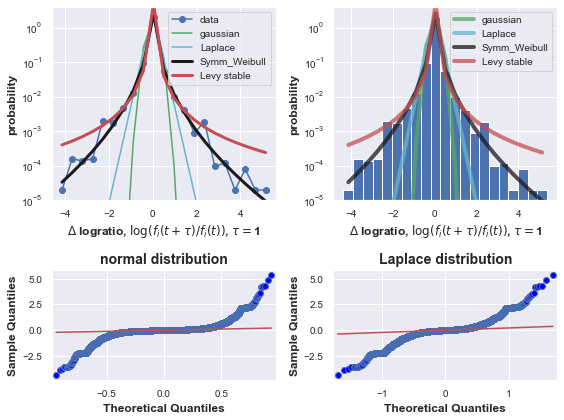

mean 0.00447493312142992 0.0 sigma 0.22177204415458054 0.22177204415458054
error= 4.590106073010247e-12
k=  0.5142 ;  lambda=  0.0492
Levy parameters quick estimate = (1.16645487827126, -0.017612235183291802, 0.004642090358389259, 0.044506616454909546)


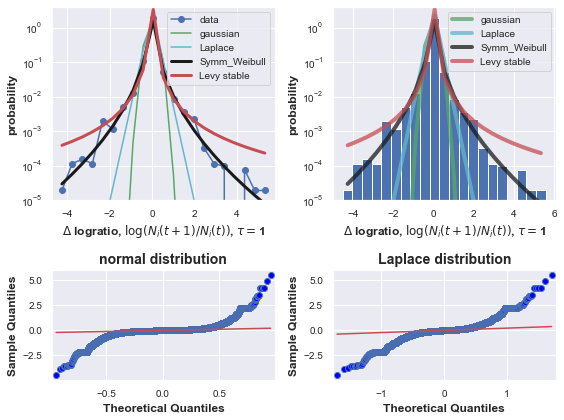

In [5]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot, years,title=None)

years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaLogRatio_distribution(df_metro_time, naics_keys_to_plot, years,title=None,
                               xlabel=r'$\Delta$ logratio, $\log(N_i(t+1)/N_i(t))$')

##### The distribution without imputed values

for nonimputed values
mean -0.0004860005194821732 0.0 sigma 0.12720085129860847 0.12720085129860847
error= 7.105427357601002e-15
k=  0.5465 ;  lambda=  0.0333
Levy parameters quick estimate = (1.3017629729865685, -0.021780934327421928, 0.0003812697784196265, 0.04004829726824573)


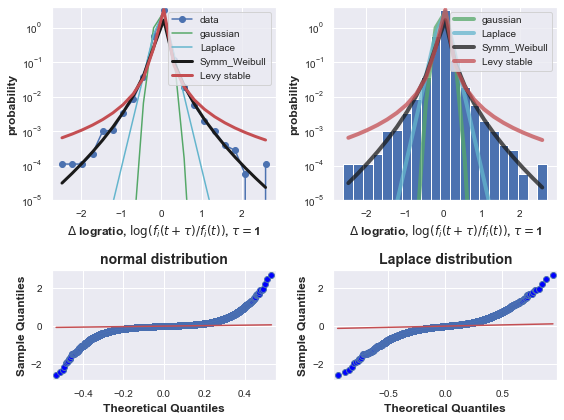

mean 0.0070257353158169585 0.0 sigma 0.13047342840744452 0.13047342840744452
error= 1.4210854715202004e-14
k=  0.5553 ;  lambda=  0.0356
Levy parameters quick estimate = (1.3142612313318702, -0.04927791977787521, 0.009743451076362611, 0.04265325840695967)


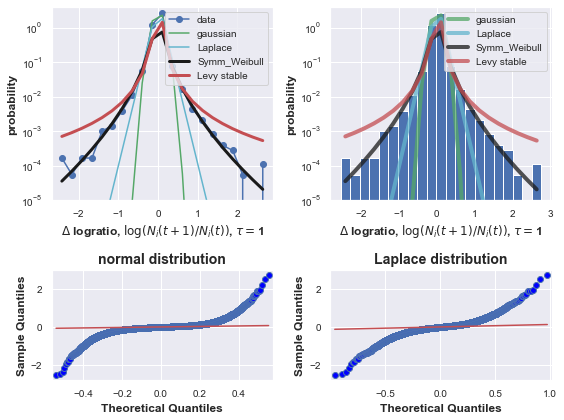

In [6]:
print ('for nonimputed values')
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot, years,title=None,remove_imputed_values=True)

years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaLogRatio_distribution(df_metro_time, naics_keys_to_plot, years,title=None,
                               xlabel=r'$\Delta$ logratio, $\log(N_i(t+1)/N_i(t))$',remove_imputed_values=True)

### Imputation created rare large jumps, but doesn't affect powerlaw form

In [2]:
def compare_imputation_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot, years,title=None,
                                   xlabel=r'$\Delta$ logratio, $\log(f_i(t+\tau)/f_i(t))$',
                                   tau=1):    
      
    
    
    logratio_change_naics=[]
    logratio_change_naics_nonimputed=[]
    msas = df_metroF_time['msa'].values
    n_msas = len(msas)
    for i in range(len(years)-tau):
        year=years[i]
        year2=years[i+tau]
        naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
        naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
        total_yr = ['total-Y'+year]

        ##removed_imputed_values:           
        emp1, non_imputed_idx1=get_nonimputed_data(df_metroF_time,naics_keys_to_plot,year)
        emp2, non_imputed_idx2=get_nonimputed_data(df_metroF_time,naics_keys_to_plot,year2)
        non_imputed_idx=np.intersect1d(non_imputed_idx1,non_imputed_idx2,assume_unique=True)
        empF_naics1_nonimputed=emp1[non_imputed_idx]
        empF_naics2_nonimputed=emp2[non_imputed_idx]
        ratio_change_naics_yr=np.ravel(empF_naics2_nonimputed[empF_naics1_nonimputed>0]*1./empF_naics1_nonimputed[empF_naics1_nonimputed>0])    
        logratio_change_naics_nonimputed.extend(np.log(ratio_change_naics_yr[ratio_change_naics_yr>0.]))
    
        ## not removed imputed
        empF_naics1 = df_metroF_time[naics_yr].values
        empF_naics2 = df_metroF_time[naics_yr2].values
        ratio_change_naics_yr=np.ravel(empF_naics2[empF_naics1>0]*1./empF_naics1[empF_naics1>0])    
        logratio_change_naics.extend(np.log(ratio_change_naics_yr[ratio_change_naics_yr>0.]))
    
    logratio_change_naics=np.array(logratio_change_naics)
    print ('size of logratio change naics=', np.shape(logratio_change_naics),print ('size of logratio change naics=', np.size(logratio_change_naics)))
    n_bins=21 ## odd is symmetric
    histogram, bins_data = np.histogram(logratio_change_naics, bins=n_bins, density=True)
    bin_centers = 0.5*(bins_data [1:] + bins_data [:-1])

    histogram_nonimputed, bins_data  = np.histogram(logratio_change_naics_nonimputed, 
                                                         bins=bins_data , density=True)
    
    
#     histogram_nonimputed, bins_nonimputed = np.histogram(logratio_change_naics_nonimputed, bins=n_bins, density=True)
#     bin_centers_nonimputed = 0.5*(bins_nonimputed[1:] + bins_nonimputed[:-1])
    
    suppress_plots=False
    if suppress_plots==True: return 0
    fig, (ax1,ax2) = plt.subplots(1, 2,figsize=(8, 4))

    ax1.hist(logratio_change_naics,bins=bins_data,density=True,label='with imputation')
    ax1.hist(logratio_change_naics_nonimputed,bins=bins_data,density=True,label='without imputation')
    ax1.legend(loc='best')
    #     ax1.plot(bin_centers,histogram,'-o',label='data')
#     ax1.plot(bin_centers,scipy.stats.norm.pdf(bin_centers,loc=mu,scale=sigma),
#              'g-',label='gaussian')
#     ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu,scale=b_laplace),
#              'c-',label='Laplace')
#     if error<1e-3:
#         ax1.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
#                  'k-',lw=3,label='Symm_Weibull')
#     else:
#         ax1.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
#              'c-',label='error Symm_Weibull')
    
#     ax1.plot(bin_centers, levy_stable.pdf(bin_centers,guess_params[0],guess_params[1], 
#                     loc=guess_params[2],scale=guess_params[3]),'r-',lw=3,label='Levy stable')
#     ax1.legend(loc='best')
#     ax2 = fig.add_subplot(2,2,2)
    
#     ax2.plot(bin_centers,scipy.stats.norm.pdf(bin_centers,loc=mu,scale=sigma),
#              'g-',label='gaussian',linewidth=4,alpha=0.75)
#     ax2.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu,scale=b_laplace),
#              'c-',label='Laplace',linewidth=4,alpha=0.75)
    
#     if error<1e-3:
#         ax2.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
#              'k-',label='Symm_Weibull',linewidth=4,alpha=0.75)
#     else:
#         ax2.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
#              'k--',label='error Symm_Weibull',linewidth=4,alpha=0.75)
    
#     ax2.plot(bin_centers, levy_stable.pdf(bin_centers,guess_params[0],guess_params[1], 
#                     loc=guess_params[2],scale=guess_params[3]),'r-',lw=4, alpha=0.75,label='Levy stable')   
#     ax2.legend(loc='best')


    for ax in [ax1]:
        ax.set_ylabel(r'probability')
        ax.set_xlabel(xlabel+r', $\tau=$'+str(tau))
        ax.set_ylim(1e-5,4.)
        ax.set_yscale('log')

    fig.patch.set_facecolor('white')

    if title is not None:
        ax2.set_title(title)
        ax1.set_title(title)
    plt.tight_layout()

    
    plt.show()

size of logratio change naics= 108824
size of logratio change naics= (108824,) None


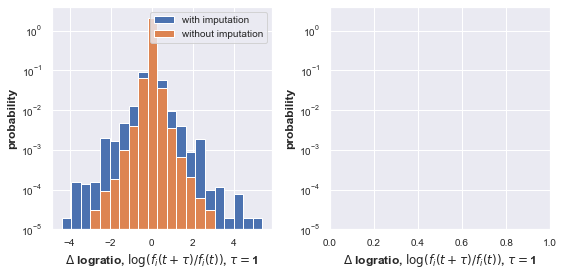

In [73]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
compare_imputation_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot, years,title=None)

### for different time intervals
How does the pdf change over time? Do the inferred parameters change in a systematic fashion?


In [8]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot, years,title=None,tau=2)

years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot, years,title=None,tau=4)

years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot, years,title=None,tau=8)

error= 2.1316282072803006e-14
k=  0.4814 ;  lambda=  0.0345
Levy parameters quick estimate = (1.2070442024891395, -0.03631045860833251, 2.220446049250313e-16, 0.06495077670320826)
error= 1.7767121107681305e-11
k=  0.5169 ;  lambda=  0.0526
Levy parameters quick estimate = (1.2568494803518369, -0.05691257825014773, 2.220446049250313e-16, 0.0964637605812556)
error= 3.552713678800501e-15
k=  0.5577 ;  lambda=  0.0778
Levy parameters quick estimate = (1.3629633538815076, -0.04873379383857733, 2.220446049250313e-16, 0.14444414758176038)


0

for $\tau=1,2,4,8$; $k=0.45,0.48,0.52,.56$ and $\lambda=.023,.034,.053,0.78$
i.e., this is sort of consistent with

$k\sim 0.03 \log_2 \frac{\tau}{\tau_0}$ 
and $\lambda = \lambda^{\frac{\tau}{\tau_0}}$

if so this would be equivalent to rescaling jumps by $\tau$?? Need to check this systematically.

In [7]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])

params_list={'weibull_k':[],'weibull_lambda':[],
                    'levy_params_est':[],
                    'removed_imputation':[],
                   'tau':[]}
for taui in range(1,15):
    print (taui)
    params=plot_DeltaLogRatio_distribution(df_metroF_time, naics_keys_to_plot,years,
                                           tau=taui,remove_imputed_values=True,return_fit_vals=True)   
    for p_name in ['weibull_k','weibull_lambda','levy_params_est','tau','removed_imputation']:
        params_list[p_name].append(params[p_name])
    

1
mean -0.0004860005194821732 0.0 sigma 0.12720085129860847 0.12720085129860847
error= 7.105427357601002e-15
k=  0.5465 ;  lambda=  0.0333
Levy parameters quick estimate = (1.3017629729865685, -0.021780934327421928, 0.0003812697784196265, 0.04004829726824573)
2
mean -0.0023875445526295885 0.0 sigma 0.16256695692262552 0.16256695692262552
error= 1.4210854715202004e-14
k=  0.6245 ;  lambda=  0.0583
Levy parameters quick estimate = (1.33714414709937, -0.052773290572284304, 0.0007104315221246518, 0.058258311783705774)
3
mean -0.003914155739301534 0.0 sigma 0.18666354651233824 0.18666354651233824
error= 3.552713678800501e-15
k=  0.6662 ;  lambda=  0.0761
Levy parameters quick estimate = (1.3596164226930731, -0.05040386758980326, 2.220446049250313e-16, 0.07203938177028027)
4
mean -0.00539401578364073 0.0 sigma 0.206736149617909 0.206736149617909
error= 6.394884621840902e-14
k=  0.7061 ;  lambda=  0.0936
Levy parameters quick estimate = (1.3766069034513992, -0.06443872119740722, 2.28073611154

##### for Levy- not MLE estimates!
levy_stable.pdf(x, alpha, beta, loc, scale) is identically equivalent to levy_stable.pdf(y, alpha, beta) / scale with y = (x - loc) / scale. 



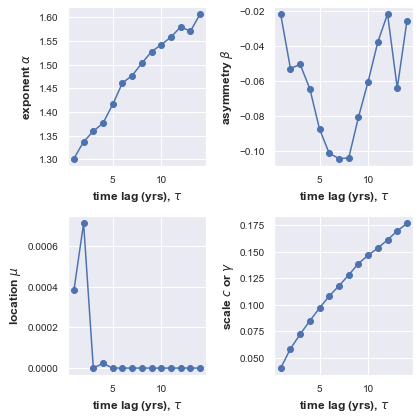

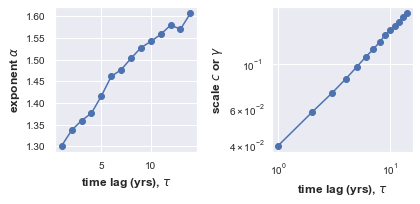

In [8]:
## levy
fig = plt.figure(figsize=(6, 6))
ax1 = fig.add_subplot(2,2,1)
ax1.plot(params_list['tau'],np.asarray(params_list['levy_params_est'])[:,0],'-o')
ax1.set_ylabel(r'exponent $\alpha$')

ax2 = fig.add_subplot(2,2,2)
ax2.plot(params_list['tau'],np.asarray(params_list['levy_params_est'])[:,1],'-o')
ax2.set_ylabel(r'asymmetry $\beta$')

ax3 = fig.add_subplot(2,2,3)
ax3.plot(params_list['tau'],np.asarray(params_list['levy_params_est'])[:,2],'-o')
ax3.set_ylabel(r'location $\mu$')

ax4 = fig.add_subplot(2,2,4)
ax4.plot(params_list['tau'],np.asarray(params_list['levy_params_est'])[:,3],'-o')
ax4.set_ylabel(r'scale $c$ or $\gamma$')

for ax in [ax1,ax2,ax3,ax4]:
    ax.set_xlabel(r'time lag (yrs), $\tau$')
fig.patch.set_facecolor('white')
plt.tight_layout()


fig2 = plt.figure(figsize=(6, 3))
ax1 = fig2.add_subplot(1,2,1)
ax1.plot(params_list['tau'],np.asarray(params_list['levy_params_est'])[:,0],'-o')
ax1.set_ylabel(r'exponent $\alpha$')
ax2 = fig2.add_subplot(1,2,2)
ax2.plot(params_list['tau'],np.asarray(params_list['levy_params_est'])[:,3],'-o')
ax2.set_ylabel(r'scale $c$ or $\gamma$')

ax2.set_xscale('log')
ax2.set_yscale('log')


for ax in [ax1,ax2]:
    ax.set_xlabel(r'time lag (yrs), $\tau$')

plt.tight_layout()

plt.show()

##### for Weibull

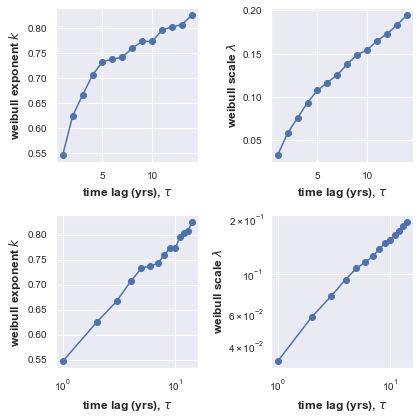

In [9]:
##weibull
fig2 = plt.figure(figsize=(6, 6))
ax1 = fig2.add_subplot(2,2,1)
ax1.plot(params_list['tau'],np.asarray(params_list['weibull_k']),'-o')
ax1.set_ylabel(r'weibull exponent $k$')

ax2 = fig2.add_subplot(2,2,2)
ax2.plot(params_list['tau'],np.asarray(params_list['weibull_lambda']),'-o')
ax2.set_ylabel(r'weibull scale $\lambda$')

ax3 = fig2.add_subplot(2,2,3)
ax3.plot(params_list['tau'],np.asarray(params_list['weibull_k']),'-o')
ax3.set_ylabel(r'weibull exponent $k$')
ax3.set_xscale('log')

ax4 = fig2.add_subplot(2,2,4)
ax4.plot(params_list['tau'],np.asarray(params_list['weibull_lambda']),'-o')
ax4.set_ylabel(r'weibull scale $\lambda$')
ax4.set_xscale('log')
ax4.set_yscale('log')

for ax in [ax1,ax2,ax3,ax4]:
    ax.set_xlabel(r'time lag (yrs), $\tau$')
    
plt.tight_layout()
plt.show()

#### for SLRM

### for different industrial categories

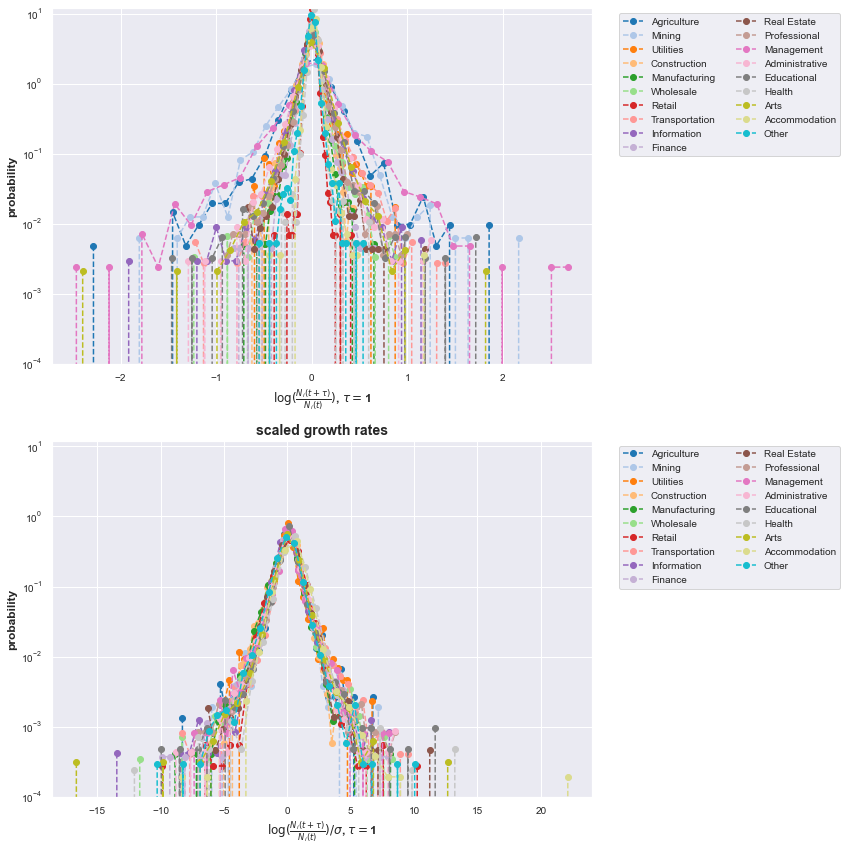

In [6]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
shared_func.plot_DeltaLogRatio_by_naics(df_metro_time, naics_keys_to_plot, 
                                            years,remove_imputed_values=True,
                                            xlabel=r'$\log(\frac{N_i(t+\tau)}{N_i(t)})$')


In [8]:
naics_keys_to_plot

['naics_11',
 'naics_21',
 'naics_22',
 'naics_23',
 'naics_31',
 'naics_42',
 'naics_44',
 'naics_48',
 'naics_51',
 'naics_52',
 'naics_53',
 'naics_54',
 'naics_55',
 'naics_56',
 'naics_61',
 'naics_62',
 'naics_71',
 'naics_72',
 'naics_81']

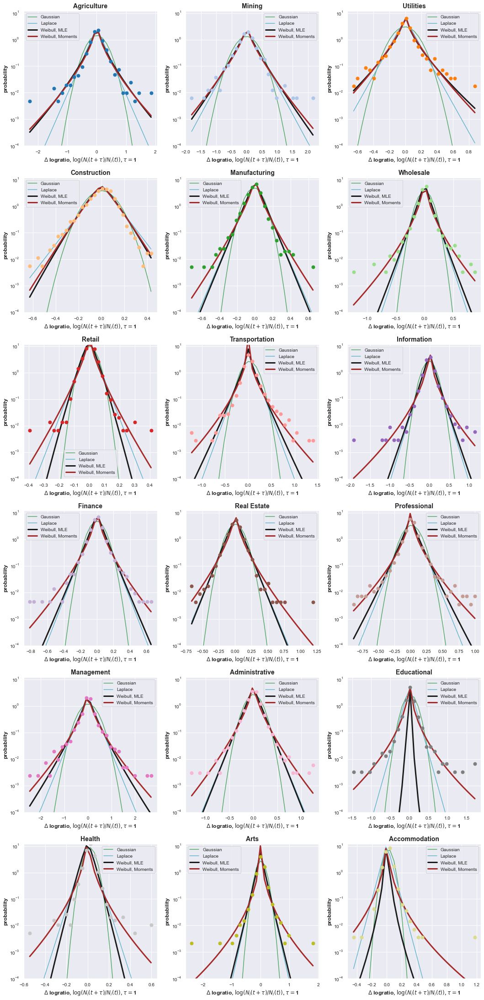

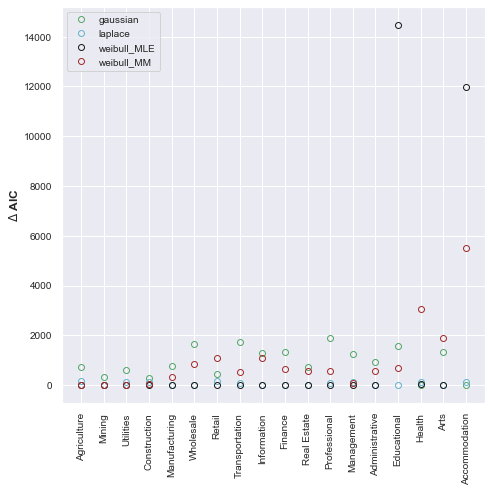

In [9]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['81','99'])
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
# warnings.filterwarnings("ignore", message="Numerical issues were encountered ")
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shared_func.plot_DeltaLogRatio_fit_by_naics(df_metro_time, naics_keys_to_plot, 
                                                years,remove_imputed_values=True,
                                                xlabel=r'$\Delta$ logratio, $\log(N_i(t+\tau)/N_i(t))$')


In [8]:
naics_keys_to_plot

['naics_11',
 'naics_21',
 'naics_22',
 'naics_23',
 'naics_31',
 'naics_42',
 'naics_44',
 'naics_48',
 'naics_51',
 'naics_52',
 'naics_53',
 'naics_54',
 'naics_55',
 'naics_56',
 'naics_61',
 'naics_62',
 'naics_71',
 'naics_72']

t/tau=  2.63e-03 ;  b/d=  8.09e-01 loc & scale are fixed= 0.0 1.0
t/tau=  4.09e-03 ;  b/d=  1.24e+00 loc & scale are fixed= 0.0 1.0
t/tau=  1.76e-03 ;  b/d=  1.30e+00 loc & scale are fixed= 0.0 1.0
t/tau=  6.50e-03 ;  b/d=  7.24e-01 loc & scale are fixed= 0.0 1.0
t/tau=  6.57e-03 ;  b/d=  1.32e+00 loc & scale are fixed= 0.0 1.0
t/tau=  1.88e-03 ;  b/d=  2.31e+00 loc & scale are fixed= 0.0 1.0
len is 6
[ -996.48449927 -1305.82117109 -3025.98213456   218.19644884
 -1049.16677111 -4417.27501563]
[-972.2924912740507, -1300.0838033254781, -2985.4979921952913, 244.79478878870128, -997.1530686754313, -4341.274227409772]
[-996.4844992685939, -1305.8211710851183, -3025.9821345641685, 218.19644883668306, -1049.166771114135, -4417.2750156274]


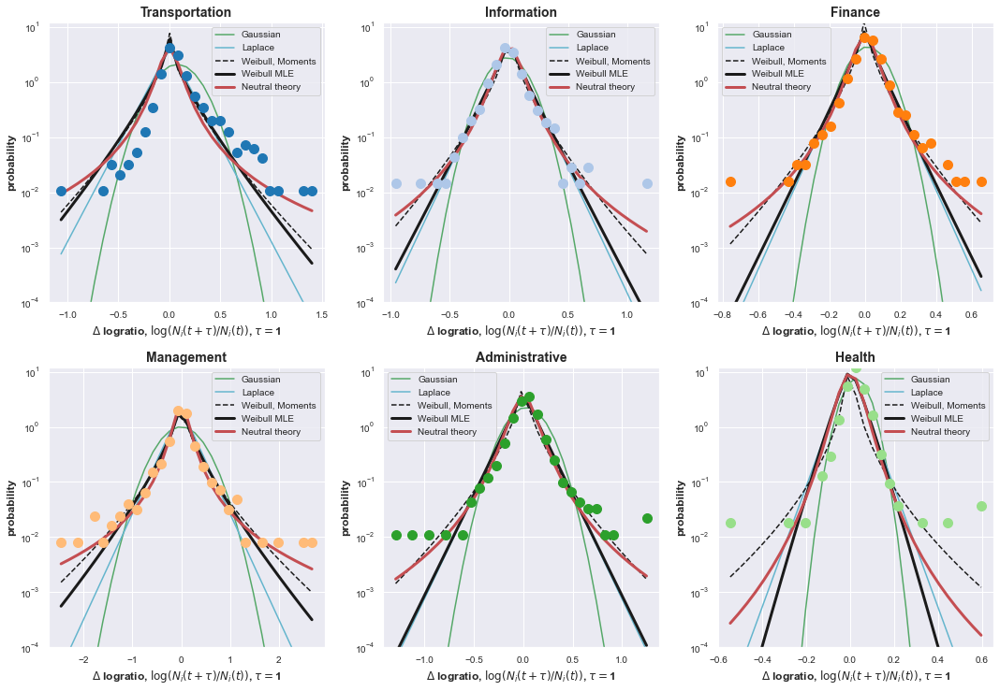

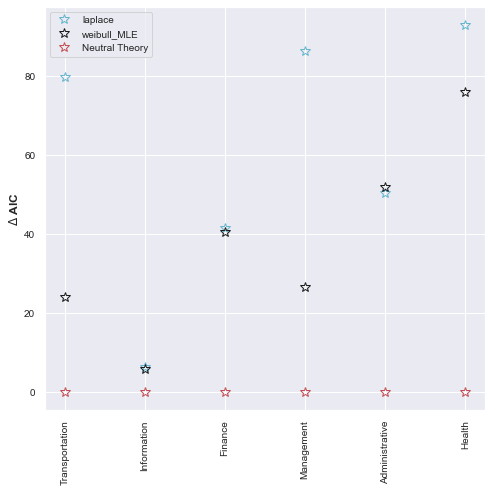

In [30]:
# _, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
#     df_2018["naics"], naics_resolution=2, drop_list=['81','99'])
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['11','21','22','23','31','42', '44',                                                   
                                                    '53','54','61','71','72','81','99'])

# years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]

years = [k.zfill(2) for k in np.arange(2, 7).astype(int).astype(str)]
# warnings.filterwarnings("ignore", message="Numerical issues were encountered ")
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shared_func.plot_DeltaLogRatio_fit_by_naics(df_metro_time, naics_keys_to_plot, 
                                                years,remove_imputed_values=True,
                                                xlabel=r'$\Delta$ logratio, $\log(N_i(t+\tau)/N_i(t))$')


t/tau=  9.93e-03 ;  b/d=  1.07e+00 loc & scale are fixed= 0.0 1.0
t/tau=  2.06e-02 ;  b/d=  1.28e+00 loc & scale are fixed= 0.0 1.0
t/tau=  1.28e-03 ;  b/d=  8.49e-01 loc & scale are fixed= 0.0 1.0
t/tau=  9.43e-03 ;  b/d=  2.72e+00 loc & scale are fixed= 0.0 1.0
t/tau=  2.25e-03 ;  b/d=  1.61e+00 loc & scale are fixed= 0.0 1.0
t/tau=  1.83e-03 ;  b/d=  1.21e+00 loc & scale are fixed= 0.0 1.0
t/tau=  1.40e-03 ;  b/d=  2.81e+00 loc & scale are fixed= 0.0 1.0
t/tau=  2.46e-03 ;  b/d=  1.03e+00 loc & scale are fixed= 0.0 1.0
t/tau=  3.77e-03 ;  b/d=  1.29e+00 loc & scale are fixed= 0.0 1.0
t/tau=  1.55e-03 ;  b/d=  1.37e+00 loc & scale are fixed= 0.0 1.0
t/tau=  4.24e-03 ;  b/d=  1.72e+00 loc & scale are fixed= 0.0 1.0
t/tau=  1.80e-03 ;  b/d=  1.10e+00 loc & scale are fixed= 0.0 1.0
t/tau=  7.16e-03 ;  b/d=  8.09e-01 loc & scale are fixed= 0.0 1.0
t/tau=  6.27e-03 ;  b/d=  1.50e+00 loc & scale are fixed= 0.0 1.0
t/tau=  1.95e-03 ;  b/d=  9.90e-01 loc & scale are fixed= 0.0 1.0
t/tau=  1.

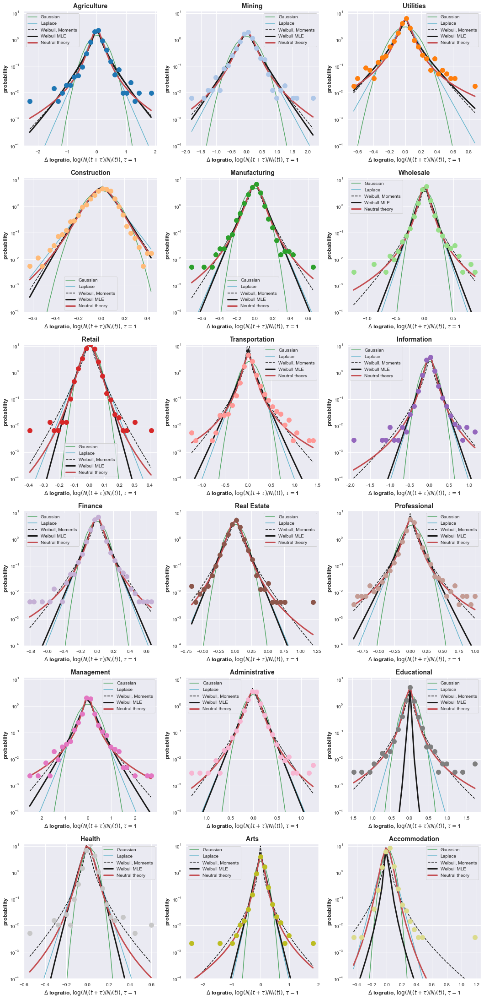

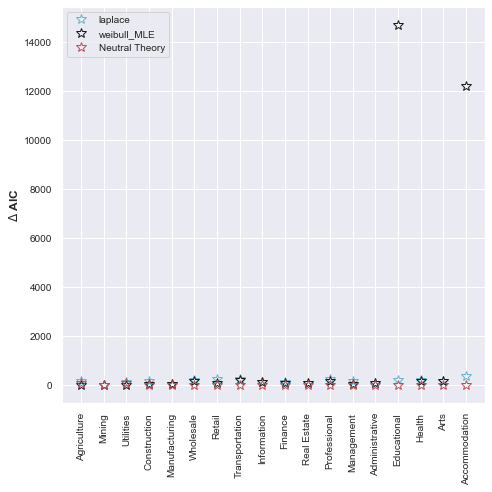

In [32]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['81','99'])

years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]

# warnings.filterwarnings("ignore", message="Numerical issues were encountered ")
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shared_func.plot_DeltaLogRatio_fit_by_naics(df_metro_time, naics_keys_to_plot, 
                                                years,remove_imputed_values=True,
                                                xlabel=r'$\Delta$ logratio, $\log(N_i(t+\tau)/N_i(t))$')


##### testing limits of neutral theory prediction

In [ ]:
class azaele_neutral_logG_smallt(scipy.stats.rv_continuous): 
    ## the distribution has two parameters: t/tau and b/D which we call tp and bd.
    ## distribution is for the logarithmic growth rates:= log[ x(t+delta t)/x(t)]
    
    '''
   actually not a function of t anymore, but we keep a dummy argument, don't use for fitting!
    '''   
    def _argcheck(self,tp, bd):
        return tp>0 and bd>0 #np.isfinite(k)  
    def _pdf(self, r, tp, bd):
        A=np.power(2,bd-1) *scipy.special.gamma(bd+1/2.) /(math.sqrt(math.pi) *scipy.special.gamma(bd))
#         l=np.exp(r)
#         q=np.exp(tp)
#         q2=np.exp(tp/2.)
        return A* (bd+1)/ ( np.tanh(r/2.)* np.power(np.sinh(r/2.),2*bd) )


In [ ]:
xvals=np.linspace(-5,5,10)
neutral_inst=shared_func.azaele_neutral_logG_distribution()
fig = plt.figure(figsize=(7,7))
ax1 = fig.add_subplot()

ax1.plot(xvals,neutral_inst.pdf(xvals, 1e-3, 1., loc=0,scale= 0),'k-')

ax1.plot(xvals,neutral_inst.pdf(xvals, 1e-3, 1., loc=0,scale= 0),'k-')


fig.patch.set_facecolor('white')
plt.tight_layout()

##### plot of one at a time.

Agriculture  is in:  Agriculture, Forestry, Fishing and Hunting
mean -0.020097874900507177 0.0 -0.020097874900507177 sigma 0.5026330775475756 0.5026330775475756 skewness -0.41146207252981876 kurtosis 8.750053595132126 weird coincidence -0.03146633464712023
[5.52446977e-13]
k=  [0.63888602]
[5.52446977e-13]


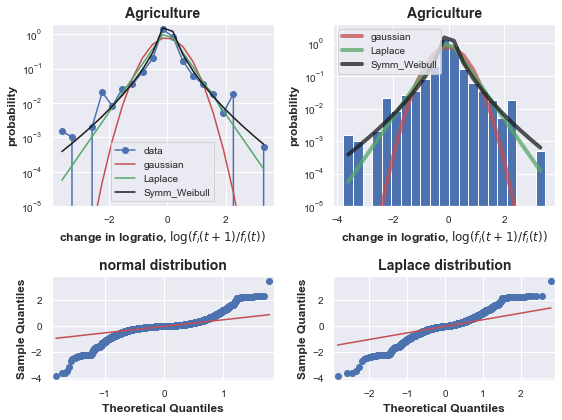

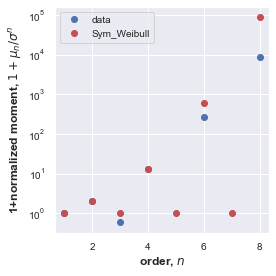

In [26]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
sector='Agriculture'
naics_key=naics_from_sector(sector, df_naics_ref, df_2018["naics"], naics_resolution=2)
plot_DeltaLogRatio_distribution(df_metroF_time,[naics_key], years,title=sector)

Management  is in:  Management of Companies and Enterprises
mean 0.007174578862628734 0.0 sigma 0.3983367233579314 0.3983367233579314
error= 3.552713678800501e-15
k=  0.5220 ;  lambda=  0.0652
Levy parameters quick estimate = (1.0968911567725286, -0.0229781520537507, 0.007605119208541827, 0.10222186555460953)


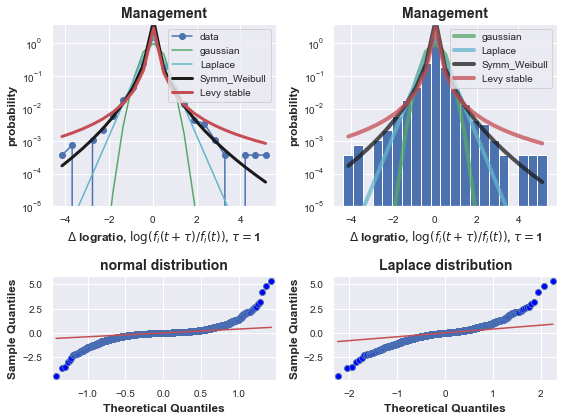

In [15]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
sector='Management'
naics_key=naics_from_sector(sector, df_naics_ref, df_2018["naics"], naics_resolution=2)
plot_DeltaLogRatio_distribution(df_metroF_time,[naics_key], years,title=sector)

Mining does look pretty laplace distributed!

Mining  is in:  Mining, Quarrying, and Oil and Gas Extraction
mean -0.015467622629623985 0.0 sigma 0.507917089867998 0.507917089867998
error= 3.375077994860476e-14
k=  0.6107 ;  lambda=  0.1227
Levy parameters quick estimate = (0.956856198948353, -0.03190994460293424, 2.220446049250313e-16, 0.09463888738997794)


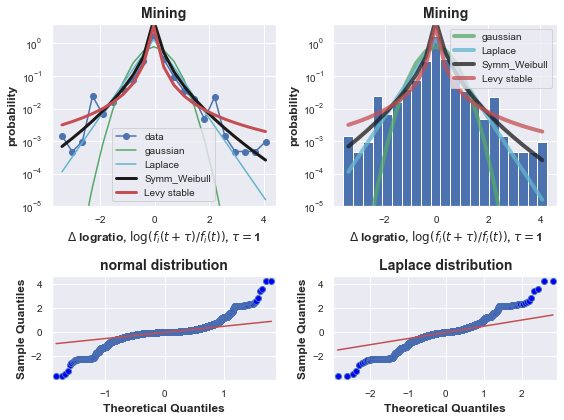

In [17]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
sector='Mining'
naics_key=naics_from_sector(sector, df_naics_ref, df_2018["naics"], naics_resolution=2)
plot_DeltaLogRatio_distribution(df_metroF_time,[naics_key], years,title=sector)

### rescaled aggregate logarithmic growth rates

rescaled by sigma of naics category

laplace and weibull are best. laplace does better in cbp data atleast..

weibull MLE, k=  1.0139 ;  lambda=  0.6820
weibull MM, k=  0.6702 ;  lambda=  0.4171
AIC dict= {'gaussian': [203280.42932757965], 'laplace': [185359.42488923864], 'weibull_MLE': [inf], 'weibull_MM': [-inf]}


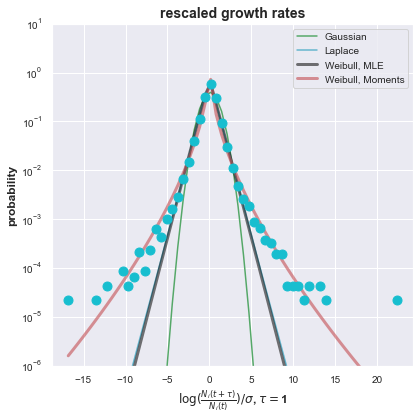

In [50]:

_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shared_func.plot_agg_rescaled_DeltaLogRatio_rescaled(df_metro_time, naics_keys_to_plot, 
                                            years,remove_imputed_values=True,
                                            xlabel=r'$\log(\frac{N_i(t+\tau)}{N_i(t)})$')


### standardized aggregate for different taus
shifted by mu and rescaled by sigma of naics category

as tau increases weibull starts doing a better job.

##### if shifted and rescaled.

AIC dict= {'gaussian': [201655.03070784887, 366169.6021246651, 503747.04442712374, 617040.7726723177, 706902.1499801696, 774469.1650543098], 'laplace': [181797.40865378114, 340330.8956711833, 475712.8727474268, 586676.3566688132, 674413.85914801, 740627.2405322836], 'weibull_MLE': [181783.29568763578, 340218.0178095309, 474971.91801738413, 585329.1034281282, 672568.4931859509, 738356.5876671333], 'taus': array([ 1,  3,  5,  7,  9, 11])}


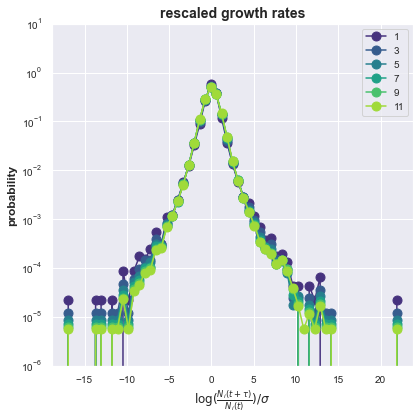

6 6


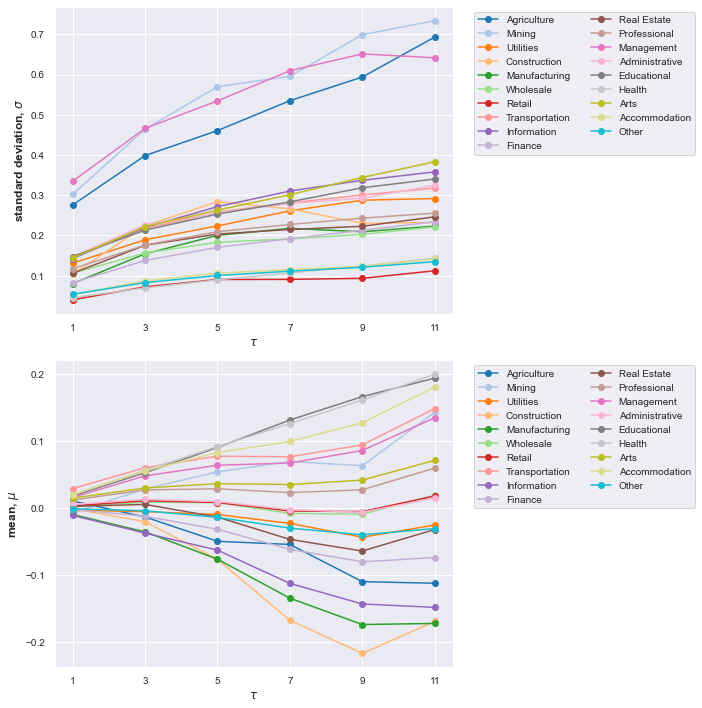

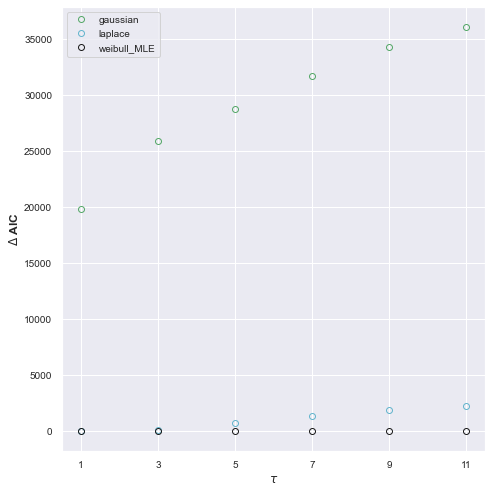

In [53]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
taus=np.arange(1,12,2)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shared_func.plot_agg_rescaled_DeltaLogRatio_taus(df_metro_time, naics_keys_to_plot, 
                                            years,taus=taus,
                                            remove_imputed_values=True,
                                            xlabel=r'$\log(\frac{N_i(t+\tau)}{N_i(t)})$')


#####  if just rescaled, without shifting, we still do reasonably well somehow

AIC dict= {'gaussian': [203280.42932757965, 372290.91398730443, 516510.18607085384, 639017.4531832024, 739365.7573406266, 814867.7298561616], 'laplace': [183991.60557657285, 347873.416565584, 490812.76067591005, 612674.8733603792, 712765.1676626377, 788259.6031119835], 'weibull_MLE': [183985.51001047532, 347663.29880410613, 489932.5905473744, 611055.3935588431, 710430.808501212, 785340.7136166833], 'taus': array([ 1,  3,  5,  7,  9, 11])}


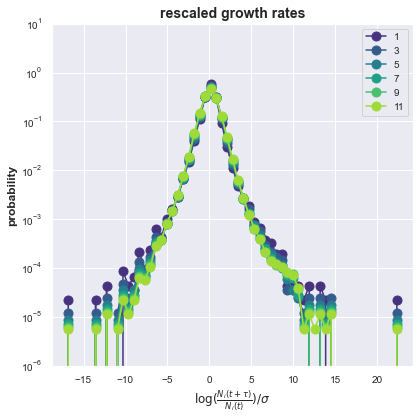

6 6


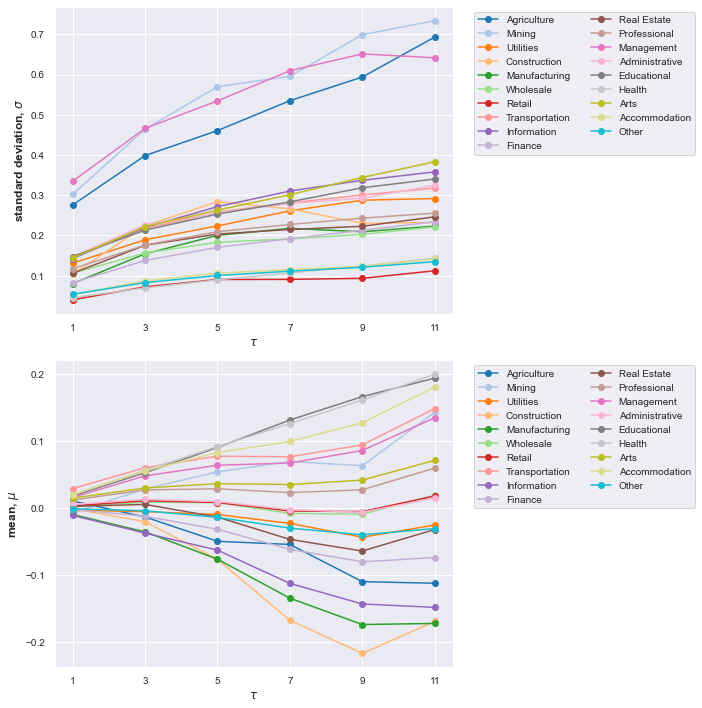

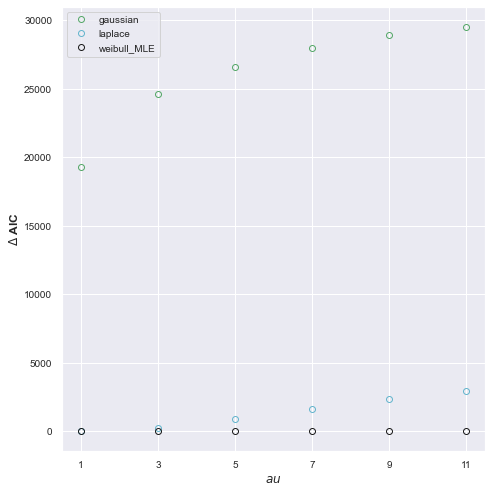

In [51]:
# _, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
#     df_2018["naics"], naics_resolution=2, drop_list=['99'])
# years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
# taus=np.arange(1,12,2)
# with warnings.catch_warnings():
#     warnings.simplefilter("ignore")
#     shared_func.plot_agg_rescaled_DeltaLogRatio_taus(df_metro_time, naics_keys_to_plot, 
#                                             years,taus=taus,
#                                             remove_imputed_values=True,
#                                             xlabel=r'$\log(\frac{N_i(t+\tau)}{N_i(t)})$')


##### compare shifted and scaled with just scaled agg fits
after shifting both weibull and laplace fit better. the difference between fits of shifted and unshifted is bigger than the difference of weibull and laplace for a particular category.

AIC dict= {'gaussian_shifted': [201655.03070784887, 366169.6021246651, 503747.04442712374, 617040.7726723177, 706902.1499801696, 774469.1650543098], 'laplace_shifted': [181797.40865378114, 340330.8956711833, 475712.8727474268, 586676.3566688132, 674413.85914801, 740627.2405322836], 'weibull_MLE_shifted': [181783.29568763578, 340218.0178095309, 474971.91801738413, 585329.1034281282, 672568.4931859509, 738356.5876671333], 'gaussian_scaled': [203280.42932757965, 372290.91398730443, 516510.18607085384, 639017.4531832024, 739365.7573406266, 814867.7298561616], 'laplace_scaled': [183991.60557657285, 347873.416565584, 490812.76067591005, 612674.8733603792, 712765.1676626377, 788259.6031119835], 'weibull_MLE_scaled': [183985.51001047532, 347663.29880410613, 489932.5905473744, 611055.3935588431, 710430.808501212, 785340.7136166833], 'taus': array([ 1,  3,  5,  7,  9, 11])}


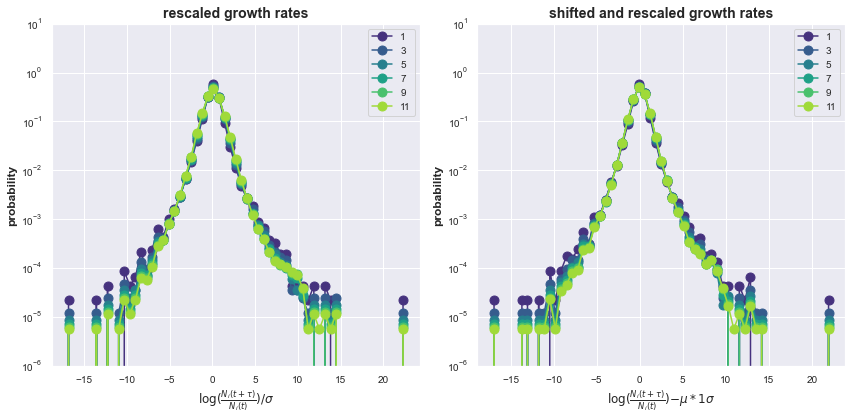

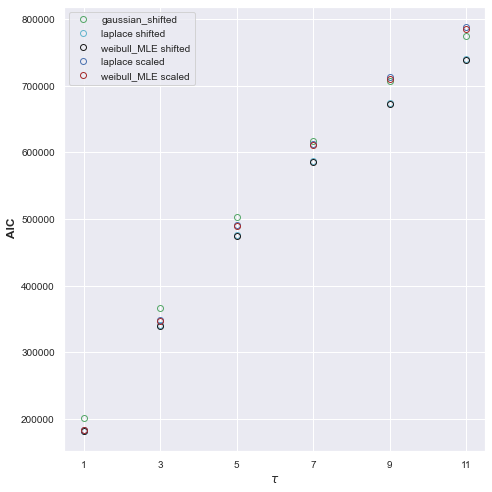

In [64]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
taus=np.arange(1,12,2)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shared_func.compare_shifted_scaled_agg_DeltaLogRatio_taus(df_metro_time, naics_keys_to_plot, 
                                            years,taus=taus,
                                            remove_imputed_values=True,
                                            xlabel=r'$\log(\frac{N_i(t+\tau)}{N_i(t)})$')




### big cities and all cities compare

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1833: RuntimeWarning: divide by zero encountered in log
  return log(self._pdf(x, *args))
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1833: RuntimeWarning: divide by zero encountered in log
  return log(self._pdf(x, *args))
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1833: RuntimeWarning: divide by zero encountered in log
  return log(self._pdf(x, *args))
/Users/ashish/Dropbox/research/James-research/city establishment data/shared_analysis_functions.py:81: RuntimeWarning: divide by zero encountered in power
  return k * np.power(np.abs(x),k-1.) * np.exp(-np.power(np.abs(x),k))/2.
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/stats/_distn_infrastructure.py:1833: RuntimeWarning: divide by zero encountered in log
  return log(self._pdf(x, *args))


AIC dict= {'gaussian': [], 'laplace': [-132246.1237705248, 183993.60557657285, -75836.89553274782, 87152.16263156563], 'weibull_MLE': [-135182.67881680405, 183987.6158317218, -76805.08303168451, 88281.3785776856], 'weibull_MM': []}


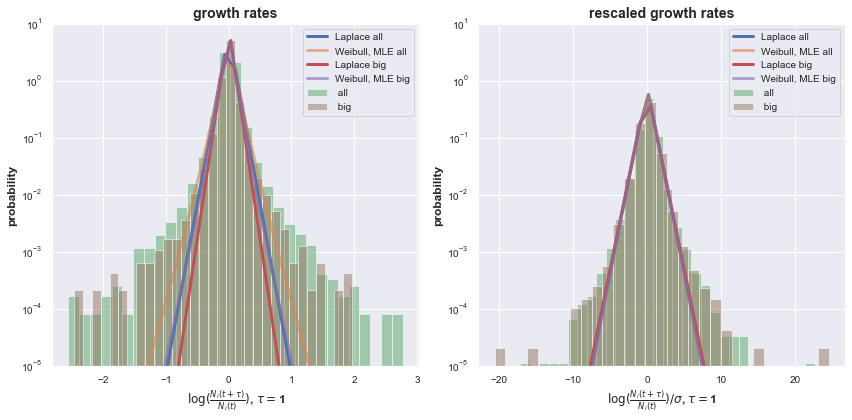

In [12]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
df_big_cities_time=shared_func.get_cities_based_on_size(df_metro_time, years [0],
                                                        big_only=True, BLS=False)

# with warnings.catch_warnings():
#     warnings.simplefilter("ignore")
shared_func.plot_compare_growth_of_big_and_all_cities(df_metro_time, df_big_cities_time, naics_keys_to_plot, 
                                        years,remove_imputed_values=True,
                                        xlabel=r'$\log(\frac{N_i(t+\tau)}{N_i(t)})$')

###  Notes on fitting levy distributions
currently mculloch quantile estimate is used. MLE method exists but takes long (~ N secs where N is number of data points)

MLE for levy stable would take ~418000 secs or 116 hours. as we have 418236 data points

testing: plot a random sample from a chosen levy dist and see what histogram looks like

(1.611953697198873, -0.03937436383331865, 0.02827794256741538, 1.0479682623533222)


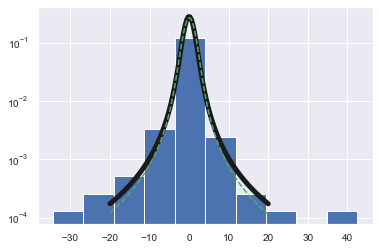

In [38]:
from scipy.stats import levy_stable
fig, ax = plt.subplots(1, 1)
alpha=1.5
beta=0.
scale=c=gamma=1.
loc=delta=mu=0.
x = np.linspace(-20,20, 100)
ax.plot(x, levy_stable.pdf(x,alpha,beta),'k-',label='true pdf',lw=5)


random_sample=levy_stable.rvs(alpha, beta, size=1000)
ax.hist(random_sample,density=True,label='sample')
## estimating parameters using Mculloch's method of comparing quantiles
guess_params=levy_stable._fitstart(random_sample)
print (guess_params)
ax.plot(x, levy_stable.pdf(x,guess_params[0],guess_params[1], 
                           loc=guess_params[2],scale=guess_params[3]),'g--',label='fitted pdf')

ax.set_yscale('log')
plt.show()

MLE is very slow, manually passing it the estimates doesn't make a difference as it uses these estimates anyway.

~1000 secs for data with 1000 points
~100 secs for data with 100 points



In [28]:
#
t0 = time.time()
fitted_params1=levy_stable.fit(random_sample)
print (fitted_params1)
t1 = time.time()
print ('time without initializing= ',t1-t0 )
t0 = time.time()
fitted_params2=levy_stable.fit(random_sample,guess_params[0],guess_params[1])
print (fitted_params2)
t1 = time.time()
print ('time with initializing= ',t1-t0 )

(1.278212827378016, -0.032122384355362195, 0.006220340796178099, 1.019040740087804)
time without initializing=  1025.9185421466827
(1.278212827378016, -0.032122384355362195, 0.006220340796178099, 1.019040740087804)
time with initializing=  1014.6176662445068


In [29]:
#
random_sample2=levy_stable.rvs(alpha, beta, size=100)
t0 = time.time()
fitted_params12=levy_stable.fit(random_sample2)
print (fitted_params12)
t1 = time.time()
print ('time for 100 points instead= ',t1-t0 )

(1.4276571663332651, -0.10520871967712643, 0.1560405361734041, 1.0430829544000138)
time for 100 points instead=  133.01682305335999


In [33]:
# if reparameterization is required
'''
stack overflow amnswer claims that the random variable generators uses a differnet parameterization 
and so one needs to convert the answer as follows.
Not sure if this difference in parameterization still exists though.
https://stackoverflow.com/questions/54564850/using-scipy-to-fit-a-levy-stable-distribution
'''

def convert_from_fit_to_rvgenerator (alpha, beta, mu, sigma):
    return alpha, beta, mu - sigma * beta * np.tan(np.pi * alpha / 2.0), sigma

print (convert_from_fit_to_rvgenerator (fitted_params1[0],fitted_params1[1],fitted_params1[2],fitted_params1[3]))

print (convert_from_fit_to_rvgenerator (fitted_params12[0],fitted_params12[1],fitted_params12[2],fitted_params12[3]))


(1.278212827378016, -0.032122384355362195, -0.06385292599634577, 1.019040740087804)
(1.4276571663332651, -0.10520871967712643, 0.01802299617075065, 1.0430829544000138)


MLE fit of the levy stable distributions can be quite slow. One option is to fit using pylevy instead which interpolates the levy stable dists, obtained from a table. These could then be used as an estimate for the usual MLE fit?

https://stackoverflow.com/questions/54564850/using-scipy-to-fit-a-levy-stable-distribution


last comment says that the parameterization used to generate random variables is different from the parameterization used for pdf!! That is a BIG issue

## fitting powerlaws to tail of log -growth

Calculating best minimal value for power law fit
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))


4.014053157963094


Calculating best minimal value for power law fit
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))


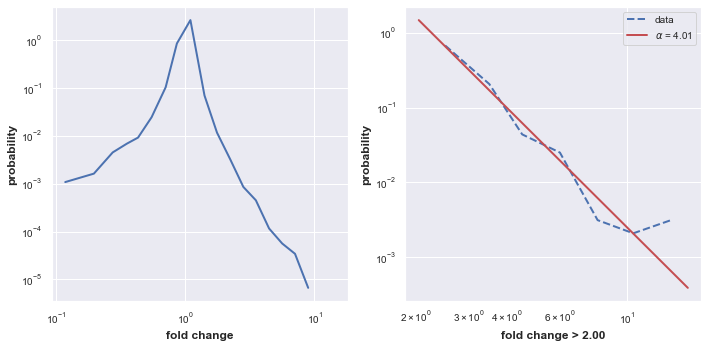

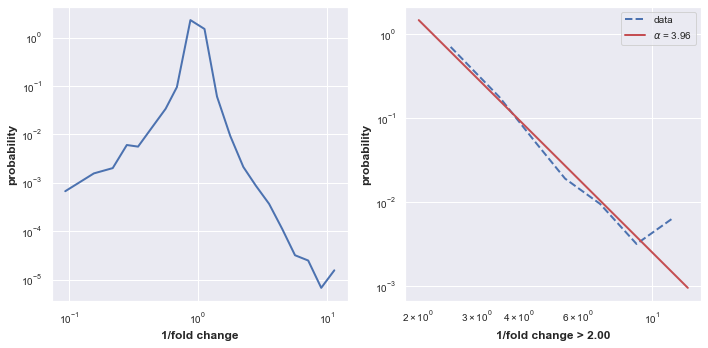

In [9]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
log_g=shared_func.plot_DeltaLogRatio_distribution_MLE(df_metro_time, naics_keys_to_plot, 
                                            years,
                                            tau=1,
                                            remove_imputed_values=True,
                                            xlabel=r'$\Delta$ logratio, $\log(N_i(t+\tau)/N_i(t))$',
                                            return_DeltaLogRatio=True)
fold_change=np.exp(log_g)

cutoff=2.

fit1=powerlaw.Fit(fold_change[fold_change>cutoff],discrete=False)
print (fit1.alpha)
fig2 = plt.figure(figsize=(10, 5))
ax1 = fig2.add_subplot(1,2,1)
ax2 = fig2.add_subplot(1,2,2)
powerlaw.plot_pdf(fold_change, ax=ax1, color='b',
                   linewidth=2)
fit1.plot_pdf(ax=ax2, color='b', linestyle='--',linewidth=2, label='data')
fit1.power_law.plot_pdf(ax=ax2, color='r', linewidth=2, 
                        label=r'$\alpha$ = '+str('{:.2f}'.format(fit1.alpha)))
ax2.legend(loc='best')
ax1.set_xlabel('fold change')
ax2.set_xlabel('fold change > {:.2f}'.format(cutoff))
for ax in [ax1,ax2]:
    ax.set_ylabel('probability')

plt.tight_layout()
    
inv_change=1./fold_change
fit_left=powerlaw.Fit(inv_change[inv_change>cutoff],discrete=False)
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
powerlaw.plot_pdf(inv_change, ax=ax1, color='b', linewidth=2)
fit_left.plot_pdf(ax=ax2, color='b',linestyle='--', linewidth=2, label='data')
fit_left.power_law.plot_pdf(ax=ax2, color='r', linewidth=2, 
                        label=r'$\alpha$ = '+str('{:.2f}'.format(fit_left.alpha)))
ax2.legend(loc='best')
ax1.set_xlabel('1/fold change')
ax2.set_xlabel('1/fold change > {:.2f}'.format(cutoff))
for ax in [ax1,ax2]:
    ax.set_ylabel('probability')
plt.tight_layout()  

plt.show()

Calculating best minimal value for power law fit
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))


4.0403729493333


Calculating best minimal value for power law fit
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide
  (Theoretical_CDF * (1 - Theoretical_CDF))


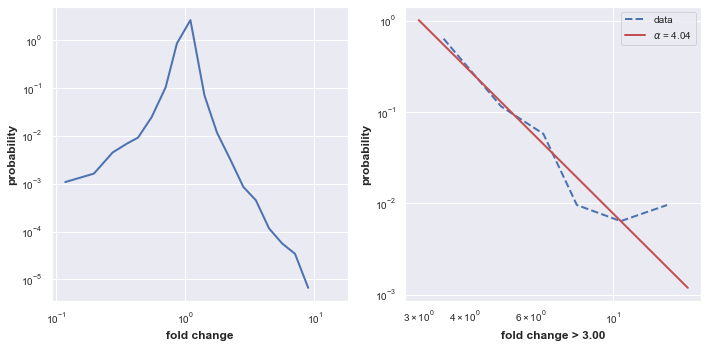

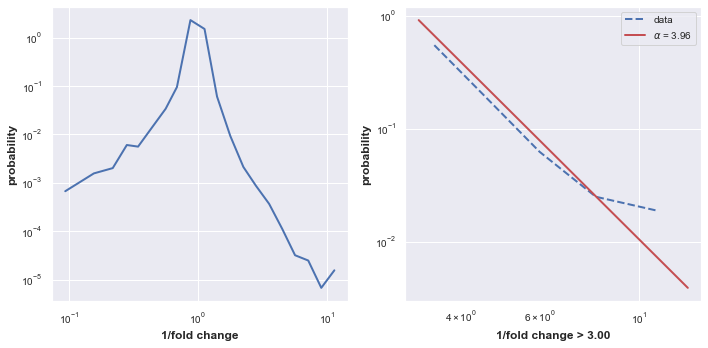

In [14]:
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
log_g=shared_func.plot_DeltaLogRatio_distribution_MLE(df_metro_time, naics_keys_to_plot, 
                                            years,
                                            tau=1,
                                            remove_imputed_values=True,
                                            xlabel=r'$\Delta$ logratio, $\log(N_i(t+\tau)/N_i(t))$',
                                            return_DeltaLogRatio=True)
fold_change=np.exp(log_g)

cutoff=3.

fit1=powerlaw.Fit(fold_change[fold_change>cutoff],discrete=False)
print (fit1.alpha)
fig2 = plt.figure(figsize=(10, 5))
ax1 = fig2.add_subplot(1,2,1)
ax2 = fig2.add_subplot(1,2,2)
powerlaw.plot_pdf(fold_change, ax=ax1, color='b',
                   linewidth=2)
fit1.plot_pdf(ax=ax2, color='b', linestyle='--',linewidth=2, label='data')
fit1.power_law.plot_pdf(ax=ax2, color='r', linewidth=2, 
                        label=r'$\alpha$ = '+str('{:.2f}'.format(fit1.alpha)))
ax2.legend(loc='best')
ax1.set_xlabel('fold change')
ax2.set_xlabel('fold change > {:.2f}'.format(cutoff))
for ax in [ax1,ax2]:
    ax.set_ylabel('probability')

plt.tight_layout()
    
inv_change=1./fold_change
fit_left=powerlaw.Fit(inv_change[inv_change>cutoff],discrete=False)
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
powerlaw.plot_pdf(inv_change, ax=ax1, color='b', linewidth=2)
fit_left.plot_pdf(ax=ax2, color='b',linestyle='--', linewidth=2, label='data')
fit_left.power_law.plot_pdf(ax=ax2, color='r', linewidth=2, 
                        label=r'$\alpha$ = '+str('{:.2f}'.format(fit_left.alpha)))
ax2.legend(loc='best')
ax1.set_xlabel('1/fold change')
ax2.set_xlabel('1/fold change > {:.2f}'.format(cutoff))
for ax in [ax1,ax2]:
    ax.set_ylabel('probability')
plt.tight_layout()  

plt.show()

## distribution of $f_{t+1}-f_t$ step sizes 

In [27]:


def plot_DeltaF_distribution(df_metroF_time, naics_keys_to_plot, years,title=None,
                                   xlabel=r'$\Delta f=f_i(t+\tau)-f_i(t)$',
                                   tau=1, scale_with_N=False,remove_imputed_values=False):    
    
    def L_of_x(x):
        c= 0.036534
        return np.log((x+c)/np.sqrt(2*np.pi))
    def invGamma_of_x(x):
        return L_of_x(x)/scipy.special.lambertw(L_of_x(x)/np.e) + 0.5   
    years2to7=[k.zfill(2) for k in np.arange(2, 7).astype(int).astype(str)]
    years7to18=[k.zfill(2) for k in np.arange(7, 18).astype(int).astype(str)]
    
    DeltaF_change_naics=[]
    msas = df_metroF_time['msa'].values
    n_msas = len(msas)  
    
    for i in range(len(years)-tau):
        year=years[i]
        year2=years[i+tau]
        naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
        naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
        total_yr = ['total-Y'+year]       
        if remove_imputed_values:           
            emp1, non_imputed_idx1=get_nonimputed_data(df_metroF_time,naics_keys_to_plot,year)
            emp2, non_imputed_idx2=get_nonimputed_data(df_metroF_time,naics_keys_to_plot,year2)
            non_imputed_idx=np.intersect1d(non_imputed_idx1,non_imputed_idx2,assume_unique=True)
            empF_naics1=emp1[non_imputed_idx]
            empF_naics2=emp2[non_imputed_idx]
        else:
            empF_naics1 = df_metroF_time[naics_yr].values
            empF_naics2 = df_metroF_time[naics_yr2].values
                        
        if scale_with_N ==True:            
            nonzero_idx=np.nonzero(empF_naics1)
#             delta_f=np.ravel(empF_naics2[nonzero_idx]-empF_naics1[nonzero_idx])
#             scalefactor=np.ravel(np.sqrt(1.*empF_naics1[nonzero_idx]))
            delta_f=empF_naics2[nonzero_idx]-empF_naics1[nonzero_idx]
            scalefactor=np.sqrt(1.*empF_naics1[nonzero_idx])
#             scaled_deltaf=(empF_naics2[nonzero_idx]-empF_naics1[nonzero_idx])*1./scalefactor
#             print(len(empF_naics1),len(empF_naics1[0]))

            ####### checking for outliers.
#             print ('years=', years[i], years[i+tau])
#             for c in range(len(empF_naics1)):
#                 for n in range(len(empF_naics1[0])):    
#                     if empF_naics1[c,n]>0:
#                         if np.abs(empF_naics2[c,n]-empF_naics1[c,n])>30*empF_naics1[c,n]:

#                                 print (c, n, df_metroF_time['msa_name'][c],df_metroF_time['msa'][c],
#                                        sector_from_naics(df_naics_ref, naics_keys_to_plot[n], shorten=True),
#                                        naics_keys_to_plot[n])
#                                 print ( empF_naics1[c,n], empF_naics2[c,n])
#                                 the_naics_all_yrs=[naics_keys_to_plot[n]+'-Y'+year for year in years]
#                                 print(df_metroF_time[the_naics_all_yrs].iloc[c].values)
                                
            
#             scalefactor=np.ravel(empF_naics1[nonzero_idx])
            DeltaF_change_naics.extend(np.ravel(delta_f/scalefactor))
        else:

            DeltaF_change_naics.extend(np.ravel(empF_naics2-empF_naics1))

    DeltaF_change_naics=np.array(DeltaF_change_naics)
    
    
    
    suppress_plots=False
    if suppress_plots==True: return 0
    
    n_bins=20 ## odd is symmetric
    histogram, bins = np.histogram(DeltaF_change_naics, bins=n_bins, density=True)
    bin_centers = 0.5*(bins[1:] + bins[:-1])

    mu=np.mean(DeltaF_change_naics)
    sigma=np.std(DeltaF_change_naics)
    b_laplace=sigma/np.sqrt(2)

    
    def func(k, ratio):
        return 0.5*scipy.special.gamma(1+4./k)/np.square(scipy.special.gamma(1+2./k))-ratio
    def symm_weibull_dis(x,k,l):
        return (k/l) * np.power((np.abs(x)/l),k-1.) * np.exp(-np.power((np.abs(x)/l),k)  )
    
    
    
    moment_ratio=stats.moment(DeltaF_change_naics,moment=4)/np.power(sigma,4)

    sol_result=  scipy.optimize.root(func, .5,args=moment_ratio)
#     print(sol_result)
    weibull_k=float(sol_result.x)
    error=np.abs(func(weibull_k,moment_ratio))
    print ('weibull fit error=',error)
    if error>1e-3:
        print('hybrid method failed')
        ctr=0
        methods_list=['lm','broyden1','broyden2','anderson','df-sane'
                      'linearmixing','diagbroyden','excitingmixing','krylov']
        while (error>1e-3 and ctr<8):
            sol_result=  scipy.optimize.root(func, .5,args=moment_ratio,
                                             method=methods_list[ctr])
            weibull_k=float(sol_result.x)
            error=np.abs(func(weibull_k,moment_ratio))
            print ('error=',error,'method=',methods_list[ctr])
            ctr+=1
        if error>1e-3:
            print('All methods failed!!')
    
    
    
    weibull_lambda= np.sqrt(np.square(sigma)/(2.*scipy.special.gamma(1.+2./weibull_k)) )
    print ('k= ',"{:.4f}".format(weibull_k),';  lambda= ',"{:.4f}".format(weibull_lambda))
    
    ### Mculloch estimate, not MLE which is very slow.
    guess_params=levy_stable._fitstart(DeltaF_change_naics)
    print ('Levy parameters quick estimate =',guess_params)
    
    
    

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(8, 6),
                                                 gridspec_kw={'height_ratios': [1.75, 1]})
#     ax1 = fig.add_subplot(2,2,1)
    ax1.plot(bin_centers,histogram,'-o',label='data')
    ax1.plot(bin_centers,scipy.stats.norm.pdf(bin_centers,loc=mu,scale=sigma),
             'g-',label='gaussian')
    ax1.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu,scale=b_laplace),
             'c-',label='Laplace')
    if error<1e-3:
        ax1.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
                 'k-',lw=3,label='Symm_Weibull')
    else:
        ax1.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
             'c-',label='error Symm_Weibull')
    
    ax1.plot(bin_centers, levy_stable.pdf(bin_centers,guess_params[0],guess_params[1], 
                    loc=guess_params[2],scale=guess_params[3]),'r-',lw=3,label='Levy stable')


#     ax1.legend(loc='best', fontsize=fontSizeSmall)
#     ax2 = fig.add_subplot(2,2,2)
    ax2.hist(DeltaF_change_naics,bins=n_bins,density=True)
    ax2.plot(bin_centers,scipy.stats.norm.pdf(bin_centers,loc=mu,scale=sigma),
             'g-',label='gaussian',linewidth=4,alpha=0.75)
    ax2.plot(bin_centers,scipy.stats.laplace.pdf(bin_centers,loc=mu,scale=b_laplace),
             'c-',label='Laplace',linewidth=4,alpha=0.75)
    
    if error<1e-3:
        ax2.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
             'k-',label='Symm_Weibull',linewidth=4,alpha=0.75)
    else:
        ax2.plot(bin_centers,symm_weibull_dis(bin_centers,weibull_k,weibull_lambda),
             'k--',label='error Symm_Weibull',linewidth=4,alpha=0.75)
    
    ax2.plot(bin_centers, levy_stable.pdf(bin_centers,guess_params[0],guess_params[1], 
                    loc=guess_params[2],scale=guess_params[3]),'r-',lw=4, alpha=0.75,label='Levy stable')
    
    
    ax2.legend(loc='best', fontsize=fontSizeSmall)


    for ax in [ax1,ax2]:
        ax.set_ylabel(r'probability')
        ax.set_xlabel(xlabel+r', $\tau=$'+str(tau))
        ax.set_ylim(1e-8,10.)
        ax.set_yscale('log')

    fig.patch.set_facecolor('white')
    from statsmodels.graphics.gofplots import qqplot
#     ax3 = fig.add_subplot(2,2,3)
    qqplot(DeltaF_change_naics,loc=mu,scale=sigma, line='s',ax=ax3)
    ax3.set_title('normal distribution')
#     ax4 = fig.add_subplot(2,2,4)
    qqplot(DeltaF_change_naics,dist=scipy.stats.laplace,loc=mu,scale=b_laplace, line='s',ax=ax4)
    ax4.set_title('Laplace distribution')
    if title is not None:
        ax2.set_title(title)
        ax1.set_title(title)
    plt.tight_layout()

#     fig3 = plt.figure(figsize=(4, 4))
#     ax1 = fig3.add_subplot()
    
#     nmzd_moments_data=[]
#     nmzd_moments_SymWeibull=[]
#     weibull_sigma=np.sqrt(2.*np.power(weibull_lambda,2)*scipy.special.gamma(1.+2./weibull_k))
#     for i in np.arange(1,9):
#         nmzd_moments_data.append(stats.moment(DeltaF_change_naics,moment=i
#                                              )/np.power(sigma,i))
#         if i%2==0:
#             nmzd_moments_SymWeibull.append(
#                 (2.*np.power(weibull_lambda,i)*scipy.special.gamma(1.+i*1./weibull_k))/(
#                     np.power(weibull_sigma,i)) )
#         else:
#              nmzd_moments_SymWeibull.append(0.)
            
#     ax1.plot(np.arange(1,9),1.+np.array(nmzd_moments_data),'bo',label='data')
#     ax1.plot(np.arange(1,9),1+np.array(nmzd_moments_SymWeibull),'ro',label='Sym_Weibull')
#     ax1.set_title('comparing moments without centering... need to calculate centered moments')
#     ax1.legend(loc='best')
#     ax1.set_xlabel('order, $n$')
#     ax1.set_ylabel(r'1+normalized moment, $1+\mu_n/ \sigma^n$')
#     ax1.set_yscale('log')
#     plt.tight_layout()

    plt.show()

For some reason some data predicts astronomical growth. This has to be some sort of data issue which I will have to look into. We need to find results that are robust to these weird points.

weibull fit error= 4.547473508864641e-13
k=  0.3057 ;  lambda=  0.0001
Levy parameters quick estimate = (1.117301439137488, 0.013556570847724058, 2.220446049250313e-16, 0.0013292370959105979)


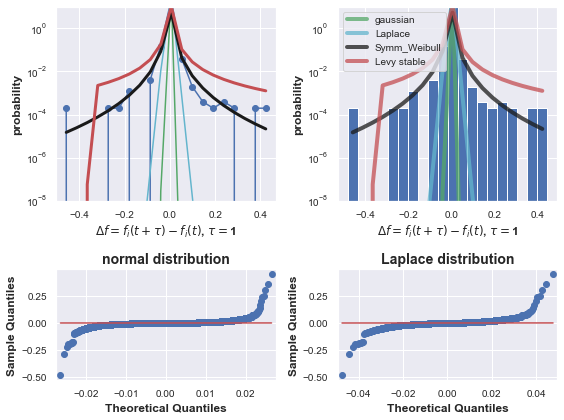

weibull fit error= 9580.01047693202
hybrid method failed
error= 3.2741809263825417e-11 method= lm
k=  0.2409 ;  lambda=  0.0291
Levy parameters quick estimate = (1.2397260925160307, 0.1458270090937258, 0.09245642370629994, 2.6660441793720544)


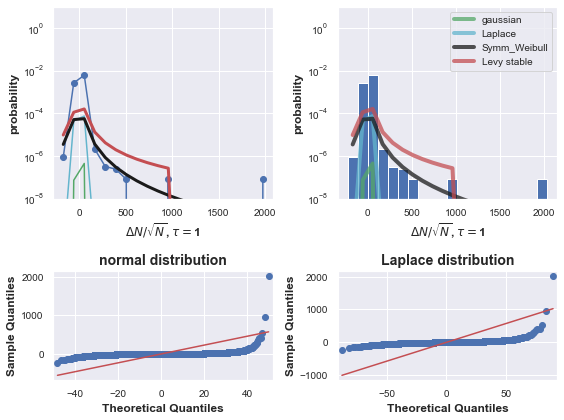

In [28]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaF_distribution(df_metroF_time, naics_keys_to_plot, years,title=None)

years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaF_distribution(df_metro_time, naics_keys_to_plot, years,title=None,
                               xlabel=r'$\Delta N/ \sqrt{N}$',scale_with_N=True)

##### for only nonimputed data

only non imputed data
weibull fit error= 2.644640062499093e-11
k=  0.4431 ;  lambda=  0.0005
Levy parameters quick estimate = (1.2089813699983003, 0.020876546601199548, 2.220446049250313e-16, 0.0016839706971597222)


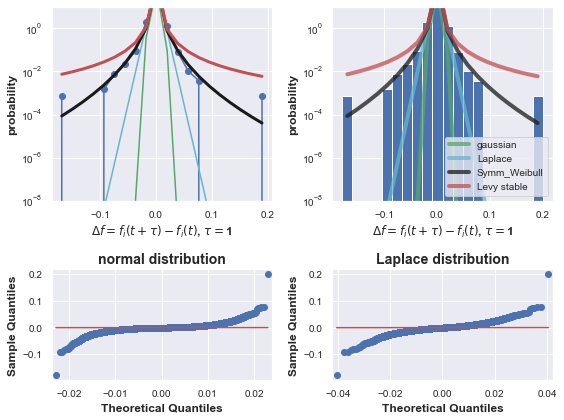

weibull fit error= 5.9969806898152456e-12
k=  0.4057 ;  lambda=  0.5768
Levy parameters quick estimate = (1.2988187230082393, 0.11636599869805231, 0.44869014598682866, 2.775347472176737)


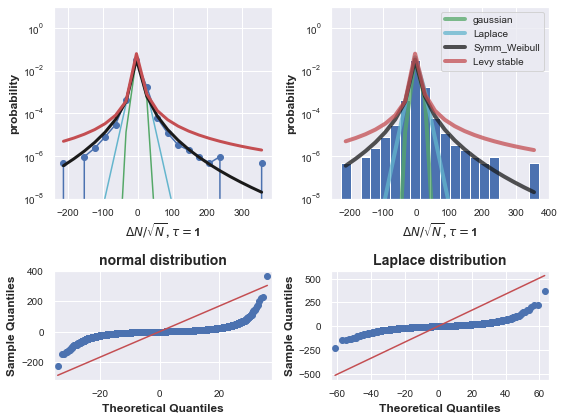

In [29]:
print ('only non imputed data')
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaF_distribution(df_metroF_time, naics_keys_to_plot, years,title=None,
                         remove_imputed_values=True)

years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_DeltaF_distribution(df_metro_time, naics_keys_to_plot, years,title=None,
                               xlabel=r'$\Delta N/ \sqrt{N}$',
                         scale_with_N=True,remove_imputed_values=True)

## pdf and Variance stratified by N

In [39]:

def get_df_deltaFY_and_N0(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True,T0=None
                             ):    
    '''
    if T0 is None,  run for all possible values of the initial year, T0, otherwise run for given initial yeaer
    removing all zeros in the data because we cannot divide by zero.
    '''

    logratio_change_naics=[]
    msas = df_metroF_time['msa'].values
#     df_deltaFY_popn_size={'N0':[],'Navg':[], 'Ntot0':[],'Ntotavg':[],'delta_logF':[],'deltaY':[]}
    n_msas = len(msas)
    N0, Navg, Ntot0, naics_list, delta_logF, delta_logN, delta_Y = ([] for i in range(7))
    
    if T0 is None: ## run for all possible values of the initial year, T0 given tau
        T0_arr=np.arange(len(years)-tau).astype(int)
    else: ##run for only one initial year, T0
        T0_arr=[years.index(T0)]
    
    for i in T0_arr:
        year1=years[i]
        year2=years[i+tau]
#         naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
#         naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
        total_yr1 = ['total-Y'+year1]
        total_yr2 = ['total-Y'+year2]
        
        for naics in naics_keys_to_plot:
            naics_y1 = naics+'-Y'+year1 
            naics_y2 = naics+'-Y'+year2         
            if remove_imputed_values: 
                imp_y1=naics+'_imputed-Y'+year1
                imp_y2=naics+'_imputed-Y'+year2
#                 print (np.where(df_metroF_time[imp_y1].values==False)[0] )               
                nonimputed_idx1=np.where(df_metroF_time[imp_y1].values==False)[0]    
                nonimputed_idx2=np.where(df_metroF_time[imp_y2].values==False)[0]    
                nonimputed_idx=np.intersect1d(nonimputed_idx1,nonimputed_idx2,assume_unique=True)
                nonzero_idx1=np.where(df_metro_time[naics_y1].values>0)[0]
                nonzero_idx2=np.where(df_metro_time[naics_y2].values>0)[0]
                nonzero_idx=np.intersect1d(nonzero_idx1,nonzero_idx2,assume_unique=True)
#                 print (nonzero_idx )
                idx_used=np.intersect1d(nonimputed_idx,nonzero_idx,assume_unique=True)
#                 print (idx_used)
#                 sys.exit(1)
            else:
                nonzero_idx1=np.where(df_metro_time[naics_y1].values>0)[0]
                nonzero_idx2=np.where(df_metro_time[naics_y2].values>0)[0]
                idx_used=np.intersect1d(nonzero_idx1,nonzero_idx2,assume_unique=True)

            
            N0.extend(df_metro_time[naics_y1].values[idx_used])
            Ntot0.extend(df_metro_time[total_yr1].values[idx_used])
            Navg.extend(
                (df_metro_time[naics_y1].values[idx_used]+
                       df_metro_time[naics_y2].values[idx_used])/2.)      
            naics_list.extend( [naics for j in range(len(idx_used))])
            
            delta_logF.extend(
               np.log (df_metroF_time[naics_y2].values[idx_used]/
                       df_metroF_time[naics_y1].values[idx_used]))
            delta_logN.extend(
               np.log (df_metro_time[naics_y2].values[idx_used]/
                       df_metro_time[naics_y1].values[idx_used]))
            delta_Y.extend(
                (df_metro_time[naics_y2].values[idx_used]-
                       df_metro_time[naics_y1].values[idx_used])/np.sqrt(
                df_metro_time[naics_y1].values[idx_used]))
              
    df_deltaFY_and_N0=pd.DataFrame.from_dict(
        {'N0':np.ravel(N0),'Navg':np.ravel(Navg),'Ntot0':np.ravel(Ntot0),
         'delta_logF':np.ravel(delta_logF),'delta_logN':np.ravel(delta_logN),
         'delta_Y':np.ravel(delta_Y),'naics_list':naics_list})
    return df_deltaFY_and_N0


def plot_pdf_stepsize_stratified_by_N(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,remove_imputed_values=True,
                              tau=1, T0=None):   
    
    df_deltaFY_and_N0=get_df_deltaFY_and_N0(df_metroF_time, df_metro_time,
                                  naics_keys_to_plot, years,tau=tau, 
                                  remove_imputed_values=remove_imputed_values, T0=T0)
    
    Narr=df_deltaFY_and_N0['N0']
    base=10
    n_Nbins=int(math.log(Narr.max(),base))+1#number of population size bins (N is popn size)
    Nbin_intervals=np.power(base,np.arange(n_Nbins+1))
    for bin_i in range(n_Nbins):
        start=Nbin_intervals[bin_i]
        end=Nbin_intervals[bin_i+1]
        
        Nsub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                                   (df_deltaFY_and_N0['N0']<end)]['N0'].values
        avgN=np.mean(Nsub)

        dlogF_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['delta_logF'].values
        dlogN_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['delta_logN'].values
        def symm_weibull_dis(x,k,l):
            return (k/l) * np.power((np.abs(x)/l),k-1.) * np.exp(-np.power((np.abs(x)/l),k))  
        def get_plot_params(logratio_change_naics,n_histbins=21):
            mu=np.mean(logratio_change_naics)
            sigma=np.std(logratio_change_naics)
            b_laplace=sigma/np.sqrt(2)
            histogram, histbins = np.histogram(logratio_change_naics, bins=n_histbins, density=True)
            histbin_centers = 0.5*(histbins[1:] + histbins[:-1])
            
            def func(k, ratio):
                return 0.5*scipy.special.gamma(1+4./k)/np.square(scipy.special.gamma(1+2./k))-ratio
            
            moment_ratio=stats.moment(logratio_change_naics,moment=4)/np.power(sigma,4)
            sol_result=  scipy.optimize.root(func, .5,args=moment_ratio)
            weibull_k=float(sol_result.x)
            weibull_lambda= np.sqrt(np.square(sigma)/(2.*scipy.special.gamma(1.+2./weibull_k)) )
#             print ('k= ',"{:.4f}".format(weibull_k),';  lambda= ',"{:.4f}".format(weibull_lambda))
    
            ### Mculloch estimate, not MLE which is very slow.
            guess_params=levy_stable._fitstart(logratio_change_naics)
#             print ('Levy parameters quick estimate =',guess_params)                                                         
                                                                     
            return  n_histbins, histbin_centers, mu,sigma,b_laplace,weibull_k,weibull_lambda,guess_params

    
    

        fig = plt.figure(figsize=(10, 5))
        ax1 = fig.add_subplot(1,2,1)
        n_histbins, histbin_centers, mu,sigma,b_laplace,weibull_k,weibull_lambda,guess_params=get_plot_params(
            dlogN_sub,n_histbins=21)
        ax1.hist(dlogN_sub,bins=n_histbins,density=True)
        ax1.plot(histbin_centers,scipy.stats.norm.pdf(histbin_centers,loc=mu,scale=sigma),
                 'g-',label='gaussian')
        ax1.plot(histbin_centers,scipy.stats.laplace.pdf(histbin_centers,loc=mu,scale=b_laplace),
                 'c-',label='Laplace')
        ax1.plot(histbin_centers,symm_weibull_dis(histbin_centers,weibull_k,weibull_lambda),
                 'k-',lw=3,label='Symm_Weibull')
        ax1.plot(histbin_centers, levy_stable.pdf(histbin_centers,guess_params[0],guess_params[1], 
                    loc=guess_params[2],scale=guess_params[3]),'r-',lw=3,label='Levy stable')                                                          
        ax1.set_xlabel(r'log$N_{t+\tau}/N_t$')
        ax1.legend(loc='best')
        
        ax2 = fig.add_subplot(1,2,2)
        n_histbins, histbin_centers, mu,sigma,b_laplace,weibull_k,weibull_lambda,guess_params=get_plot_params(
            dlogF_sub,n_histbins=21)
        ax2.hist(dlogF_sub,bins=n_histbins,density=True)
        ax2.plot(histbin_centers,scipy.stats.norm.pdf(histbin_centers,loc=mu,scale=sigma),
                 'g-',label='gaussian')
        ax2.plot(histbin_centers,scipy.stats.laplace.pdf(histbin_centers,loc=mu,scale=b_laplace),
                 'c-',label='Laplace')
        ax2.plot(histbin_centers,symm_weibull_dis(histbin_centers,weibull_k,weibull_lambda),
                 'k-',lw=3,label='Symm_Weibull')
        ax2.plot(histbin_centers, levy_stable.pdf(histbin_centers,guess_params[0],guess_params[1], 
                    loc=guess_params[2],scale=guess_params[3]),'r-',lw=3,label='Levy stable')                                                          
        ax2.legend(loc='best')       
        ax2.set_xlabel(r'log$F_{t+\tau}/F_t$')
        
#         print(start, sigma, 1./sigma)
        for ax in [ax1,ax2]:
            ax.set_ylabel(r'probability') 
            if (1./sigma)<18: ## if not change y lim so we can see the top of the plot.
                ax.set_ylim(5e-4,5.)
            else:
                print('triggered for', start, end)
                ax.set_ylim(1e-4*2./sigma,2./sigma)
            ax.set_yscale('log')
        
        fig.suptitle('bin interval=({:.0e}, {:.0e}) and number of points={:.1e}'.format(
            start,end, len(dlogN_sub)))
        fig.patch.set_facecolor('white')
#         plt.tight_layout()
        fig.tight_layout(rect=[0, 0.03, 1, 0.95])



def plot_variance_vs_popnsize(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True,T0=None
                             ):    
    df_deltaFY_and_N0=get_df_deltaFY_and_N0(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=tau, 
                              remove_imputed_values=remove_imputed_values,
                                           T0=T0)                          
    Narr=df_deltaFY_and_N0['N0']
    base=5
    n_bins=int(math.log(Narr.max(),base))+1
    bin_intervals=np.power(base,np.arange(n_bins+1))
    avgN, var_dlogF, var_dlogN, var_dY=([] for i in range(4))
    
    for bin_i in range(n_bins):
        start=bin_intervals[bin_i]
        end=bin_intervals[bin_i+1]
        Nsub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['N0'].values
#         print (start,end, Nsub.min(), Nsub.max())
        avgN.append(np.mean(Nsub))
        
        dlogF_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['delta_logF'].values
        var_dlogF.append(np.var(dlogF_sub))
        
        dlogN_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['delta_logN'].values
        var_dlogN.append(np.var(dlogN_sub))
        
        
        dY_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['delta_Y'].values
        var_dY.append(np.var(dY_sub))
        
    suppress_plots=False
    if suppress_plots==True: return 0
    fig = plt.figure(figsize=(12, 4))
    ax1 = fig.add_subplot(1,3,1)
    ax1.plot(avgN,var_dlogF,'-o')    
    ax1.set_ylabel(r'Var$(\Delta \log F )$'+r', $\tau=$'+str(tau))
    ax2 = fig.add_subplot(1,3,2)
    ax2.plot(avgN,var_dlogN,'-o')
    ax2.set_ylabel(r'Var$(\Delta \log N )$'+r', $\tau=$'+str(tau))
    ax3 = fig.add_subplot(1,3,3)
    ax3.plot(avgN,var_dY,'-o')
    ax3.set_ylabel(r'Var$(\Delta Y)$'+r', $\tau=$'+str(tau))
    for ax in [ax1,ax2,ax3]:        
        ax.set_xlabel('avg population size in bin')
        ax.set_yscale('log')
        ax.set_xscale('log')
    if T0 is not None:
        ax1.set_title(r'fixed initial year,$T_0= $'+str(T0))
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()

    
def plot_variance_vs_time_stratified_by_N(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,remove_imputed_values=True,
                              taus=np.arange(1,12), T0=None
                             ):   
    
    var_dlogF_t, var_dlogN_t, var_dY_t=([] for i in range(3))
    for t,tau in enumerate(taus):
        df_deltaFY_and_N0=get_df_deltaFY_and_N0(df_metroF_time, df_metro_time,
                                  naics_keys_to_plot, years,tau=tau, 
                                  remove_imputed_values=remove_imputed_values,
                                               T0=T0)
        if t==0: ## we want to use same bins for every time point
            Narr=df_deltaFY_and_N0['N0']
            base=5
            n_bins=int(math.log(Narr.max(),base))+1
            bin_intervals=np.power(base,np.arange(n_bins+1))
        avgN_temp, var_dlogF, var_dlogN, var_dY=([] for i in range(4))
        for bin_i in range(n_bins):
            start=bin_intervals[bin_i]
            end=bin_intervals[bin_i+1]
            Nsub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                                   (df_deltaFY_and_N0['N0']<end)]['N0'].values
    #         print (start,end, Nsub.min(), Nsub.max())
            avgN_temp.append(np.mean(Nsub))

            dlogF_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                                   (df_deltaFY_and_N0['N0']<end)]['delta_logF'].values
            var_dlogF.append(np.var(dlogF_sub))
            dlogN_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                                   (df_deltaFY_and_N0['N0']<end)]['delta_logN'].values
            var_dlogN.append(np.var(dlogN_sub))
            dY_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                                   (df_deltaFY_and_N0['N0']<end)]['delta_Y'].values
            var_dY.append(np.var(dY_sub))
        
        var_dlogF_t.append(np.array(var_dlogF))
        var_dlogN_t.append(np.array(var_dlogN))
        var_dY_t.append(np.array(var_dY))        
        if t==0:
            avgN=deepcopy(avgN_temp) ## we just use the first avg bin size.

    seq_colors=sns.color_palette("viridis", n_colors=n_bins)#, as_cmap=True)

    var_dlogF_t=np.array(var_dlogF_t).T ## transpose to make N the first index
    var_dlogN_t=np.array(var_dlogN_t).T
    var_dY_t=np.array(var_dY_t).T
    suppress_plots=False
    if suppress_plots==True: return 0
    fig = plt.figure(figsize=(15, 5))
    ax1 = fig.add_subplot(1,3,1)
    for i,n in enumerate(avgN):
        ax1.plot(taus,var_dlogF_t[i],'-o', label='N='+'{:1.0e}'.format(n),
                 color=seq_colors[i]) 
#     ax1.legend(loc='best',ncol=2)
    ax1.set_ylabel(r'Var$(\Delta \log F )$')
    
    ax2 = fig.add_subplot(1,3,2)
    for i,n in enumerate(avgN):
        ax2.plot(taus,var_dlogN_t[i],'-o', label='N='+'{:1.0e}'.format(n),
                 color=seq_colors[i])   
    ax2.set_ylabel(r'Var$(\Delta \log N)$')
#     ax2.legend(loc='best',ncol=2)
    
    ax3 = fig.add_subplot(1,3,3)
    for i,n in enumerate(avgN):
        ax3.plot(taus,var_dY_t[i],'-o', label='N='+'{:1.0e}'.format(n),
                 color=seq_colors[i])   
    ax3.set_ylabel(r'Var$(\Delta Y)$')
    ax3.legend(loc='best',ncol=2)
    for ax in [ax1,ax2,ax3]:        
        ax.set_xlabel('time (years)')
        ax.set_yscale('log')
#         ax.set_xscale('log')
    if T0 is not None:
        ax1.set_title(r'fixed initial year,$T_0= $'+str(T0))
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    
    fig2 = plt.figure(figsize=(15, 5))
    ax1 = fig2.add_subplot(1,3,1)
    for i,n in enumerate(avgN):
        ax1.plot(taus,var_dlogF_t[i],'-o', label='N='+'{:1.0e}'.format(n),
                 color=seq_colors[i])       
#     ax1.legend(loc='best',ncol=2)
    ax1.set_ylabel(r'Var$(\Delta \log F )$')
    ax2 = fig2.add_subplot(1,3,2)
    for i,n in enumerate(avgN):
        ax2.plot(taus,var_dlogN_t[i],'-o', label='N='+'{:1.0e}'.format(n),
                 color=seq_colors[i])   
    ax2.set_ylabel(r'Var$(\Delta \log N)$')
#     ax2.legend(loc='best',ncol=2)
       
    ax3 = fig2.add_subplot(1,3,3)
    for i,n in enumerate(avgN):
        ax3.plot(taus,var_dY_t[i],'-o', label='N='+'{:1.0e}'.format(n),
                 color=seq_colors[i])   
    ax3.set_ylabel(r'Var$(\Delta Y)$')
    ax3.legend(loc='best',ncol=2)
    for ax in [ax1,ax2,ax3]:        
        ax.set_xlabel('time (years)')
        ax.set_yscale('log')
        ax.set_xscale('log')
        
    if T0 is not None:
        ax1.set_title(r'fixed initial year,$T_0= $'+str(T0))
    fig2.patch.set_facecolor('white')
    
    plt.tight_layout()
    plt.show()    

    
    
    



##### pdf stratified by N

triggered for 100000 1000000
triggered for 100000 1000000
triggered for 1000000 10000000
triggered for 1000000 10000000


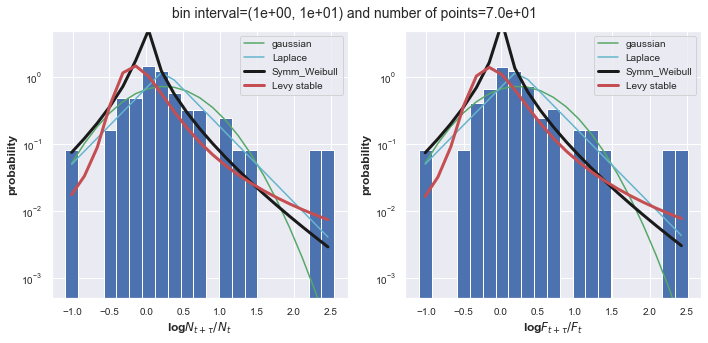

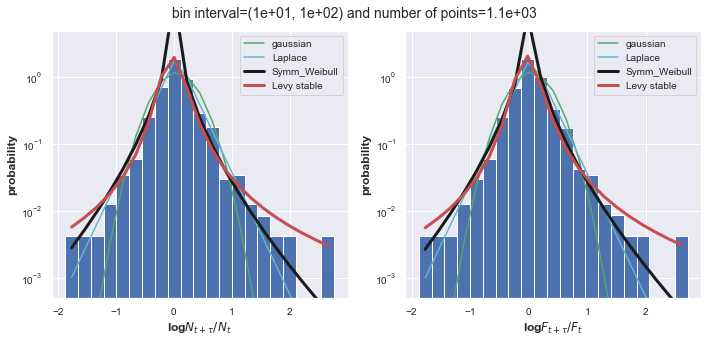

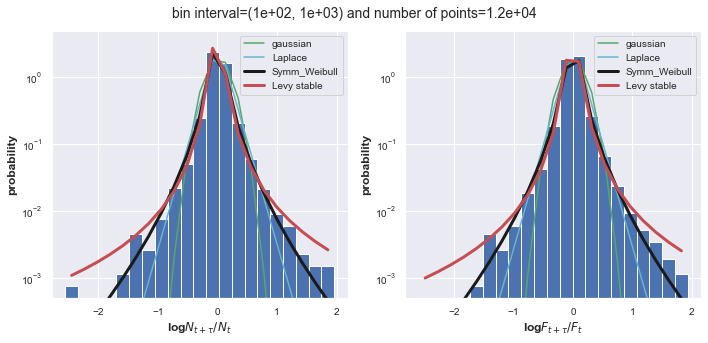

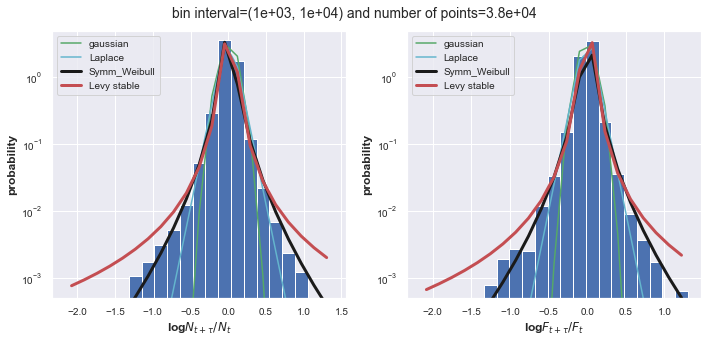

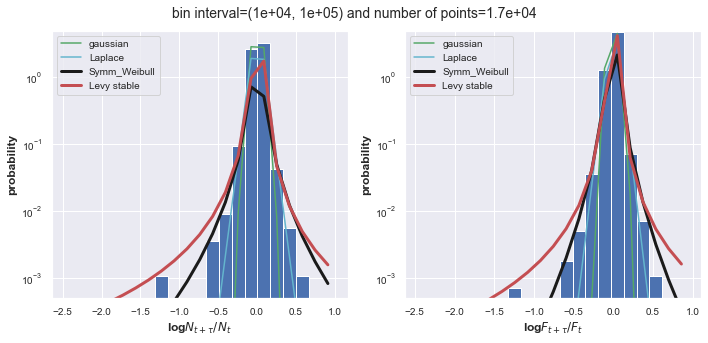

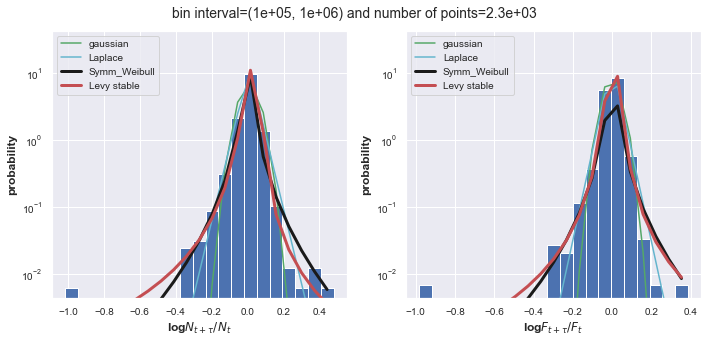

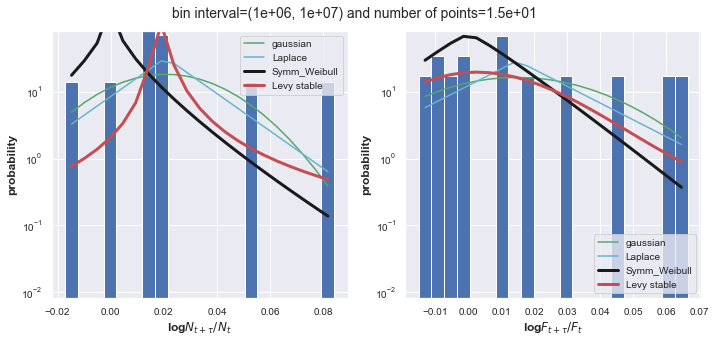

In [16]:
plot_pdf_stepsize_stratified_by_N(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years, 
                              remove_imputed_values=True)

##### variance vs time stratified by N

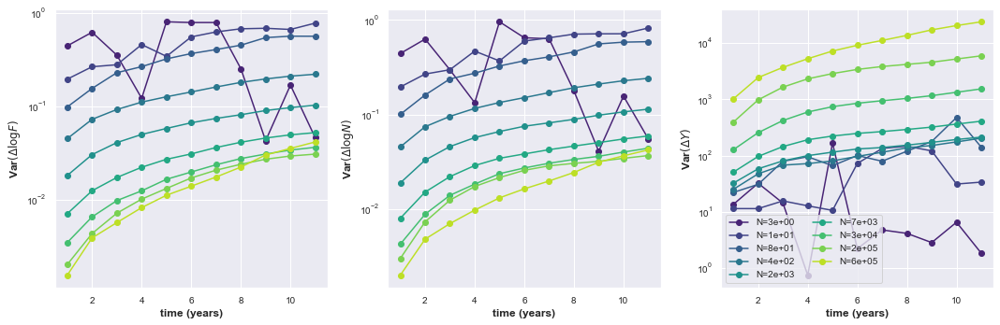

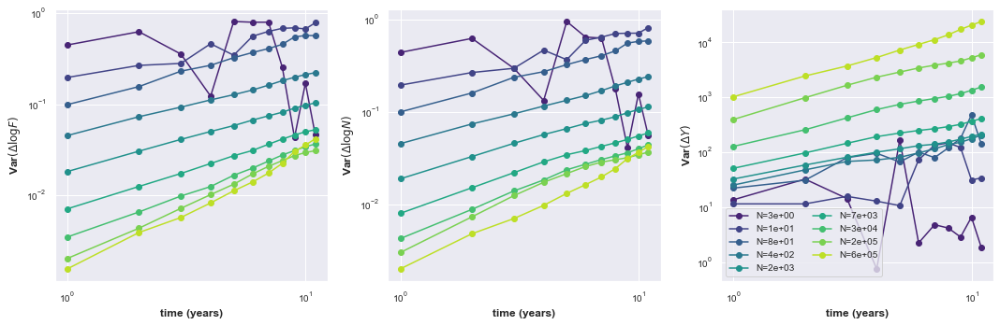

In [51]:
plot_variance_vs_time_stratified_by_N(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years, 
                              remove_imputed_values=True
                             )

/Users/ashish/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/ashish/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/ashish/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3584: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/Users/ashish/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:186: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/Users/ashish/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


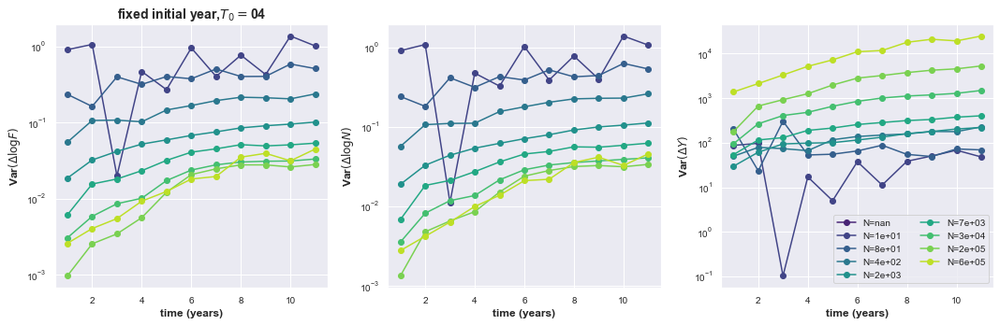

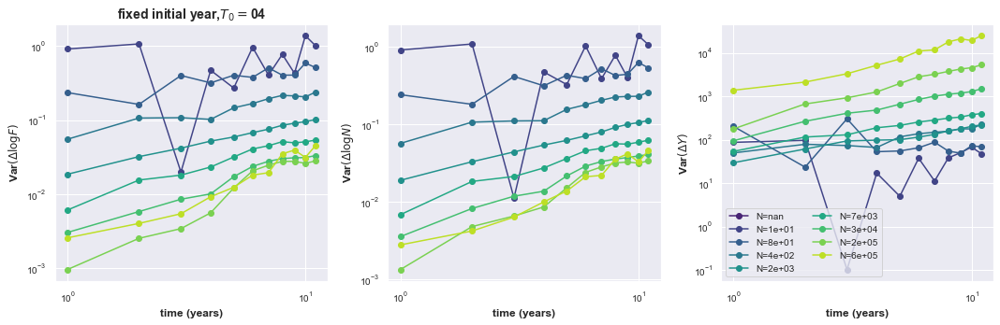

In [42]:
plot_variance_vs_time_stratified_by_N(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years, 
                              remove_imputed_values=True, T0='04'
                             )

##### variance vs popnsize for fixed tau

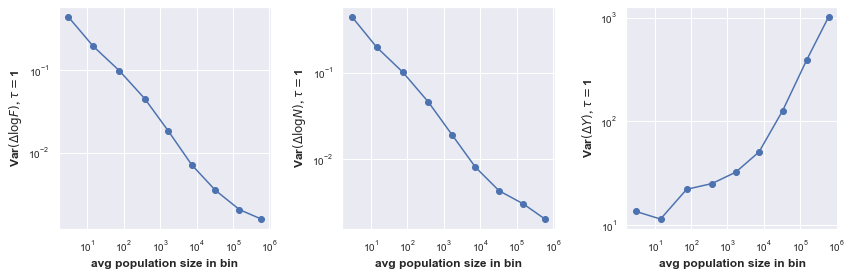

In [26]:

plot_variance_vs_popnsize(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True
                             )

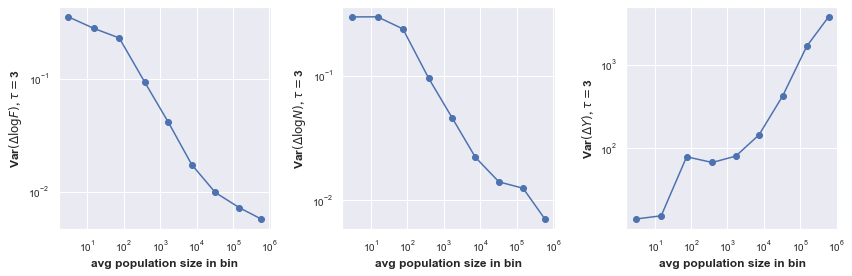

In [27]:
plot_variance_vs_popnsize(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=3, 
                              remove_imputed_values=True
                             )

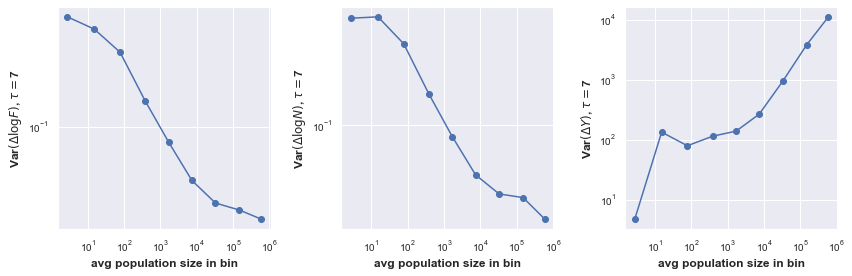

In [28]:
plot_variance_vs_popnsize(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=7, 
                              remove_imputed_values=True
                             )

## Fit MSD stratified by popnsize

In [69]:
def fit_temporalMSD_stratified_by_N(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,remove_imputed_values=True,
                              taus=np.arange(1,12), T0=None, stratify_by='N0',
                              bin_spacing=5):   

    var_dlogF_t, var_dlogN_t, var_dY_t=([] for i in range(3))
    for t,tau in enumerate(taus):
        df_deltaFY_and_N0=get_df_deltaFY_and_N0(df_metroF_time, df_metro_time,
                                  naics_keys_to_plot, years,tau=tau, 
                                  remove_imputed_values=remove_imputed_values,
                                               T0=T0)
        if t==0: ## we want to use same bins for every time point
            Narr=df_deltaFY_and_N0[stratify_by]
            base=bin_spacing
            print (Narr.max(), Narr.min(), math.log( Narr.max()*1./Narr.min(),base))
            
            n_bins=int(math.log( Narr.max()*1./Narr.min(),base))+1
            print (n_bins)
            bin_intervals=np.power(base,np.arange(n_bins+1))*Narr.min()
            print(bin_intervals)
        avgN_temp, var_dlogF, var_dlogN, var_dY=([] for i in range(4))
        for bin_i in range(n_bins):
            start=bin_intervals[bin_i]
            end=bin_intervals[bin_i+1]
            Nsub=df_deltaFY_and_N0[(df_deltaFY_and_N0[stratify_by]>=start)&
                                   (df_deltaFY_and_N0[stratify_by]<end)][stratify_by].values
    #         print (start,end, Nsub.min(), Nsub.max())
            avgN_temp.append(np.mean(Nsub))

            dlogF_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0[stratify_by]>=start)&
                                   (df_deltaFY_and_N0[stratify_by]<end)]['delta_logF'].values
            var_dlogF.append(np.var(dlogF_sub))
            dlogN_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0[stratify_by]>=start)&
                                   (df_deltaFY_and_N0[stratify_by]<end)]['delta_logN'].values
            var_dlogN.append(np.var(dlogN_sub))
            dY_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0[stratify_by]>=start)&
                                   (df_deltaFY_and_N0[stratify_by]<end)]['delta_Y'].values
            var_dY.append(np.var(dY_sub))
        
        var_dlogF_t.append(np.array(var_dlogF))
        var_dlogN_t.append(np.array(var_dlogN))
        var_dY_t.append(np.array(var_dY))        
        if t==0:
            avgN=deepcopy(avgN_temp) ## we just use the first avg bin size.

    seq_colors=sns.color_palette("viridis", n_colors=n_bins)#, as_cmap=True)

    var_dlogF_t=np.array(var_dlogF_t).T ## transpose to make N the first index
    var_dlogN_t=np.array(var_dlogN_t).T
    var_dY_t=np.array(var_dY_t).T
    
    from scipy.optimize import curve_fit
    def fit_func(t, A, B, Exp):
        return A+ B*np.power(t, Exp)
    def fit_func_0intercept(t,  B, Exp):
        return B*np.power(t, Exp)
    
    
    n_rows=int(len(avgN)/2 + 1)
    fig = plt.figure(figsize=(10, 5*n_rows))   
    for i,n in enumerate(avgN):     
        ax1 = fig.add_subplot(n_rows,2, i+1)
        ax1.plot(taus,var_dlogN_t[i],'o',label='data')
        try:
            params, param_cov = curve_fit(fit_func, taus, var_dlogN_t[i])
            ax1.plot(taus,fit_func(taus, params[0], params[1], params[2]),'-', lw=3,
                     label=r'fit= ' + '{:.2f}'.format(params[0]) + '+{:.3f}'.format(params[1])
                     +'t^ {:.2f}'.format(params[2]),
                    )
#             params, param_cov = curve_fit(fit_func2, taus, var_dlogN_t[i])
#             ax1.plot(taus,fit_func2(taus, params[0], params[1]),'-', lw=3,
#                      label=r'fit= ' +  '+{:.3f}'.format(params[0])
#                      +'t^ {:.2f}'.format(params[1]),
#                     )
            
        except:
            print ('fit unsuccessful for ',i,n)
        ax1.legend(loc='best',fontsize=BIGGER_SIZE)
        for ax in [ax1]:
            ax.set_title('bin, '+'{:.0e}'.format( bin_intervals[i])+' to '
                         +'{:.0e}'.format( bin_intervals[i+1]) )
            ax.set_xlabel(r'time interval, $\tau$')
            ax.set_ylabel(r'Mean Squared Deviation')
    fig.suptitle(r'MSD ($\Delta \log N$)')
    fig.patch.set_facecolor('white')
#     plt.tight_layout()
    fig.tight_layout(rect=[0, 0.0, 1, 0.98])
    plt.show()
    
    
    fig = plt.figure(figsize=(10, 5*n_rows))   
    for i,n in enumerate(avgN):     
        ax1 = fig.add_subplot(n_rows,2, i+1)
        ax1.plot(taus,var_dlogF_t[i],'o',label='data')
        try:
            params, param_cov = curve_fit(fit_func, taus, var_dlogF_t[i])
            ax1.plot(taus,fit_func(taus, params[0], params[1], params[2]),'-', lw=3,
                     label=r'fit= ' + '{:.2f}'.format(params[0]) + '+{:.3f}'.format(params[1])
                     +'t^ {:.2f}'.format(params[2]),
                    )
        except:
            print ('fit unsuccessful for ',i,n)
        ax1.legend(loc='best',fontsize=BIGGER_SIZE)
        for ax in [ax1]:
            ax.set_title('bin, '+'{:.0e}'.format( bin_intervals[i])+' to '
                         +'{:.0e}'.format( bin_intervals[i+1]) )
            ax.set_xlabel(r'time interval, $\tau$')
            ax.set_ylabel(r'Mean Squared Deviation')

    fig.suptitle(r'MSD ($\Delta \log F$)')
    fig.patch.set_facecolor('white')
    fig.tight_layout(rect=[0, 0.0, 1, 0.98])
    plt.show()
    
    
    fig = plt.figure(figsize=(10, 5*n_rows))   
    for i,n in enumerate(avgN):     
        ax1 = fig.add_subplot(n_rows,2, i+1)
        ax1.plot(taus,var_dY_t[i],'o',label='data')
        try:
            params, param_cov = curve_fit(fit_func, taus, var_dY_t[i])
            ax1.plot(taus,fit_func(taus, params[0], params[1], params[2]),'-', lw=3,
                     label=r'fit= ' + '{:.2f}'.format(params[0]) + '+{:.3f}'.format(params[1])
                     +'t^ {:.2f}'.format(params[2]),
                    )
        except:
            print ('fit unsuccessful for ',i,n)
        ax1.legend(loc='best',fontsize=BIGGER_SIZE)
        for ax in [ax1]:
            ax.set_title('bin, '+'{:.0e}'.format( bin_intervals[i])+' to '
                         +'{:.0e}'.format( bin_intervals[i+1]) )
            ax.set_xlabel(r'time interval, $\tau$')
            ax.set_ylabel(r'Mean Squared Deviation')

    fig.suptitle(r'MSD ($\Delta Y$)')
    fig.patch.set_facecolor('white')
    fig.tight_layout(rect=[0, 0.0, 1, 0.98])
    plt.show()
    

- can changing the population size bins make MSDs behave more consistently?
- Why is the largest bin so different? How many points are in there?
- Is the difference in the behavior of the MSDs because we do not stratify by industry (does exponent change between industries?)

1584581 1 6.199914444191459
7
[       1       10      100     1000    10000   100000  1000000 10000000]
fit unsuccessful for  6 1356442.4375


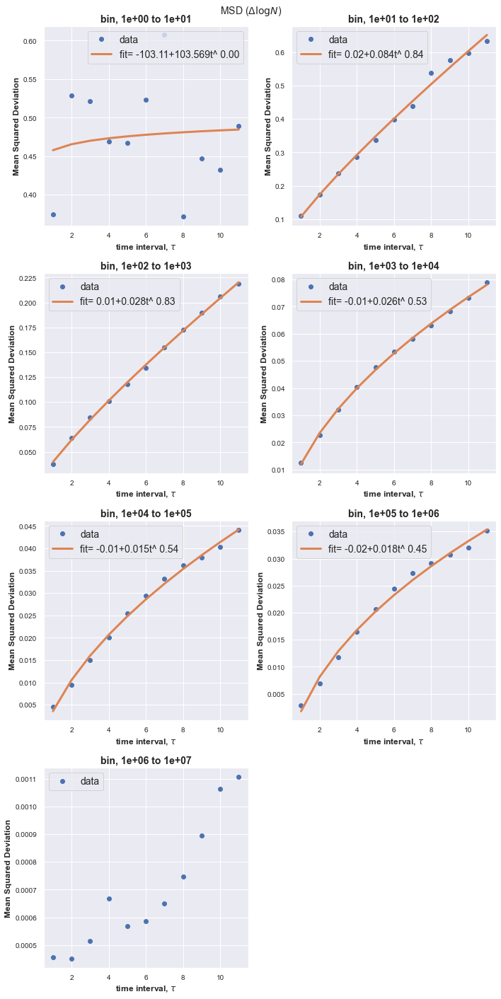

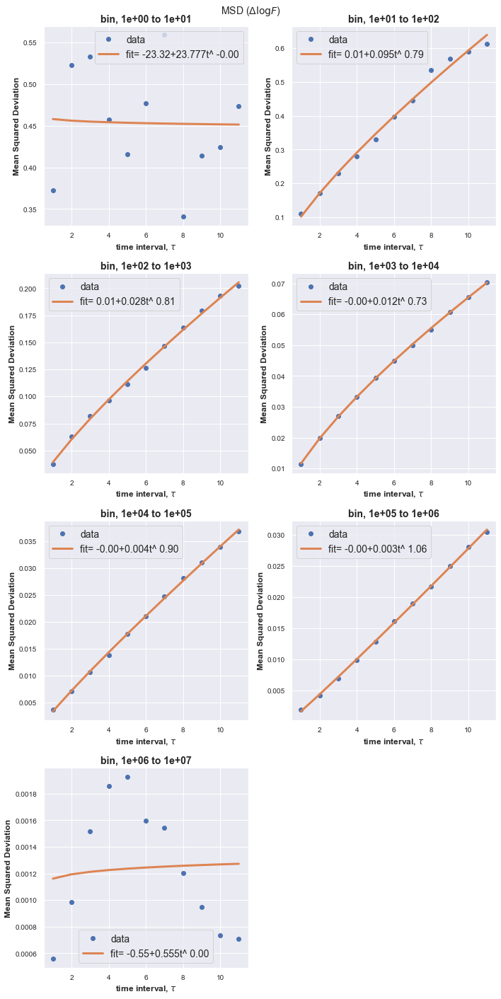

fit unsuccessful for  0 6.472527472527473


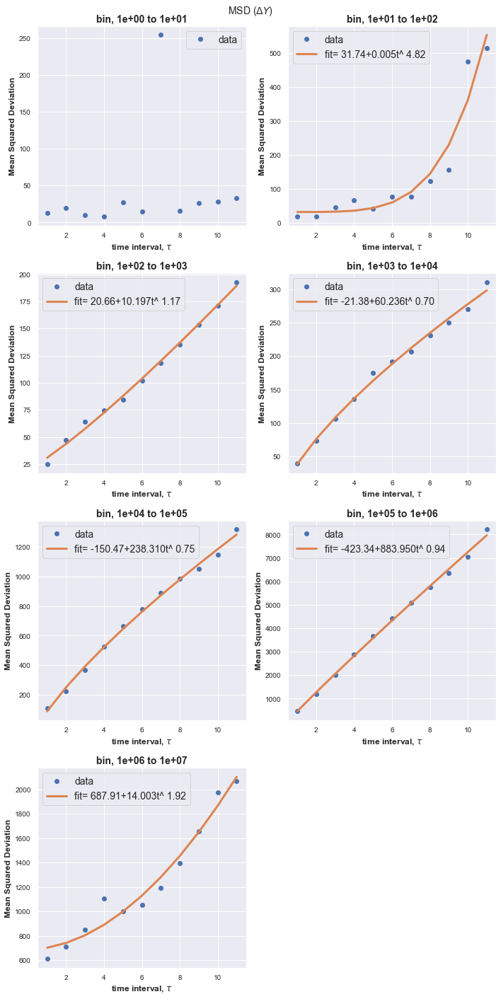

In [70]:
fit_temporalMSD_stratified_by_N(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years, 
                              remove_imputed_values=True)

8382135 8293 4.298672285135966
5
[    8293    41465   207325  1036625  5183125 25915625]


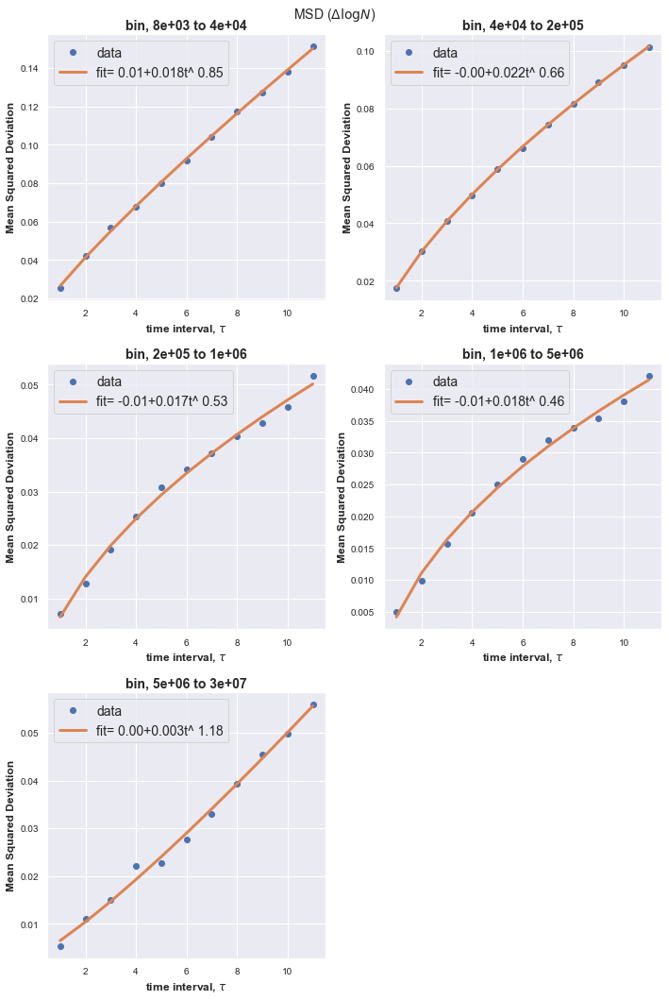

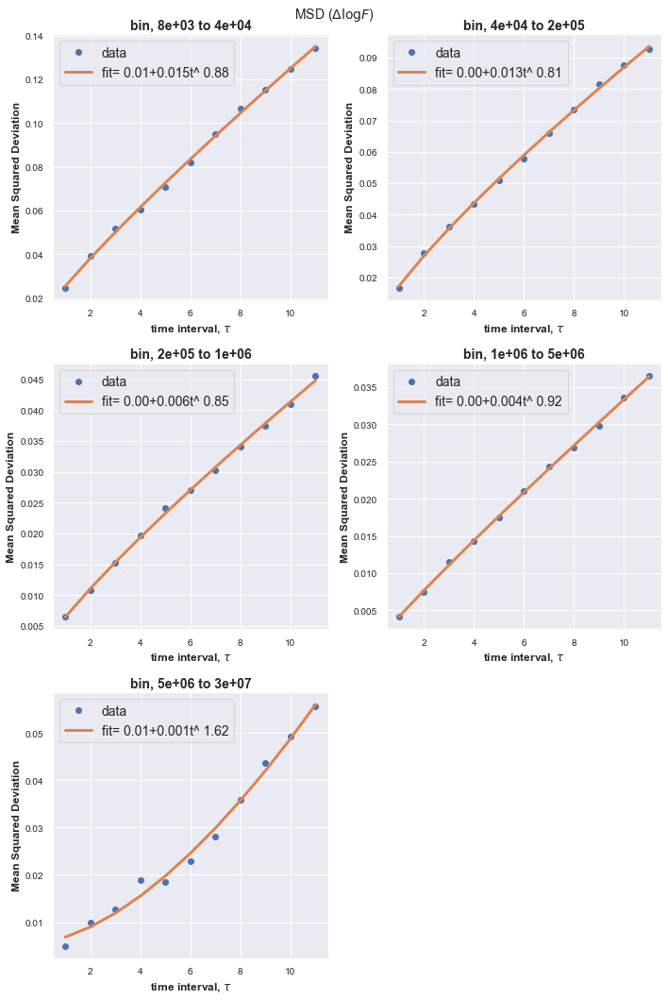

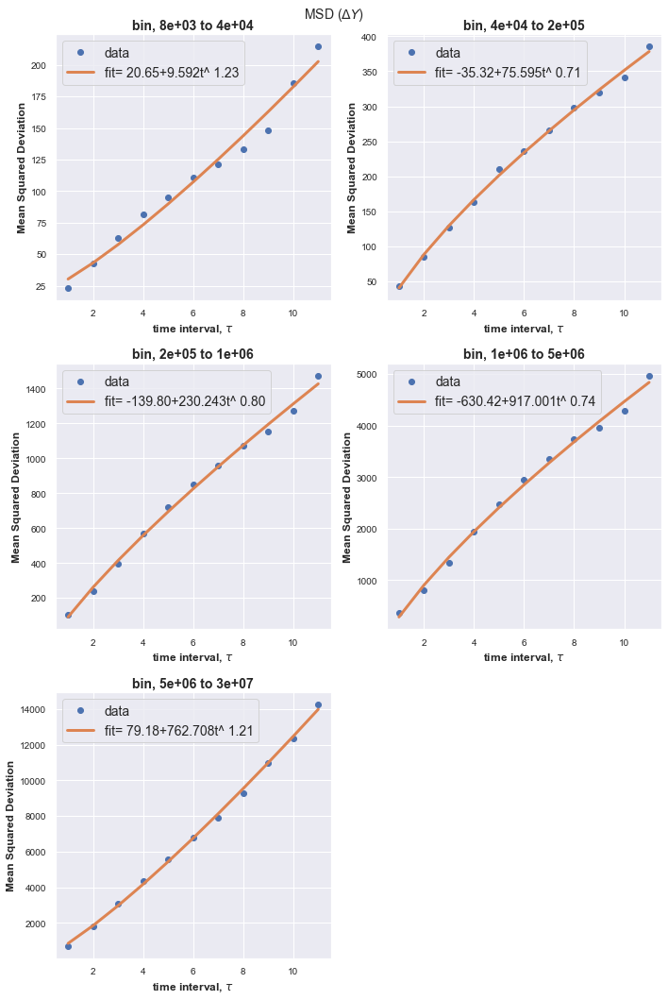

In [67]:
### stratify by Ntotal instead of N0
fit_temporalMSD_stratified_by_N(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years, stratify_by='Ntot0',
                              remove_imputed_values=True)

1606847.0 1.5 8.626812638343639
9
[1.5000000e+00 7.5000000e+00 3.7500000e+01 1.8750000e+02 9.3750000e+02
 4.6875000e+03 2.3437500e+04 1.1718750e+05 5.8593750e+05 2.9296875e+06]


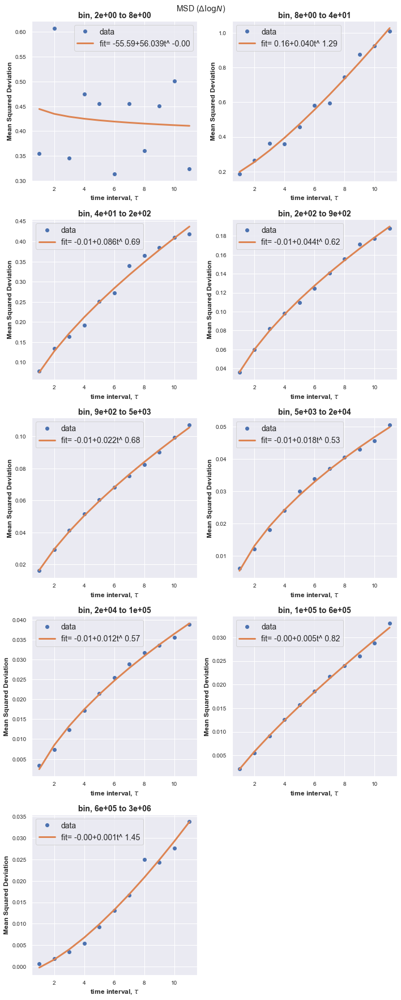

fit unsuccessful for  8 843287.1607142857


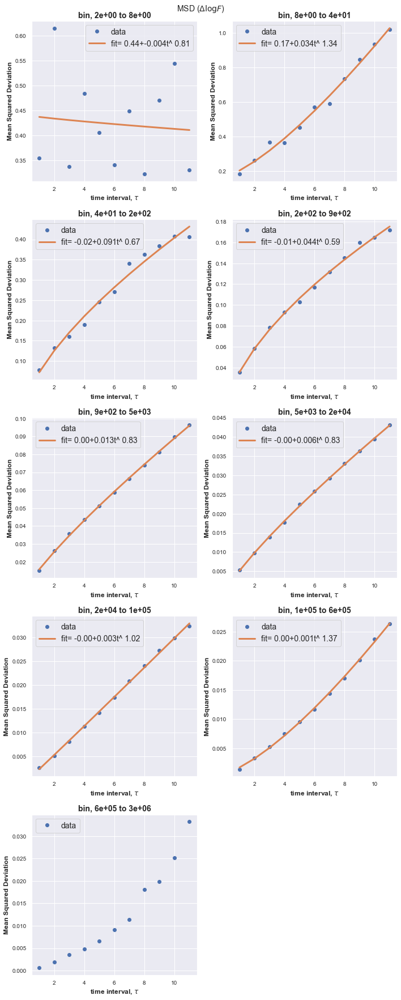

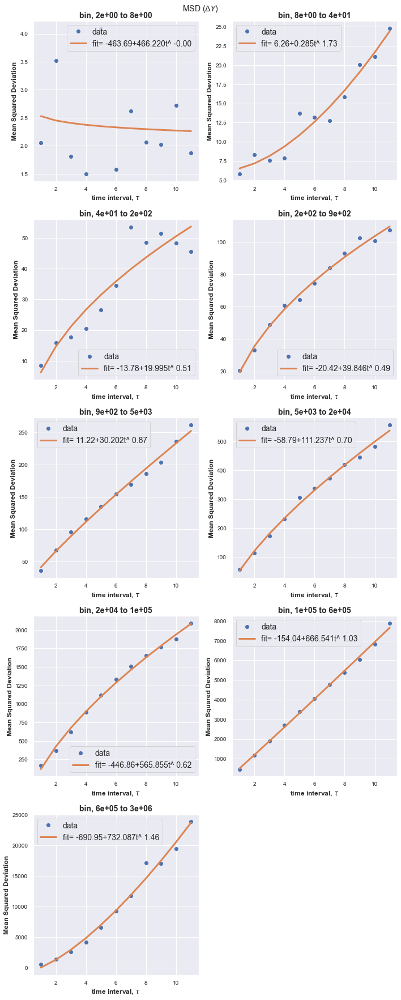

In [68]:
### stratify by Navg instead of N0
# fit_temporalMSD_stratified_by_N(df_metroF_time, df_metro_time,
#                               naics_keys_to_plot, years, stratify_by='Ntot0',
#                               remove_imputed_values=True)


In [56]:
df_deltaFY_and_N0['N0']

0         560
1         336
2         139
3          54
4          52
         ... 
77402    2528
77403    8100
77404    9452
77405    1250
77406    1571
Name: N0, Length: 77407, dtype: int64

## stratify by industry

In [40]:
def fit_temporalMSD_stratified_by_naics(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,remove_imputed_values=True,
                              taus=np.arange(1,12), T0=None, stratify_by='naics_list'):   

    var_dlogF_t, var_dlogN_t, var_dY_t=([] for i in range(3))
    for t,tau in enumerate(taus):
        df_deltaFY_and_N0=get_df_deltaFY_and_N0(df_metroF_time, df_metro_time,
                                  naics_keys_to_plot, years,tau=tau, 
                                  remove_imputed_values=remove_imputed_values,
                                               T0=T0)

        avgN_temp, var_dlogF, var_dlogN, var_dY=([] for i in range(4))
        for bin_i,naics in enumerate(naics_keys_to_plot):

            Nsub=df_deltaFY_and_N0[df_deltaFY_and_N0[stratify_by]==naics]['N0'].values
    #         print (start,end, Nsub.min(), Nsub.max())
            avgN_temp.append(np.mean(Nsub))

            dlogF_sub=df_deltaFY_and_N0[df_deltaFY_and_N0[stratify_by]==naics]['delta_logF'].values
            var_dlogF.append(np.var(dlogF_sub))
            dlogN_sub=df_deltaFY_and_N0[df_deltaFY_and_N0[stratify_by]==naics]['delta_logN'].values
            var_dlogN.append(np.var(dlogN_sub))
            dY_sub=df_deltaFY_and_N0[df_deltaFY_and_N0[stratify_by]==naics]['delta_Y'].values
            var_dY.append(np.var(dY_sub))
        
        var_dlogF_t.append(np.array(var_dlogF))
        var_dlogN_t.append(np.array(var_dlogN))
        var_dY_t.append(np.array(var_dY))        
        if t==0:
            avgN=deepcopy(avgN_temp) ## we just use the first avg bin size.
    n_bins=len(naics_keys_to_plot)
    seq_colors=sns.color_palette("viridis", n_colors=n_bins)#, as_cmap=True)

    var_dlogF_t=np.array(var_dlogF_t).T ## transpose to make N the first index
    var_dlogN_t=np.array(var_dlogN_t).T
    var_dY_t=np.array(var_dY_t).T
    
    from scipy.optimize import curve_fit
    def fit_func(t, A, B, Exp):
        return A+ B*np.power(t, Exp)
    def fit_func_0intercept(t,  B, Exp):
        return B*np.power(t, Exp)
    
    
    n_rows=int(len(avgN)/3 + 1)
    fig = plt.figure(figsize=(15, 5*n_rows))   
    for i,naics in enumerate(naics_keys_to_plot):     
        ax1 = fig.add_subplot(n_rows,3, i+1)
        ax1.plot(taus,var_dlogN_t[i],'o',label='data')
        try:
            params, param_cov = curve_fit(fit_func, taus, var_dlogN_t[i])
            ax1.plot(taus,fit_func(taus, params[0], params[1], params[2]),'-', lw=3,
                     label=r'fit= ' + '{:.2f}'.format(params[0]) + '+{:.3f}'.format(params[1])
                     +'t^ {:.2f}'.format(params[2]),
                    )
#             params, param_cov = curve_fit(fit_func2, taus, var_dlogN_t[i])
#             ax1.plot(taus,fit_func2(taus, params[0], params[1]),'-', lw=3,
#                      label=r'fit= ' +  '+{:.3f}'.format(params[0])
#                      +'t^ {:.2f}'.format(params[1]),
#                     )
            
        except:
            print ('fit unsuccessful for ',i,naics)
        ax1.legend(loc='best',fontsize=BIGGER_SIZE)
        for ax in [ax1]:
            naics_name=sector_from_naics(df_naics_ref, naics, shorten=True)
            ax.set_title(naics_name +' ('+naics+')' )
            ax.set_xlabel(r'time interval, $\tau$')
            ax.set_ylabel(r'Mean Squared Deviation')
    fig.suptitle(r'MSD ($\Delta \log N$)')
    fig.patch.set_facecolor('white')
#     plt.tight_layout()
    fig.tight_layout(rect=[0, 0.0, 1, 0.98])
    plt.show()
    
    
    fig = plt.figure(figsize=(15, 5*n_rows))   
    for i,n in enumerate(avgN):     
        ax1 = fig.add_subplot(n_rows,3, i+1)
        ax1.plot(taus,var_dlogF_t[i],'o',label='data')
        try:
            params, param_cov = curve_fit(fit_func, taus, var_dlogF_t[i])
            ax1.plot(taus,fit_func(taus, params[0], params[1], params[2]),'-', lw=3,
                     label=r'fit= ' + '{:.2f}'.format(params[0]) + '+{:.3f}'.format(params[1])
                     +'t^ {:.2f}'.format(params[2]),
                    )
        except:
            print ('fit unsuccessful for ',i,n)
        ax1.legend(loc='best',fontsize=BIGGER_SIZE)
        for ax in [ax1]:
            naics_name=sector_from_naics(df_naics_ref, naics, shorten=True)
            ax.set_title(naics_name +' ('+naics+')' )
            ax.set_xlabel(r'time interval, $\tau$')
            ax.set_ylabel(r'Mean Squared Deviation')

    fig.suptitle(r'MSD ($\Delta \log F$)')
    fig.patch.set_facecolor('white')
    fig.tight_layout(rect=[0, 0.0, 1, 0.98])
    plt.show()
    
    
    fig = plt.figure(figsize=(15, 5*n_rows))   
    for i,n in enumerate(avgN):     
        ax1 = fig.add_subplot(n_rows,3, i+1)
        ax1.plot(taus,var_dY_t[i],'o',label='data')
        try:
            params, param_cov = curve_fit(fit_func, taus, var_dY_t[i])
            ax1.plot(taus,fit_func(taus, params[0], params[1], params[2]),'-', lw=3,
                     label=r'fit= ' + '{:.2f}'.format(params[0]) + '+{:.3f}'.format(params[1])
                     +'t^ {:.2f}'.format(params[2]),
                    )
        except:
            print ('fit unsuccessful for ',i,n)
        ax1.legend(loc='best',fontsize=BIGGER_SIZE)
        for ax in [ax1]:
            naics_name=sector_from_naics(df_naics_ref, naics, shorten=True)
            ax.set_title(naics_name +' ('+naics+')' )
            ax.set_xlabel(r'time interval, $\tau$')
            ax.set_ylabel(r'Mean Squared Deviation')

    fig.suptitle(r'MSD ($\Delta Y$)')
    fig.patch.set_facecolor('white')
    fig.tight_layout(rect=[0, 0.0, 1, 0.98])
    plt.show()

fit unsuccessful for  3 naics_23
fit unsuccessful for  4 naics_31


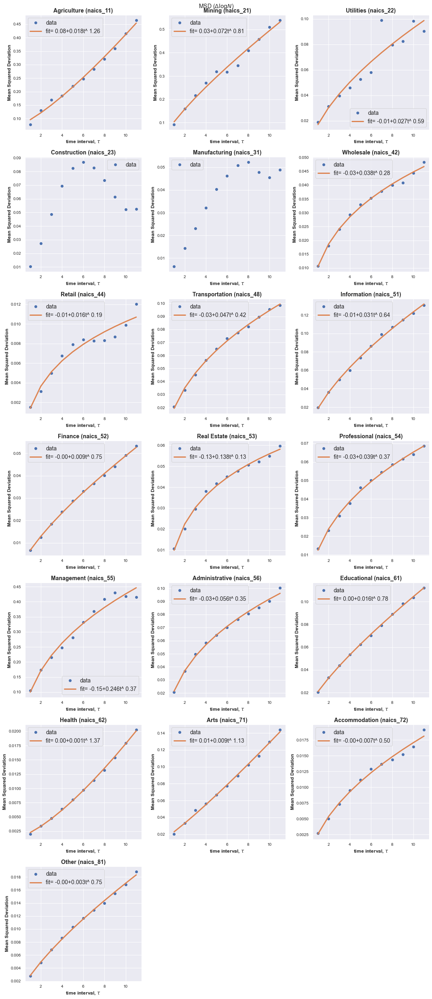

fit unsuccessful for  3 13960.04012632361


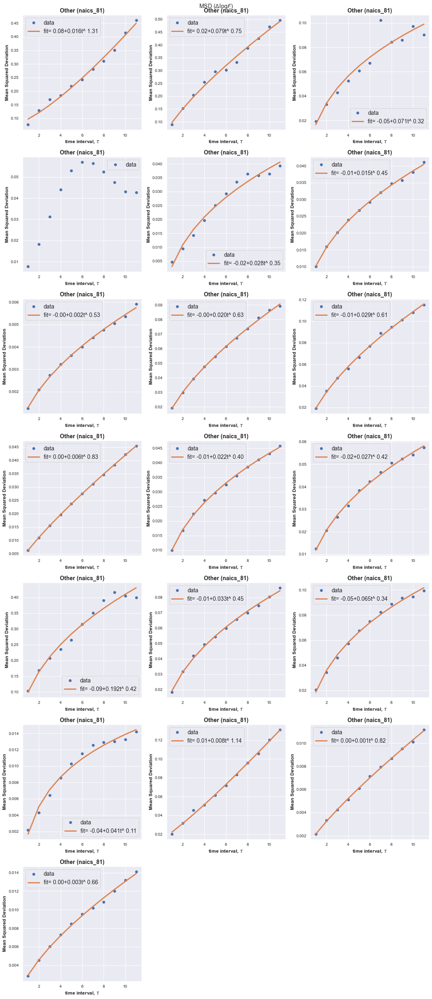

/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/scipy/optimize/minpack.py:829: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


fit unsuccessful for  4 24675.348195329087
fit unsuccessful for  7 9007.623755806237
fit unsuccessful for  9 13596.196988196989
fit unsuccessful for  12 5041.719266055046


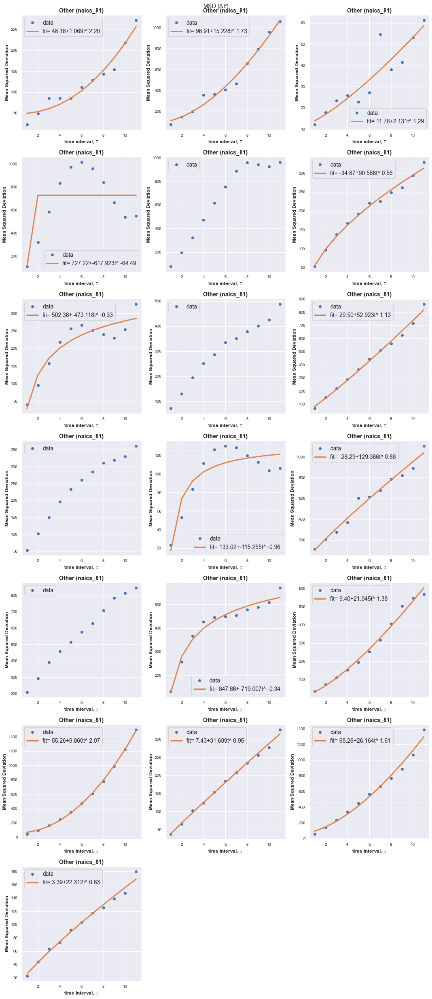

In [41]:
fit_temporalMSD_stratified_by_naics(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,
                              remove_imputed_values=True)

In [ ]:
df_metro_time['total-Y'+'03']

In [53]:
df_metro_time.keys()

Index(['msa', 'msa_name', 'Metro', 'FIPS', 'msa-Y02', 'total-Y02',
       'total_NF-Y02', 'total_empflag-Y02', 'naics_11-Y02', 'naics_11_NF-Y02',
       ...
       'naics_53_imputed-Y18', 'naics_54_imputed-Y18', 'naics_55_imputed-Y18',
       'naics_56_imputed-Y18', 'naics_61_imputed-Y18', 'naics_62_imputed-Y18',
       'naics_71_imputed-Y18', 'naics_72_imputed-Y18', 'naics_81_imputed-Y18',
       'naics_99_imputed-Y18'],
      dtype='object', length=1449)

## Fit MSD and MedSD


Mean squared deviation is sub-diffusive. Median squared deviation is linear.

In [25]:
def plot_MeanMedianSD_time(df_metroF_time, taus, naics_keys_to_plot,
                           remove_imputed_values=False,title_suffix=''):
    delta_sqd_tau=[]
    delta_var_tau=[]
    median_sqd_deviation_from_median_tau=[]
    for tau in taus:   
        delta_list=[]
        delta_sqd_list=[]

        sqd_deviation_from_median_list=[]

        for i in range(len(years)-1):
            if i+tau< len(years):j=i+tau
            else: break  

            year1=years[i]
            year2=years[j]
            naics_yr1 = [naics+'-Y'+year1 for naics in naics_keys_to_plot]
            naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
            
            if remove_imputed_values:           
                emp1, non_imputed_idx1=get_nonimputed_data(df_metroF_time,naics_keys_to_plot,year1)
                emp2, non_imputed_idx2=get_nonimputed_data(df_metroF_time,naics_keys_to_plot,year2)
                non_imputed_idx=np.intersect1d(non_imputed_idx1,non_imputed_idx2,assume_unique=True)
                empF_naics1=emp1[non_imputed_idx]
                empF_naics2=emp2[non_imputed_idx]
            else:
                empF_naics1 = df_metroF_time[naics_yr1].values
                empF_naics2 = df_metroF_time[naics_yr2].values

            ratio_change_naics_yr=np.ravel(empF_naics2[empF_naics1>0]*1./empF_naics1[empF_naics1>0])
            logratio_change_naics=np.log(ratio_change_naics_yr[ratio_change_naics_yr>0.])      
            delta_list.append(np.mean(logratio_change_naics))
            delta_sqd_list.append(np.mean(logratio_change_naics*logratio_change_naics))

            sqd_deviation_from_median_list.extend( 
                (logratio_change_naics-np.median(logratio_change_naics))**2  )


        median_sqd_deviation_from_median_tau.append(np.median(sqd_deviation_from_median_list) )    
        delta_sqd_tau.append(np.mean(delta_sqd_list))
        delta_var_tau.append(np.mean(delta_sqd_list)-np.mean(delta_list)**2)

    delta_MSD_tau=delta_var_tau
    
    from scipy.optimize import curve_fit
    def fit_func(t, A, B, Exp):
        return A+ B*np.power(t, Exp)
    
    fig = plt.figure(figsize=(10, 10))
    ax1 = fig.add_subplot(2,2,1)
    ax1.plot(taus,delta_var_tau,'-o',label='data')
    
#     params, param_cov = curve_fit(fit_func, taus, delta_var_tau, bounds=([0,0], [np.inf, np.inf]))
    params, param_cov = curve_fit(fit_func, taus[1:], delta_var_tau[1:])
    ax1.plot(taus[1:],fit_func(taus[1:], params[0], params[1], params[2]),'-', lw=3,
             label=r'fit= ' + '{:.2f}'.format(params[0]) + '+{:.2f}'.format(params[1])
             +'t^ {:.2f}'.format(params[2]),
            )
    ax1.legend(loc='best',fontsize=BIGGER_SIZE)
    ax2 = fig.add_subplot(2,2,2)
    # ax2.plot(taus,delta_sqd_tau,'-o',label='data')
    ax2.plot(taus,delta_MSD_tau,'-o',label='data')
    slope,intercept=np.polyfit(np.log(taus[1:]), np.log(delta_var_tau[1:]),1)
    # ax2.plot(taus,np.power(taus,1)/30,'--',label='diffusion')
    ax2.plot(taus,np.exp(intercept)*np.power(taus,slope),'-',
             label='fit, exponent '+str(round(slope,2)))
    ax2.legend(loc='best',fontsize=BIGGER_SIZE)
    ax2.set_xscale('log')
    ax2.set_yscale('log')

    # ax2.hist(logratio_change_naics,bins=20,density=True)
    for ax in [ax1,ax2]:
        ax.set_xlabel(r'time interval, $\tau$')
        ax.set_ylabel(r'Mean Squared Deviation')
    ax1.set_title('Mean Sq. Dev'+ title_suffix)
#     fig.patch.set_facecolor('white')
#     plt.tight_layout()

#     fig2 = plt.figure(figsize=(10, 5))
    ax1_2 = fig.add_subplot(2,2,3)
    ax1_2.plot(taus,median_sqd_deviation_from_median_tau,'-o',label='data')

    ax2_2 = fig.add_subplot(2,2,4)
    ax2_2.plot(taus,median_sqd_deviation_from_median_tau,'-o',label='data')
    slope,intercept=np.polyfit(np.log(taus[1:]), np.log(median_sqd_deviation_from_median_tau[1:]),1)
    # ax2.plot(taus,np.power(taus,1)/30,'--',label='diffusion')
    ax2_2.plot(taus,np.exp(intercept)*np.power(taus,slope),'-',
             label='fit, exponent '+str(round(slope,2)))
    ax2_2.legend(loc='best',fontsize=BIGGER_SIZE)
    ax2_2.set_xscale('log')
    ax2_2.set_yscale('log')
    ax1_2.set_title('Median Sq. Dev'+title_suffix)
    for ax in [ax1_2,ax2_2]:
        ax.set_xlabel(r'time interval, $\tau$')
        ax.set_ylabel(r'Median Squared Deviation')
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()


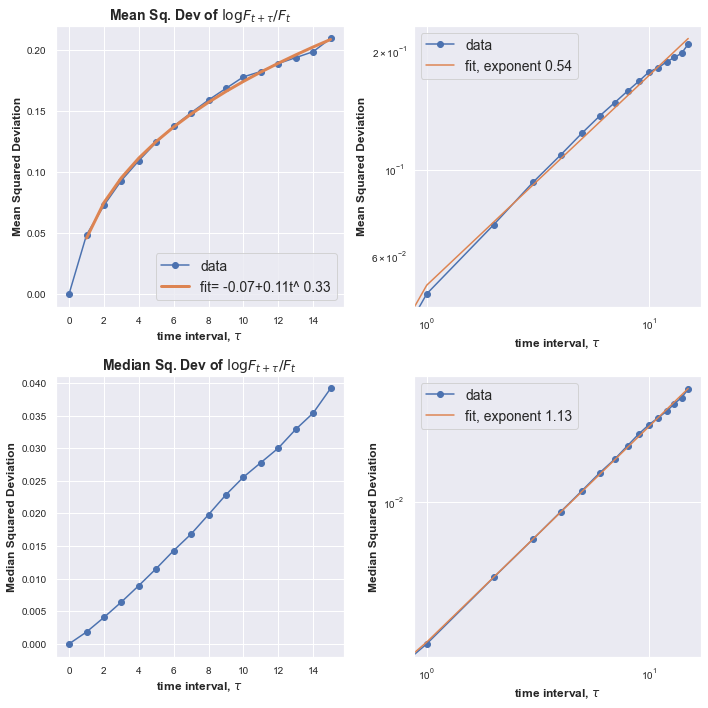

In [26]:
# msas = df_metro_time['msa'].values
# n_msas = len(msas)
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
taus=np.arange(16).astype(int)
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_MeanMedianSD_time(df_metroF_time, taus, naics_keys_to_plot, title_suffix=r' of $\log F_{t+\tau}/F_{t}$')

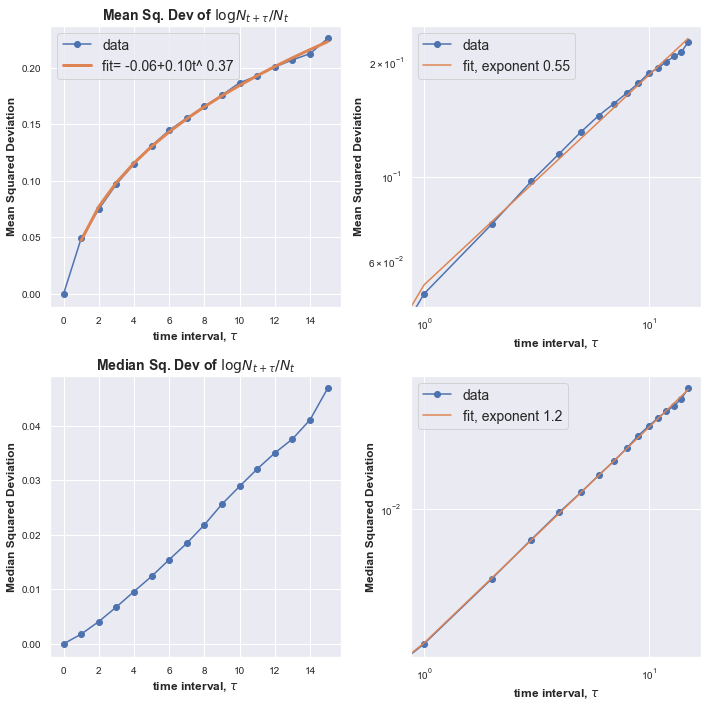

In [27]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
taus=np.arange(16).astype(int)
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_MeanMedianSD_time(df_metro_time, taus, naics_keys_to_plot, title_suffix=r' of $\log N_{t+\tau}/N_{t}$')

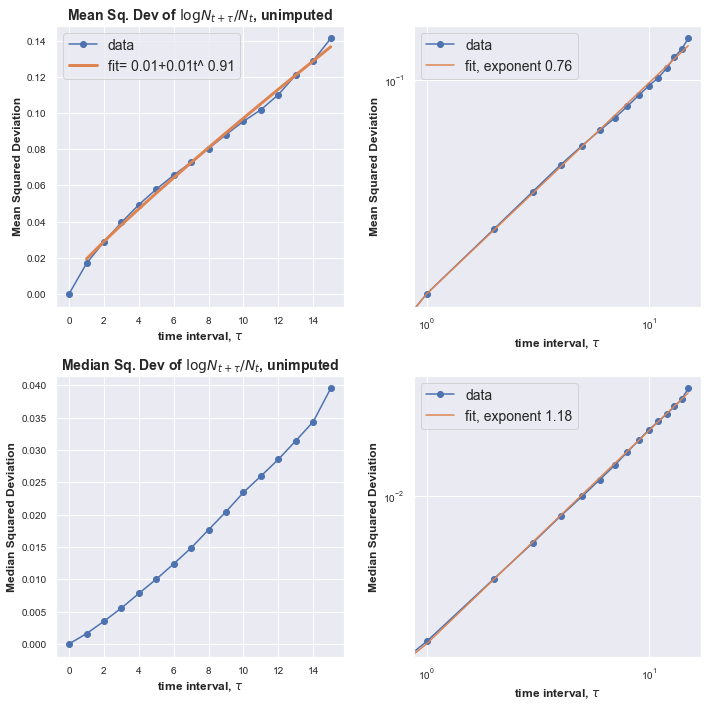

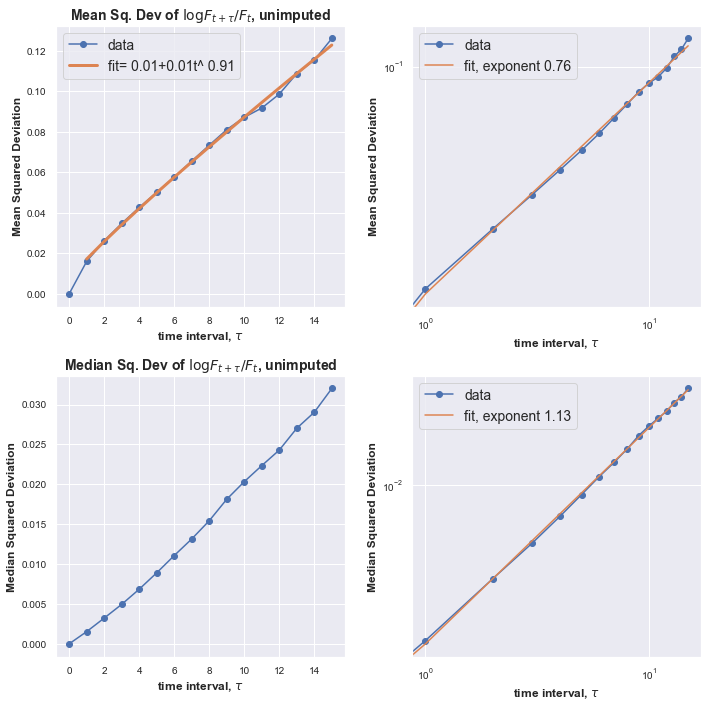

In [28]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
taus=np.arange(16).astype(int)
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])

plot_MeanMedianSD_time(df_metro_time, taus, naics_keys_to_plot, 
                       remove_imputed_values=True, title_suffix=r' of $\log N_{t+\tau}/N_{t}$, unimputed')
plot_MeanMedianSD_time(df_metroF_time, taus, naics_keys_to_plot, 
                       remove_imputed_values=True, title_suffix=r' of $\log F_{t+\tau}/F_{t}$, unimputed')


## MSD ensemble avg, temporal avg.

strictest logratio function only returned values with a single base year. but we need logratio for different combinations of base years. SO, we need to just get the indices of the cities+naics where strictest logration can be performed and then get logratio of all t,tau combinations in the following function..

In [24]:
def plot_MSD_time_temporalAvg(df_metro_time, taus, naics_keys_to_plot, years,
                           remove_imputed_values=False,title_suffix=''):
    '''
    this function only returns \rho (\tau |0). i.e. year 1 is fixed. we need all the years!
    ''' 
    _,strict_data= get_strictest_non_imputed_data(df_metro_time, naics_keys_to_plot, years)
    log_data=np.log(strict_data)

    temporal_MSD=np.zeros((len(strict_data),len(taus)))
    for tau in taus:   
        rho_sqd=np.zeros((len(strict_data)))
        rho_bar=np.zeros((len(strict_data)))
        ctr=0
        for i in range(len(years)-1):
            assert tau>=1,'there is no rho for tau =0'
            if i+tau< len(years):j=i+tau ## tau =1 is rho pf 
            else: break             
            ## rho  = $\rho (\tau|t)$= $\log N_{t+\tau}/ N_t$
            rho=log_data[:,j]-log_data[:,i]
            rho_sqd=rho_sqd+np.square(rho)
            rho_bar=rho_bar+rho    
            ctr+=1    

        temporal_MSD[:,tau-1]=rho_sqd/ctr - np.square(rho_bar/ctr)   
            
    
    fig = plt.figure(figsize=(10, 10))
    ax1 = fig.add_subplot(2,2,1)
    for traj in temporal_MSD:
        ax1.plot(taus,traj,'-o')

    ax2 = fig.add_subplot(2,2,2)
    slopes=[]
    Rsq=[]
    Rsq_linspace=[]


    start = time.time()  
    for k in range(0,len(temporal_MSD)):
        traj=temporal_MSD[k]
        ax2.plot(taus,traj,'-o')
        slope, intercept, r_val, p_val, std_err = scipy.stats.linregress(
                                                    np.log(taus), np.log(traj))
        slopes.append(slope)
        Rsq.append(r_val**2)
        Rsq_linspace.append(r2_score(traj, np.exp(intercept)*np.power(taus,slope)))
#         slope,intercept=np.polyfit(np.log(taus), np.log(traj),1)      
#         Rsq.append(r2_score(traj, np.exp(intercept)*np.power(taus,slope)))
#         slopes.append(slope)
        

    
    end = time.time()
    print('time in secs for fits=', end-start)
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    
    ax3 = fig.add_subplot(2,2,3)
    ax3.hist(slopes)
    ax3.set_xlabel(r'exponents from regression')
    ax3.set_ylabel(r'count')
    
    ax4 = fig.add_subplot(2,2,4)
    ax4.hist(Rsq,label=r'loglog $R^2$', alpha=0.75)
    ax4.hist(Rsq_linspace, label=r'linear $R^2$', alpha=0.5)
    ax4.legend(loc='best')
    ax4.set_xlabel(r'$R^2$ of regression')
    ax4.set_ylabel(r'count')
    
    
    for ax in [ax1,ax2]:
        ax.set_xlabel(r'time interval, $\tau$')
        ax.set_ylabel(r'Temporal_MSD $\overline{\rho^2(\tau)} -\overline{\rho(\tau)}\,^2 $')
    ax1.set_title('Mean Sq. Dev'+ title_suffix)
    

    fig.patch.set_facecolor('white')
    plt.tight_layout()
    
    
    ensembleAvg_temporalAvg_MSD=np.mean(temporal_MSD,axis=0)    
    fig2 = plt.figure(figsize=(10, 5))
    ax1 = fig2.add_subplot(1,2,1)
    ax1.plot(taus,ensembleAvg_temporalAvg_MSD,'-o',label='data')
    ax2 = fig2.add_subplot(1,2,2)
    ax2.plot(taus,ensembleAvg_temporalAvg_MSD,'-o',label='data')
    slope,intercept=np.polyfit(np.log(taus), np.log(ensembleAvg_temporalAvg_MSD),1)
    ax2.plot(taus,np.exp(intercept)*np.power(taus,slope),'-',
             label='fit, exponent '+str(round(slope,2)))
    ax2.legend(loc='best',fontsize=BIGGER_SIZE)
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    for ax in [ax1,ax2]:
        ax.set_xlabel(r'time interval, $\tau$')
        ax.set_ylabel(r'Ens_temp_MSD $\langle \overline{\rho^2(\tau)} -\overline{\rho(\tau)}\,^2 \rangle$')
    ax1.set_title('Mean Sq. Dev'+ title_suffix)
    fig2.patch.set_facecolor('white')
    plt.tight_layout()




time in secs for fits= 3.6904678344726562


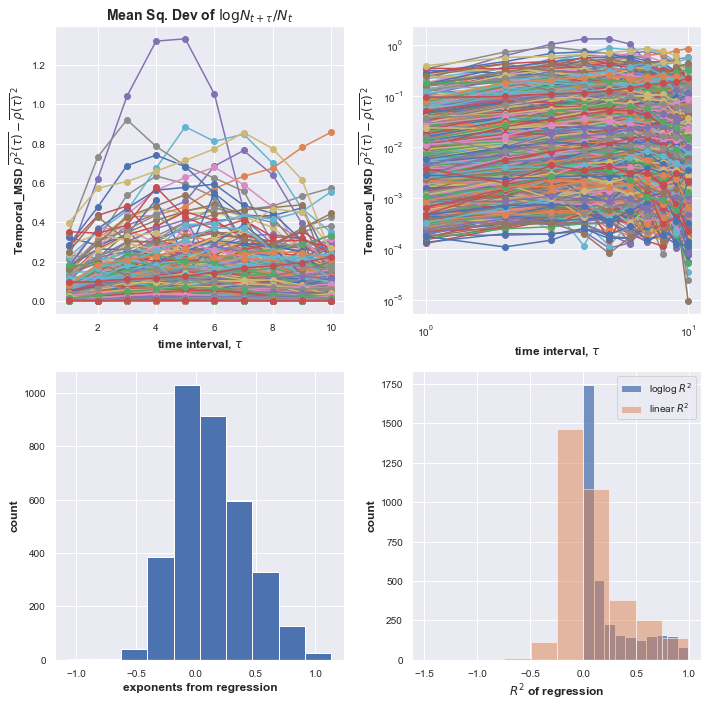

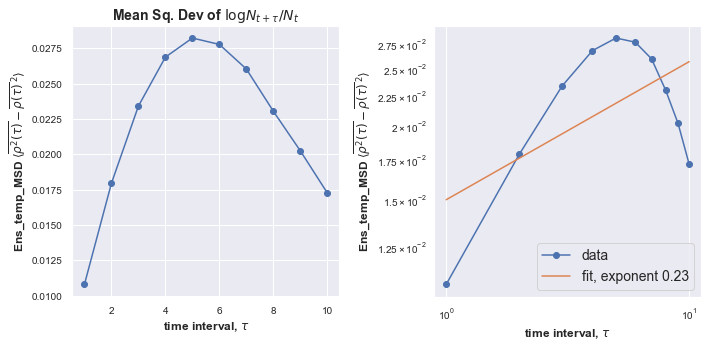

In [25]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
taus=np.arange(10).astype(int)+1 ##starts from1 !
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
plot_MSD_time_temporalAvg(df_metro_time, taus, naics_keys_to_plot,years,
                           remove_imputed_values=False,
                          title_suffix=r' of $\log N_{t+\tau}/N_{t}$')

##  no frequency or size dependent selection 
no systematic trends in the growth rate was observed when plotted against size of the city intially or frequency of that industry initially.

##### size dependent growth rate of each industry

In [68]:

def get_df_deltaFY_and_N0(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True
                             ):    
#     print('removing all zeros because we cannot divide by zero.')
    logratio_change_naics=[]
    msas = df_metroF_time['msa'].values
#     df_deltaFY_popn_size={'N0':[],'Navg':[], 'Ntot0':[],'Ntotavg':[],'delta_logF':[],'deltaY':[]}
    n_msas = len(msas)
    N0, Navg, Ntot0, Ntotavg, delta_logF, delta_Y = ([] for i in range(6))
    for i in range(len(years)-tau):
        year1=years[i]
        year2=years[i+tau]
#         naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
#         naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
        total_yr1 = ['total-Y'+year1]
        total_yr2 = ['total-Y'+year2]
        
        for naics in naics_keys_to_plot:
            naics_y1 = naics+'-Y'+year1 
            naics_y2 = naics+'-Y'+year2         
            if remove_imputed_values: 
                imp_y1=naics+'_imputed-Y'+year1
                imp_y2=naics+'_imputed-Y'+year2
#                 print (np.where(df_metroF_time[imp_y1].values==False)[0] )
                
                nonimputed_idx1=np.where(df_metroF_time[imp_y1].values==False)[0]    
                nonimputed_idx2=np.where(df_metroF_time[imp_y2].values==False)[0]    
                nonimputed_idx=np.intersect1d(nonimputed_idx1,nonimputed_idx2,assume_unique=True)
                nonzero_idx1=np.where(df_metro_time[naics_y1].values>0)[0]
                nonzero_idx2=np.where(df_metro_time[naics_y2].values>0)[0]
                nonzero_idx=np.intersect1d(nonzero_idx1,nonzero_idx2,assume_unique=True)
#                 print (nonzero_idx )
                idx_used=np.intersect1d(nonimputed_idx,nonzero_idx,assume_unique=True)
#                 print (idx_used)
#                 sys.exit(1)
            else:
                nonzero_idx1=np.where(df_metro_time[naics_y1].values>0)[0]
                nonzero_idx2=np.where(df_metro_time[naics_y2].values>0)[0]
                idx_used=np.intersect1d(nonzero_idx1,nonzero_idx2,assume_unique=True)

            
            N0.extend(df_metro_time[naics_y1].values[idx_used])
            Ntot0.extend(df_metro_time[total_yr1].values[idx_used])
            Navg.extend(
                (df_metro_time[naics_y1].values[idx_used]+
                       df_metro_time[naics_y2].values[idx_used])/2.)                            
            delta_logF.extend(
               np.log (df_metroF_time[naics_y2].values[idx_used]/
                       df_metroF_time[naics_y1].values[idx_used]))
            delta_Y.extend(
                (df_metro_time[naics_y2].values[idx_used]-
                       df_metro_time[naics_y1].values[idx_used])/np.sqrt(
                df_metro_time[naics_y1].values[idx_used]))
              
    df_deltaFY_and_N0=pd.DataFrame.from_dict(
        {'N0':np.ravel(N0),'Navg':np.ravel(Navg),'Ntot0':np.ravel(Ntot0),
         'delta_logF':np.ravel(delta_logF),'delta_Y':np.ravel(delta_Y)})
    return df_deltaFY_and_N0

def plot_growth_vs_popnsize(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True
                             ):    
    df_deltaFY_and_N0=get_df_deltaFY_and_N0(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=tau, 
                              remove_imputed_values=remove_imputed_values)
                            
    Narr=df_deltaFY_and_N0['N0']
    base=5
    n_bins=int(math.log(Narr.max(),base))+1
    bin_intervals=np.power(base,np.arange(n_bins+1))

    df_plot={'avgN':[],'dlogF':[],'dY':[]}
    avgN_list=[]
    for bin_i in range(n_bins):
        start=bin_intervals[bin_i]
        end=bin_intervals[bin_i+1]
        Nsub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['N0'].values

        
        dlogF_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['delta_logF'].values
        
        dY_sub=df_deltaFY_and_N0[(df_deltaFY_and_N0['N0']>=start)&
                               (df_deltaFY_and_N0['N0']<end)]['delta_Y'].values
        
        df_plot['avgN'].extend((np.ones(len(Nsub))*np.mean(Nsub)).astype(int) )
        df_plot['dlogF'].extend(dlogF_sub)
        df_plot['dY'].extend(dY_sub)
#         avgN_list.append(Nsub)
        
    suppress_plots=False
    if suppress_plots==True: return 0
    fig = plt.figure(figsize=(8, 4))
    ax1 = fig.add_subplot(1,2,1)
    sns.boxplot(x="avgN", y="dlogF", data=df_plot,ax=ax1,fliersize=0) 
    ax1.set_ylabel(r'$\Delta \log F $'+r', $\tau=$'+str(tau))
    
    ax2 = fig.add_subplot(1,2,2)
    sns.boxplot(x="avgN", y="dY", data=df_plot,ax=ax2,fliersize=0)
    ax2.set_ylabel(r'$\Delta Y$'+r', $\tau=$'+str(tau))
    

    for ax in [ax1,ax2]:        
        ax.set_xlabel('avg population size in bin')
        ax.tick_params('x',labelrotation=90)

    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()

    
    




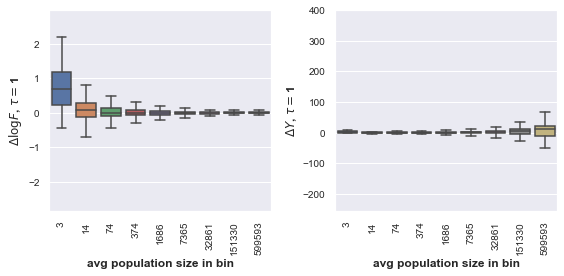

In [69]:
plot_growth_vs_popnsize(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True
                             )

In [65]:
 naics_keys_to_plot

['naics_11',
 'naics_21',
 'naics_22',
 'naics_23',
 'naics_31',
 'naics_42',
 'naics_44',
 'naics_48',
 'naics_51',
 'naics_52',
 'naics_53',
 'naics_54',
 'naics_55',
 'naics_56',
 'naics_61',
 'naics_62',
 'naics_71',
 'naics_72',
 'naics_81']

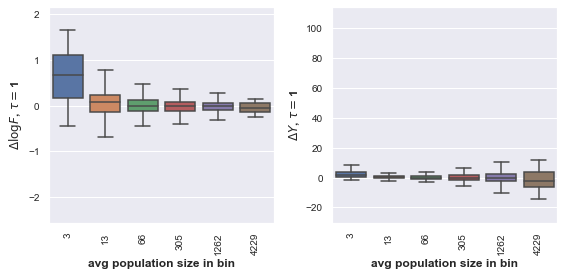

agriculture


/Users/ashish/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/ashish/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


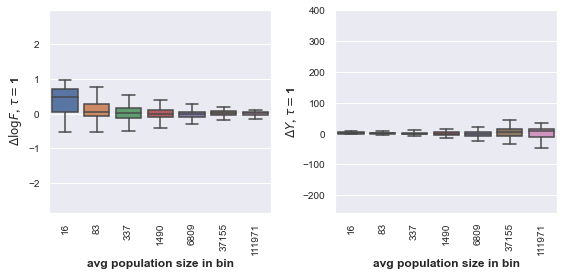

management


In [72]:
plot_growth_vs_popnsize(df_metroF_time, df_metro_time,
                              ['naics_11'], years,tau=1, 
                              remove_imputed_values=True
                             )
print('agriculture')

plot_growth_vs_popnsize(df_metroF_time, df_metro_time,
                              ['naics_55'], years,tau=1, 
                              remove_imputed_values=True
                             )
print('management')

##### frequency dependent growth rate of each industry

In [76]:

def get_df_deltaFY_and_F0(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True
                             ):    
#     print('removing all zeros because we cannot divide by zero.')
    logratio_change_naics=[]
    msas = df_metroF_time['msa'].values
#     df_deltaFY_popn_size={'F0':[],'Navg':[], 'Ntot0':[],'Ntotavg':[],'delta_logF':[],'deltaY':[]}
    n_msas = len(msas)
    F0, Favg, delta_logF, delta_Y = ([] for i in range(4))
    for i in range(len(years)-tau):
        year1=years[i]
        year2=years[i+tau]
#         naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
#         naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
        total_yr1 = ['total-Y'+year1]
        total_yr2 = ['total-Y'+year2]
        
        for naics in naics_keys_to_plot:
            naics_y1 = naics+'-Y'+year1 
            naics_y2 = naics+'-Y'+year2         
            if remove_imputed_values: 
                imp_y1=naics+'_imputed-Y'+year1
                imp_y2=naics+'_imputed-Y'+year2
#                 print (np.where(df_metroF_time[imp_y1].values==False)[0] )
                
                nonimputed_idx1=np.where(df_metroF_time[imp_y1].values==False)[0]    
                nonimputed_idx2=np.where(df_metroF_time[imp_y2].values==False)[0]    
                nonimputed_idx=np.intersect1d(nonimputed_idx1,nonimputed_idx2,assume_unique=True)
                nonzero_idx1=np.where(df_metro_time[naics_y1].values>0)[0]
                nonzero_idx2=np.where(df_metro_time[naics_y2].values>0)[0]
                nonzero_idx=np.intersect1d(nonzero_idx1,nonzero_idx2,assume_unique=True)
#                 print (nonzero_idx )
                idx_used=np.intersect1d(nonimputed_idx,nonzero_idx,assume_unique=True)
#                 print (idx_used)
#                 sys.exit(1)
            else:
                nonzero_idx1=np.where(df_metro_time[naics_y1].values>0)[0]
                nonzero_idx2=np.where(df_metro_time[naics_y2].values>0)[0]
                idx_used=np.intersect1d(nonzero_idx1,nonzero_idx2,assume_unique=True)

            
            F0.extend(df_metroF_time[naics_y1].values[idx_used])
            Favg.extend(
                (df_metroF_time[naics_y1].values[idx_used]+
                       df_metroF_time[naics_y2].values[idx_used])/2.)                            
            delta_logF.extend(
               np.log (df_metroF_time[naics_y2].values[idx_used]/
                       df_metroF_time[naics_y1].values[idx_used]))
            delta_Y.extend(
                (df_metro_time[naics_y2].values[idx_used]-
                       df_metro_time[naics_y1].values[idx_used])/np.sqrt(
                df_metro_time[naics_y1].values[idx_used]))
              
    df_deltaFY_and_F0=pd.DataFrame.from_dict(
        {'F0':np.ravel(F0),'Favg':np.ravel(Favg),
         'delta_logF':np.ravel(delta_logF),'delta_Y':np.ravel(delta_Y)})
    return df_deltaFY_and_F0

def plot_growth_vs_initialFrequency(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True
                             ):    
    df_deltaFY_and_F0=get_df_deltaFY_and_F0(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=tau, 
                              remove_imputed_values=remove_imputed_values)
                            
    Farr=df_deltaFY_and_F0['F0']
#     base=5
#     n_bins=int(math.log(Narr.max(),base))+1
#     bin_intervals=np.power(base,np.arange(n_bins+1))
    n_bins=10
    bin_intervals=np.linspace(0,np.max(Farr)+0.001,num=n_bins+1)
    
    df_plot={'avgF':[],'dlogF':[],'dY':[]}
    avgN_list=[]
    for bin_i in range(n_bins):
        start=bin_intervals[bin_i]
        end=bin_intervals[bin_i+1]
        Fsub=df_deltaFY_and_F0[(df_deltaFY_and_F0['F0']>=start)&
                               (df_deltaFY_and_F0['F0']<end)]['F0'].values

        
        dlogF_sub=df_deltaFY_and_F0[(df_deltaFY_and_F0['F0']>=start)&
                               (df_deltaFY_and_F0['F0']<end)]['delta_logF'].values
        
        dY_sub=df_deltaFY_and_F0[(df_deltaFY_and_F0['F0']>=start)&
                               (df_deltaFY_and_F0['F0']<end)]['delta_Y'].values
        
        df_plot['avgF'].extend(np.full(len(Fsub),"{:.2f}".format(Fsub.mean()) ))
#             (np.ones(len(Fsub))*np.mean(Fsub)) )
        df_plot['dlogF'].extend(dlogF_sub)
        df_plot['dY'].extend(dY_sub)
#         avgN_list.append(Nsub)
        
    suppress_plots=False
    if suppress_plots==True: return 0
    fig = plt.figure(figsize=(8, 4))
    ax1 = fig.add_subplot(1,2,1)
    sns.boxplot(x="avgF", y="dlogF", data=df_plot,ax=ax1,fliersize=0) 
    ax1.set_ylabel(r'$\Delta \log F $'+r', $\tau=$'+str(tau))
    
    ax2 = fig.add_subplot(1,2,2)
    sns.boxplot(x="avgF", y="dY", data=df_plot,ax=ax2,fliersize=0)
    ax2.set_ylabel(r'$\Delta Y$'+r', $\tau=$'+str(tau))
    

    for ax in [ax1,ax2]:        
        ax.set_xlabel('avg intial frequency in bin')
        ax.tick_params('x',labelrotation=90)

    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()

    




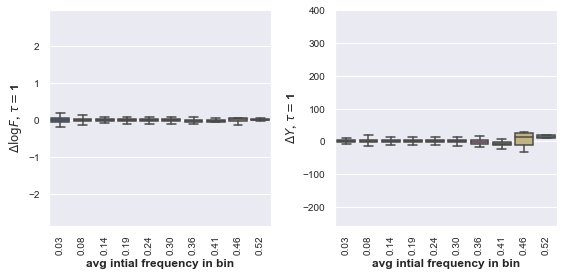

In [77]:
plot_growth_vs_initialFrequency(df_metroF_time, df_metro_time,
                              naics_keys_to_plot, years,tau=1, 
                              remove_imputed_values=True
                             )

agriculture


/Users/ashish/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:90: RuntimeWarning: Mean of empty slice.
/Users/ashish/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


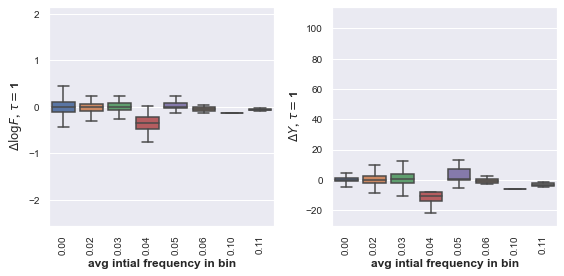

management


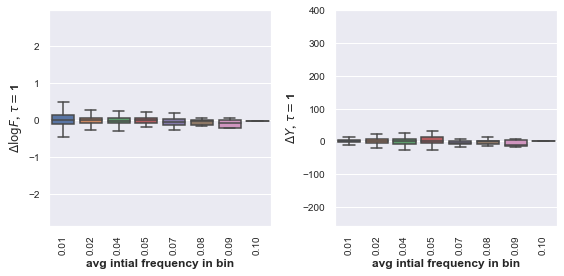

In [78]:
print('agriculture')
plot_growth_vs_initialFrequency(df_metroF_time, df_metro_time,
                              ['naics_11'], years,tau=1, 
                              remove_imputed_values=True
                             )
print('management')
plot_growth_vs_initialFrequency(df_metroF_time, df_metro_time,
                              ['naics_55'], years,tau=1, 
                              remove_imputed_values=True
                             )

## investigating outliers in growth 

In [17]:
from scipy.optimize import fsolve
import scipy.optimize
from scipy.stats import levy_stable

def investigate_outlier_jumps(df_metro_time, naics_keys_to_plot, years,title=None,
                                   xlabel=r'$\Delta N /N$',
                                   tau=1, scale_with_N=True):    
        
    DeltaN_change_naics=[]
    msas = df_metro_time['msa'].values
    n_msas = len(msas)  
    for i in range(len(years)-tau):
        year=years[i]
        year2=years[i+tau]
        naics_yr = [naics+'-Y'+year for naics in naics_keys_to_plot]
        naics_yr2 = [naics+'-Y'+year2 for naics in naics_keys_to_plot]
        total_yr = ['total-Y'+year]
        empF_naics1 = df_metro_time[naics_yr].values
        empF_naics2 = df_metro_time[naics_yr2].values
        if scale_with_N ==True:            
            nonzero_idx=np.nonzero(empF_naics1)
#             delta_f=np.ravel(empF_naics2[nonzero_idx]-empF_naics1[nonzero_idx])
#             scalefactor=np.ravel(np.sqrt(1.*empF_naics1[nonzero_idx]))
            delta_f=empF_naics2[nonzero_idx]-empF_naics1[nonzero_idx]
            scalefactor=1.*empF_naics1[nonzero_idx]
#             scaled_deltaf=(empF_naics2[nonzero_idx]-empF_naics1[nonzero_idx])*1./scalefactor
#             print(len(empF_naics1),len(empF_naics1[0]))

            ####### checking for outliers.
            print ('years=', years[i], years[i+tau])
            for c in range(len(empF_naics1)):
                for n in range(len(empF_naics1[0])):    
                    if empF_naics1[c,n]>0:
                        if np.abs(empF_naics2[c,n]-empF_naics1[c,n])>30*empF_naics1[c,n]:
                                print (c, n, df_metro_time['msa_name'][c],df_metro_time['msa'][c],
                                       sector_from_naics(df_naics_ref, naics_keys_to_plot[n], shorten=True),
                                       naics_keys_to_plot[n])
                                print ( empF_naics1[c,n], empF_naics2[c,n])
                                the_naics_all_yrs=[naics_keys_to_plot[n]+'-Y'+year for year in years]
                                print(df_metro_time[the_naics_all_yrs].iloc[c].values)
                                
            
#             scalefactor=np.ravel(empF_naics1[nonzero_idx])
            DeltaN_change_naics.extend(np.ravel(delta_f/scalefactor))
        else:

            DeltaN_change_naics.extend(np.ravel(empF_naics2-empF_naics1))

    DeltaN_change_naics=np.array(DeltaN_change_naics)
    
    
# def estimate_emp_from_empflag(empflag):
    #### function was used in section on reading and retabulating the data
est_dict={'A':math.ceil(np.sqrt(1*20)),
      'B':math.ceil(np.sqrt(20*100)),
      'C':math.ceil(np.sqrt(100*250)),
      'E':math.ceil(np.sqrt(250*500)),
      'F':math.ceil(np.sqrt(500*1000)),
      'G':math.ceil(np.sqrt(1000*2500)),
      'H':math.ceil(np.sqrt(2500*5000)),
      'I':math.ceil(np.sqrt(5000*10000)),
      'J':math.ceil(np.sqrt(1e4*2.5e4)),
      'K':math.ceil(np.sqrt(2.5e4*5e4)),
      'L':math.ceil(np.sqrt(5e4*1e5)),
      'M':math.ceil(np.sqrt(1e5*5e5)),
      'S':0##Withheld because estimate did not meet publication standards. Employment or payroll field set to zero.
     }


print ('imputed values were:')
a=[str(k)+':'+str(v)+' ' for k,v in est_dict.items() ]
print(a)

imputed values were:
['A:5 ', 'B:45 ', 'C:159 ', 'E:354 ', 'F:708 ', 'G:1582 ', 'H:3536 ', 'I:7072 ', 'J:15812 ', 'K:35356 ', 'L:70711 ', 'M:223607 ', 'S:0 ']


for example in Norwich-new london, looks like something happened between 2002 and 2003 and there were change in two categories. probably some misattribution?

252 16 Norwich-New London, CT Metro Area 35980 Arts naics_71
21512 1822
[21512  1822  1966  1787  1582  1919  2132  1960  1688  1733  1831  1840
  1750  1768  1776  1877]
252 17 Norwich-New London, CT Metro Area 35980 Accommodation naics_72
9205 30625
[ 9205 30625 30794 31623 30648 29043 29584 29205 28800 27619 27335 25793
 24692 25420 25381 25029]

In [9]:
years = [k.zfill(2) for k in np.arange(2, 18).astype(int).astype(str)]
_, _, _, naics_keys_to_plot = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2, drop_list=['99'])
investigate_outlier_jumps(df_metro_time, naics_keys_to_plot, years,title=None,
                               xlabel=r'$\Delta N/ N$',scale_with_N=True)

years= 02 03
years= 03 04
147 1 Hammond, LA Metro Area 25220 Mining naics_21
5 159
[  5   5 159  45  53  80 127  83 105 116  96  98 115 130  67  55]
219 1 Mankato-North Mankato, MN Metro Area 31860 Mining naics_21
5 354
[  0   5 354 354 354  50  50  50  50  50  50  50  50  50  50   0]
years= 04 05
344 14 The Villages, FL Metro Area 45540 Educational naics_61
5 354
[136 234   5 354 354 354 354 354 354 354 354 354 708 708 708 708]
years= 05 06
years= 06 07
261 1 Oshkosh-Neenah, WI Metro Area 36780 Mining naics_21
5 354
[ 45   5   5   5   5 354 159 159 159 159  45  45  45  45   5   0]
years= 07 08
282 12 Punta Gorda, FL Metro Area 39460 Management naics_55
60 15812
[   61    26    45    45    45    60 15812  7072  7072    79   354    60
    66   138   123   127]
years= 08 09
years= 09 10
years= 10 11
155 12 Hinesville, GA Metro Area 25980 Management naics_55
5 354
[ 15   5   5   5   5   5   5   5   5 354 354 354 354 708 159   0]
years= 11 12
57 0 Carson City, NV Metro Area 16180 Agricultu

Punta Gorda metro area is in Charlotte county in Florida.
it showed the following fluctuation in management employment:

|2004 | 2005 | 2006 | 2007 | 2008 | 2009 |  2010 | 2011 | 2012 |
|:-: |:-: | :-: | :-: | :-: | :-: | :-: | :-: | :-: |
| 45 | 45 | 60 | 15812 | 7072 | 7072 |  79  | 354 |60|


where 15812, 7072, 354, and 45 are all values that were obtained by imputation from noise flag

Charlotte county has a population of 159,978 (2010 census). Punta Gorda city has a population of 16,641 (2010 census). 
Punta Gorda MSA is a part of a combined statistical area of Sarasota-Bradenton-Punta Gorda with a population of 702,281 in 2010 census

the jump in the management population was not cause sudden migration of employment from the other, bigger msa in the combined statistical area, (North Port-Sarasota-Bradenton)

The Sarasota msa had migration employeent time series:

|2004 | 2005 | 2006 | 2007 | 2008 | 2009 |  2010 | 2011 | 2012 |
|:-: |:-: | :-: | :-: | :-: | :-: | :-: | :-: | :-: |
|2407|	2178|	3093|	4783|	4418|	4350|	4103|	4138|	2873|



best reason I could come up with is the construction of a mall in 2007 by a real estate company that also has its corporate office in punta gorda (and hence could have been misclassified??
https://www.prweb.com/releases/2006/10/prweb463943.htm

In [25]:
df_metro_time[df_metro_time['msa']==39460]

,msa,msa_name,Metro,FIPS,msa-Y02,total-Y02,total_NF-Y02,total_empflag-Y02,naics_11-Y02,naics_11_NF-Y02,...,naics_71_empflag-Y18,naics_72-Y18,naics_72_NF-Y18,naics_72_empflag-Y18,naics_81-Y18,naics_81_NF-Y18,naics_81_empflag-Y18,naics_99-Y18,naics_99_NF-Y18,naics_99_empflag-Y18
282,39460,"Punta Gorda, FL Metro Area",True,[12015],39460,31486,NaN,Y,5,NaN,...,NaN,6190,G,NaN,1933,G,NaN,0,0,NaN


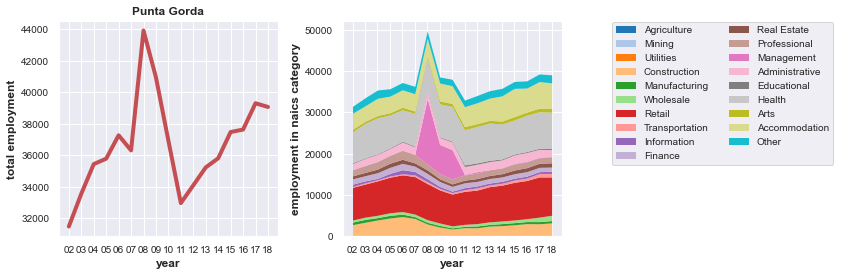

In [37]:
stackPlot_for_1city(df_metro_time,'Punta Gorda',unq_naics_list)

In [26]:
df_metro_time[df_metro_time['msa']==35840]

,msa,msa_name,Metro,FIPS,msa-Y02,total-Y02,total_NF-Y02,total_empflag-Y02,naics_11-Y02,naics_11_NF-Y02,...,naics_71_empflag-Y18,naics_72-Y18,naics_72_NF-Y18,naics_72_empflag-Y18,naics_81-Y18,naics_81_NF-Y18,naics_81_empflag-Y18,naics_99-Y18,naics_99_NF-Y18,naics_99_empflag-Y18
251,35840,"North Port-Sarasota-Bradenton, FL Metro Area",True,"[12081, 12115]",35840,207513,NaN,YY,1293,NaN,...,NaN,33430,GG,NaN,11974,GG,NaN,20,JJ,NaN


In [29]:
management_time_keys=['naics_55-Y02', 'naics_55-Y03', 'naics_55-Y04', 'naics_55-Y05', 'naics_55-Y06', 'naics_55-Y07', 'naics_55-Y08', 'naics_55-Y09', 'naics_55-Y10', 'naics_55-Y11', 'naics_55-Y12', 'naics_55-Y13', 'naics_55-Y14', 'naics_55-Y15', 
               'naics_55-Y16', 'naics_55-Y17']
df_metro_time[df_metro_time['msa']==35840][management_time_keys]

,naics_55-Y02,naics_55-Y03,naics_55-Y04,naics_55-Y05,naics_55-Y06,naics_55-Y07,naics_55-Y08,naics_55-Y09,naics_55-Y10,naics_55-Y11,naics_55-Y12,naics_55-Y13,naics_55-Y14,naics_55-Y15,naics_55-Y16,naics_55-Y17
251,1895,2337,2407,2178,3093,4783,4418,4350,4103,4138,2873,2309,3520,4005,3724,3819


In [32]:
construction_time_keys=['naics_23-Y02', 'naics_23-Y03', 'naics_23-Y04', 'naics_23-Y05', 'naics_23-Y06', 'naics_23-Y07', 'naics_23-Y08', 'naics_23-Y09', 'naics_23-Y10', 'naics_23-Y11', 'naics_23-Y12', 'naics_23-Y13', 'naics_23-Y14', 'naics_23-Y15', 
               'naics_23-Y16', 'naics_23-Y17']
print('construction in punta gorda')
df_metro_time[df_metro_time['msa']==39460][construction_time_keys]


,naics_23-Y02,naics_23-Y03,naics_23-Y04,naics_23-Y05,naics_23-Y06,naics_23-Y07,naics_23-Y08,naics_23-Y09,naics_23-Y10,naics_23-Y11,naics_23-Y12,naics_23-Y13,naics_23-Y14,naics_23-Y15,naics_23-Y16,naics_23-Y17
282,2726,3253,3830,4316,4688,4233,2886,2143,1717,1974,1939,2348,2450,2682,2944,2895


In [33]:
construction_time_keys=['naics_53-Y02', 'naics_53-Y03', 'naics_53-Y04', 'naics_53-Y05', 'naics_53-Y06', 'naics_53-Y07', 'naics_53-Y08', 'naics_53-Y09', 'naics_53-Y10', 'naics_53-Y11', 'naics_53-Y12', 'naics_53-Y13', 'naics_53-Y14', 'naics_53-Y15', 
               'naics_53-Y16', 'naics_53-Y17']
print('real estate in punta gorda')
df_metro_time[df_metro_time['msa']==39460][construction_time_keys]

real estate in punta gorda


,naics_53-Y02,naics_53-Y03,naics_53-Y04,naics_53-Y05,naics_53-Y06,naics_53-Y07,naics_53-Y08,naics_53-Y09,naics_53-Y10,naics_53-Y11,naics_53-Y12,naics_53-Y13,naics_53-Y14,naics_53-Y15,naics_53-Y16,naics_53-Y17
282,729,796,878,1002,978,792,842,651,598,649,688,719,772,901,960,987


In [31]:
for key in naics_keys:
    print (key, sector_from_naics(df_naics_ref, key, shorten=True) )

naics_11 Agriculture
naics_21 Mining
naics_22 Utilities
naics_23 Construction
naics_31 Manufacturing
naics_42 Wholesale
naics_44 Retail
naics_48 Transportation
naics_51 Information
naics_52 Finance
naics_53 Real Estate
naics_54 Professional
naics_55 Management
naics_56 Administrative
naics_61 Educational
naics_62 Health
naics_71 Arts
naics_72 Accommodation
naics_81 Other


In [37]:
df_metro_time.head()

,msa,msa_name,Metro,FIPS,msa-Y02,total-Y02,total_NF-Y02,total_empflag-Y02,naics_11-Y02,naics_11_NF-Y02,...,naics_71_empflag-Y18,naics_72-Y18,naics_72_NF-Y18,naics_72_empflag-Y18,naics_81-Y18,naics_81_NF-Y18,naics_81_empflag-Y18,naics_99-Y18,naics_99_NF-Y18,naics_99_empflag-Y18
0,10180,"Abilene, TX Metro Area",True,"[48059, 48253, 48441]",10180,54004,NaN,YYY,75,NaN,...,NaN,7413,GGG,NaN,3302,HGG,NaN,0,000,NaN
1,10420,"Akron, OH Metro Area",True,"[39133, 39153]",10420,289151,NaN,YY,16,NaN,...,NaN,29045,GG,NaN,13118,GG,NaN,8,GG,NaN
2,10500,"Albany, GA Metro Area",True,"[13007, 13095, 13177, 13273, 13321]",10500,50369,NaN,YYYYY,417,NaN,...,NaN,5404,0GGJG,NaN,1986,JGHGH,NaN,0,00000,NaN
3,10540,"Albany, OR Metro Area",True,[41043],10540,32547,NaN,Y,560,NaN,...,NaN,3552,G,NaN,1885,G,NaN,2,G,NaN
4,10580,"Albany-Schenectady-Troy, NY Metro Area",True,"[36001, 36083, 36091, 36093, 36095]",10580,317209,NaN,YYYYY,105,NaN,...,NaN,36473,GGGGG,NaN,15528,GGGGH,NaN,13,JGJ00,NaN


## Autocorrelation in time series

- is temporal mean of autocorrelation supposed to be the sq mean of the timeseries itself?
- is the autocorrelation actually periodic?
- is the time series anticorrelated (and hence subdiffusion?)

In [5]:
def autocorrelation (X):
    '''current normalization assumes stationarity. 
    could be redone with mean and variance restricted to the specific time intervals'''
    X=X-X.mean()
    result=np.correlate(X,X,mode='full')/(np.var(X)*len(X))
    return result[len(result)//2:]
    
    

        








(3444, 16)


/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: divide by zero encountered in true_divide
  return n/db/n.sum(), bin_edges
/Users/ashish/anaconda3/envs/cities/lib/python3.7/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


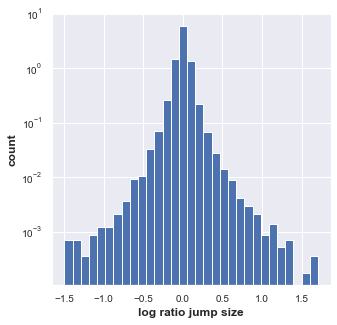

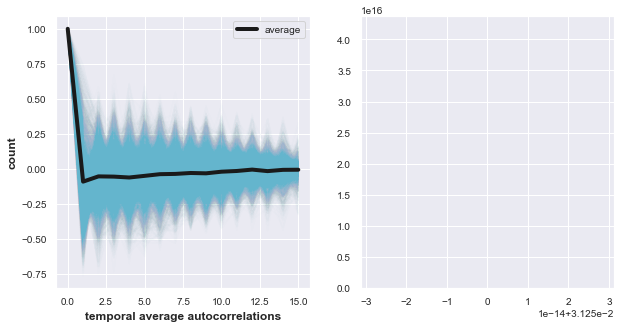

In [9]:
delta_log_ratio=get_strictest_log_ratio_time_series(df_metroF_time, naics_keys_to_plot, years)
fig1 = plt.figure(figsize=(5, 5))
ax = fig1.add_subplot()
temp=np.ravel(delta_log_ratio)
ax.hist(temp,bins=31,density=True)
ax.set_yscale('log')
ax.set_xlabel('log ratio jump size')
ax.set_ylabel('count')
fig1.patch.set_facecolor('white')

fig2 = plt.figure(figsize=(10, 5))
ax1 = fig2.add_subplot(1,2,1)
all_autocorr=[]
temporal_avg_autocorr=[]
for row in delta_log_ratio:
    autocorr=autocorrelation(np.array(row))
    ax1.plot(np.arange(len(autocorr)),autocorr,'c-', alpha=0.01)
    all_autocorr.append(autocorr)
    temporal_avg_autocorr.append(np.mean(autocorr))
    
    
ax1.plot(np.arange(len(autocorr)), np.mean(np.asarray(all_autocorr),axis=0),'k-',lw=4,label='average')
ax1.legend(loc='best')
ax1.set_ylabel('autocorrelation')
ax1.set_xlabel('time lag (yrs)')

ax2 = fig2.add_subplot(1,2,2)
ax2.hist(temporal_avg_autocorr,bins=31,density=True)
ax1.set_xlabel('temporal average autocorrelations')
ax1.set_ylabel('count')


fig2.patch.set_facecolor('white')
plt.show()

In [10]:
print(np.shape(delta_log_ratio), np.shape(np.mean(delta_log_ratio,axis=1)))

(3444, 16) (3444,)


In [52]:
np.mean(temporal_avg_autocorr), np.std(temporal_avg_autocorr)

(0.033333333333333326, 1.3429304798490351e-17)

0 0.03333333333333333
[ 1.         -0.08482029 -0.37884176  0.0425289  -0.04734489 -0.00715489
 -0.08696819 -0.02851518  0.11024357 -0.10070245 -0.20757073  0.33679978
  0.19750795 -0.16310463 -0.08205718]
50 0.03333333333333333
[ 1.         -0.02944782 -0.12705174 -0.0552368  -0.36511592  0.19137644
 -0.05259386 -0.03570489  0.14034363 -0.07965976 -0.07604253 -0.01194553
 -0.0065445   0.02060308 -0.01297981]
100 0.03333333333333331
[ 1.          0.30344892 -0.02607833  0.00865487 -0.19563449 -0.21259772
  0.17342768  0.02975237 -0.34458528 -0.16374227 -0.18369336 -0.11533323
  0.09972517  0.13846454 -0.01180886]
150 0.03333333333333333
[ 1.          0.18078247 -0.20423137  0.22885706  0.10787468 -0.17084249
 -0.1175557  -0.20459485 -0.24015144 -0.05426619  0.00193025 -0.09802997
 -0.08271323  0.11005923  0.04288156]


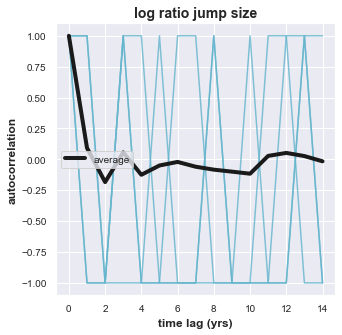

In [54]:
fig2 = plt.figure(figsize=(5, 5))
ax1 = fig2.add_subplot()
all_autocorr=[]
for i, row in enumerate(delta_log_ratio):
    if i%50==0:
        autocorr=autocorrelation(np.array(row))
        sign_of_autocorr=autocorr/np.abs(autocorr)
        ax1.plot(np.arange(len(autocorr)),sign_of_autocorr,'c-', alpha=0.8)
        all_autocorr.append(autocorr)
        print (i,np.mean(autocorr))
        print (autocorr)     
    if i>154:
        
        break
ax1.plot(np.arange(len(autocorr)), np.mean(np.asarray(all_autocorr),axis=0),'k-',lw=4,label='average')
ax1.legend(loc='best')
ax1.set_ylabel('autocorrelation')
ax1.set_xlabel('time lag (yrs)')
ax1.set_title('log ratio jump size')
fig2.patch.set_facecolor('white')
plt.show()

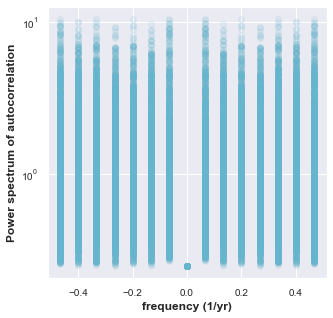

In [49]:
fig2 = plt.figure(figsize=(5, 5))
ax1 = fig2.add_subplot()
all_autocorr=[]
for i, row in enumerate(delta_log_ratio):
    if i%2==0:
        autocorr=autocorrelation(np.array(row))
        ps = np.abs(np.fft.fft(autocorr))**2
        time_step = 1.
        freqs = np.fft.fftfreq(autocorr.size, time_step)
        idx = np.argsort(freqs)

        ax1.plot(freqs[idx], ps[idx],'co', alpha=0.1)
#         all_autocorr.append(autocorr)
    
# ax1.plot(np.arange(len(autocorr)), np.mean(np.asarray(all_autocorr),axis=0),'k-',lw=4,label='average')
ax1.set_yscale('log')
ax1.set_ylabel('Power spectrum of autocorrelation')
ax1.set_xlabel('frequency (1/yr)')
# ax1.set_title('log ratio jump size')
fig2.patch.set_facecolor('white')
plt.show()

In [60]:
dataTransformed3 = data - mean(data)
data4 = numpy.zeros(1000)
data4[::10] = 1 #simulate a photon counter where a 1 indicates a photon came in at time indexed by array. 
# we could assume that the sample rate was 10 Hz for example
ps1 = np.abs(np.fft.fft(data))**2


0.0 0.01819162885420514
[ 1.         -0.51491158  0.07832654 -0.13645806  0.18182133 -0.22750419
 -0.01229977  0.32358243 -0.18864966  0.02938277 -0.09194018  0.12882749
 -0.11674161  0.05580085 -0.01468795  0.0054516 ]


# how much data was suppressed, imputed?

data suppressing somehow has decreased quite drastically from 2014. Unclear why. But perhaps data post 2015 is a little more reliable.

For years 2002-2007, if empflag is all 'Y' then no data suppression. If '0' then data was recorded as zero. If 'A-M', then some data was imputed as the geometric mean of the interval. If 'S' then left as zero, data is truly missing.
For years 2007-2018, if NF was 'D' or 'S', then data was suppressed. In this case, empflag was used as above to impute data.

In [112]:
def estimate_emp_from_empflag(empflag):
    est_dict={'A':math.ceil(np.sqrt(1*20)),
              'B':math.ceil(np.sqrt(20*100)),
              'C':math.ceil(np.sqrt(100*250)),
              'E':math.ceil(np.sqrt(250*500)),
              'F':math.ceil(np.sqrt(500*1000)),
              'G':math.ceil(np.sqrt(1000*2500)),
              'H':math.ceil(np.sqrt(2500*5000)),
              'I':math.ceil(np.sqrt(5000*10000)),
              'J':math.ceil(np.sqrt(1e4*2.5e4)),
              'K':math.ceil(np.sqrt(2.5e4*5e4)),
              'L':math.ceil(np.sqrt(5e4*1e5)),
              'M':math.ceil(np.sqrt(1e5*5e5)),
              'S':0##Withheld because estimate did not meet publication standards. Employment or payroll field set to zero.
             }
    return int(est_dict[empflag])

In [38]:

years = [k.zfill(2) for k in np.arange(2, 7).astype(int).astype(str)]
years=['02','08', '14','15']
metros = df_metro_time['msa'].values
num_metros = len(metros)
years2to7=[k.zfill(2) for k in np.arange(2, 7).astype(int).astype(str)]
years7to18=[k.zfill(2) for k in np.arange(7, 18).astype(int).astype(str)]
emp_suppresion_flags = ['A', 'B', 'C', 'E',
                        'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'S']
NF_suppresion_flags = ['D', 'S']

tot_and_naics_keys = ['total']+naics_keys

for year in years:
    atleast1_suppression_list = []
    num_suppression_list = []
    fracs_emp_imputed_list=[]
    avg_frac_emp_imputed_list=[]
    for naics in tot_and_naics_keys:
        num_counties = 0
        atleast1_suppression = 0
        num_suppression = 0
        ## if in 2002-07 then no NF. from 2007-18, there was NF provided
        if year in years2to7:
            empflag_naics = df_metro_time[naics+'_empflag'+'-Y'+year].values        
            for sub in empflag_naics:
                num_counties += len(sub)
                emp_imputed=0
                if any(x in sub for x in emp_suppresion_flags):
                    atleast1_suppression += 1
                    num_Y = np.sum([x == 'Y' for x in sub])# all except Y and 0 are suppression flags
                    num_0 = np.sum([x == '0' for x in sub])
                    num_suppression += len(sub)-num_Y-num_0
        elif year in years7to18:
            FIPS_list=df_metro_time['FIPS'].values
            Nflag_naics = df_metro_time[naics+'_NF'+'-Y'+year].values
            empflag_naics = df_metro_time[naics+'_empflag'+'-Y'+year].values
            emp_naics= df_metro_time[naics+'-Y'+year].values
            fracs_emp_imputed=[]
            for counties, Nflag, empflag, emp in zip(FIPS_list,Nflag_naics,empflag_naics, emp_naics):
                num_counties += len(counties)
                emp_imputed=0
                if any(x in Nflag for x in NF_suppresion_flags):
                    if any(x in empflag for x in emp_suppresion_flags):
                        atleast1_suppression += 1
                        num_Y = np.sum([x == 'Y' for x in empflag]) # all except Y and 0 are suppression flags
                        num_0 = np.sum([x == '0' for x in empflag])+np.sum([x == 0 for x in empflag])  
                        num_suppression += len(empflag)-num_Y-num_0                   
                        for flag in empflag:
                            if flag!='Y' and flag!='0' and flag!=0:
                                emp_imputed+=estimate_emp_from_empflag(flag)
                if emp!=0:
                    fracs_emp_imputed.append(emp_imputed*1./emp)
                else:
                    fracs_emp_imputed.append(0.)
                if fracs_emp_imputed[-1]!=fracs_emp_imputed[-1]:
                    print(fracs_emp_imputed[-1])
                    print (emp, emp_imputed,  empflag)
                    sys.exit(1)
        atleast1_suppression_list.append(atleast1_suppression)
        num_suppression_list.append(num_suppression)
        fracs_emp_imputed_list.append(fracs_emp_imputed)
        avg_frac_emp_imputed_list.append(np.mean(fracs_emp_imputed))
    frac_atleast1_suppression_list = [
        k*1./num_metros for k in atleast1_suppression_list]
    frac_suppression_list = [k*1./num_counties for k in num_suppression_list]

    fig = plt.figure(figsize=(12, 12))
    labels_naics = [sector_from_naics(
        df_naics_ref, key, shorten=True) for key in tot_and_naics_keys]
    ax1 = fig.add_subplot(2, 2, 1)
    # ax1.bar(labels_naics,frac_atleast1_suppression_list,width=-0.8,align='edge')
    ax1.barh(labels_naics[::-1], frac_atleast1_suppression_list[::-1],
             height=0.8, align='center')
    ax1.set_yticklabels(labels_naics[::-1], weight='bold')
    ax1.set_xlim(0.,1.)
    ax1.set_xlabel(r'fraction metros with $\geq 1$ suppressed contribution')

    ax2 = fig.add_subplot(2, 2, 2)
    ax2.barh(labels_naics[::-1], frac_suppression_list[::-1], color=color_list_def[1])
    ax2.set_yticklabels(labels_naics[::-1],  weight='bold')
    ax2.set_xlabel('fraction of counties in metros with suppressed data')
    ax2.set_xlim(0.,1.)
    ax1.set_title('20'+year)
    ax2.set_title('20'+year)
    fig.patch.set_facecolor('white')
    
    
    
    ax3 = fig.add_subplot(2, 2, 3)
    ax3.barh(labels_naics[::-1], avg_frac_emp_imputed_list[::-1], color=color_list_def[1])
    ax3.set_yticklabels(labels_naics[::-1],  weight='bold')
    ax3.set_xlabel('avg fraction of employment imputed')
    ax3.set_xlim(0.,1.)
    
    ax4 = fig.add_subplot(2, 2, 4)
    n_cats=len(labels_naics)
    for idx in np.arange(n_cats):

        ax4.violinplot(fracs_emp_imputed_list[idx],positions=[n_cats-idx-1],vert=False, widths=1.,showmeans=True)

    ax4.set_yticks(np.arange(len(labels_naics)))
    ax4.set_yticklabels(labels_naics[::-1],  weight='bold')
    ax4.set_xlabel('fraction of employment imputed')

    ax1.set_title('20'+year)
    ax2.set_title('20'+year)
    fig.patch.set_facecolor('white')
    
    plt.tight_layout()
    plt.show()


NameError: name 'fracs_emp_imputed' is not defined

In [121]:
fracs_emp_imputed_list

[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0076545505654420825,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0006325644161430439,
  0.0,
  0.0,
  0.02026292190570682,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.01593119977442549,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
 

In [106]:
##for 2007 to 2018 (not 2018)
years = [k.zfill(2) for k in np.arange(7, 18).astype(int).astype(str)]
years=['']
metros = df_metro_time['msa'].values
num_metros = len(metros)
emp_suppresion_flags = ['A', 'B', 'C', 'E',
                        'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'S']
NF_suppresion_flags = ['D', 'S']
tot_and_naics_keys = ['total']+naics_keys

for year in years:
    atleast1_suppression_list = []
    num_suppression_list = []

    for naics in tot_and_naics_keys:
        num_counties = 0
        atleast1_suppression = 0
        num_suppression = 0
        FIPS_list=df_metro_time['FIPS'].values
        Nflag_naics = df_metro_time[naics+'_NF'+'-Y'+year].values
        empflag_naics = df_metro_time[naics+'_empflag'+'-Y'+year].values
        for counties, Nflag, empflag in zip(FIPS_list,Nflag_naics,empflag_naics):
            num_counties += len(counties)

            if any(x in Nflag for x in NF_suppresion_flags):
                if any(x in empflag for x in emp_suppresion_flags):
                    atleast1_suppression += 1
                    num_Y = np.sum([x == 'Y' for x in empflag])
                    num_0 = np.sum([x == '0' for x in empflag])
                    # all except Y and 0 are suppression flags
                    num_suppression += len(empflag)-num_Y-num_0
                else:
                    print (Nflag, empflag, counties)
                    sys.exit(1)
        atleast1_suppression_list.append(atleast1_suppression)
        num_suppression_list.append(num_suppression)

    frac_atleast1_suppression_list = [
        k*1./num_metros for k in atleast1_suppression_list]
    frac_suppression_list = [k*1./num_counties for k in num_suppression_list]

    fig = plt.figure(figsize=(12, 6))
    labels_naics = [sector_from_naics(
        df_naics_ref, key, shorten=True) for key in tot_and_naics_keys]
    ax1 = fig.add_subplot(1, 2, 1)
    # ax1.bar(labels_naics,frac_atleast1_suppression_list,width=-0.8,align='edge')
    ax1.barh(labels_naics[::-1], frac_atleast1_suppression_list[::-1],
             height=0.8, align='center')
    ax1.set_yticklabels(labels_naics[::-1], weight='bold')
    ax1.set_xlim(0.,1.)
    ax1.set_xlabel(r'fraction metros with $\geq 1$ suppressed contribution')

    ax2 = fig.add_subplot(1, 2, 2)
    ax2.barh(labels_naics[::-1], frac_suppression_list[::-1], color=color_list_def[1])
    ax2.set_yticklabels(labels_naics[::-1],  weight='bold')
    ax2.set_xlabel('fraction of counties in metros with suppressed data')
    ax2.set_xlim(0.,1.)
    ax1.set_title('20'+year)
    ax2.set_title('20'+year)
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()

TypeError: argument of type 'numpy.float64' is not iterable

In [98]:
frac_suppression_list

[0.0,
 0.0003885771939272883,
 0.0008248743941263489,
 0.0022155717197608546,
 1.3634287506220644e-05,
 0.00010225715629665482,
 8.180572503732386e-05,
 0.0,
 6.817143753110322e-05,
 0.0002181486000995303,
 2.7268575012441288e-05,
 5.4537150024882575e-05,
 5.4537150024882575e-05,
 0.0005317372127426051,
 0.00011589144380287548,
 0.0004976514939770535,
 3.408571876555161e-05,
 0.00014316001881531677,
 3.408571876555161e-05,
 6.817143753110322e-06,
 0.0001840628813339787]

In [97]:
num_suppression_list

[0, 57, 121, 325, 2, 15, 12, 0, 10, 32, 4, 8, 8, 78, 17, 73, 5, 21, 5, 1, 27]

In [93]:
a=df_metro_time['naics_72_empflag-Y07'].values
a
df_metro_time['total_NF-Y07'].values

array(['GGG', 'GG', 'HGGHG', 'G', 'GGGGG', 'GGGG', 'HG', 'GGGG', 'G',
       'HHHGG', 'G', 'GG', 'G', 'G', 'GG', 'GGGG', 'GGGG',
       'GGGGGGGGGGGGGGGGHGGGGGGGGGGGG', 'G', 'G', 'HGGGGGG', 'GGGGG', 'G',
       'GGGGGGG', 'G', 'G', 'GGGGGGGGG', 'G', 'G', 'GGGG', 'GG', 'G', 'G',
       'GDG', 'GG', 'GGGGGGG', 'GGHH', 'GGGHG', 'GG', 'GG', 'GH', 'GGGGH',
       'GGGGGGG', 'G', 'HHGG', 'G', 'G', 'G', 'GGG', 'GG', 'G', 'GGH',
       'G', 'GG', 'G', 'GGG', 'GG', 'G', 'G', 'GGG', 'G', 'GGG', 'GHG',
       'GGG', 'GGGGGGGGGG', 'GGGGGG', 'GHHGGH', 'G', 'GGGGGGGGGGGGGG',
       'G', 'GHGGHGHGGGGGGGG', 'GGG', 'GG', 'GGGGG', 'G', 'GGG', 'GG',
       'G', 'GGGGGH', 'GGGGG', 'G', 'GGGGGGHGGG', 'GGG', 'G', 'GG', 'GH',
       'GGGGGGGGGGHGG', 'GG', 'G', 'G', 'GGGG', 'GGG', 'GG', 'G', 'GG',
       'GGGGGGGGGG', 'GGGGG', 'GGGGGG', 'GHG', 'G', 'G', 'GGG', 'GGGG',
       'G', 'GG', 'G', 'GHG', 'G', 'G', 'GG', 'G', 'G', 'G', 'HGGG', 'G',
       'GG', 'G', 'GG', 'HHGH', 'G', 'G', 'GG', 'GG', 'G', 'G', 'GGGG

In [14]:
a[0]

'YYY'

In [30]:
[x=='Y' for x in a[0]]

[True, True, True]

In [28]:
[x in a[0] for x in ['A', 'B','Y']]

[False, False, True]

In [27]:
np.sum([x in a[0] for x in ['A', 'B','Y']])

1

In [25]:
any(x in a[0] for x in ['A', 'B'])

False

In [15]:
np.all(a[0]=='Y')

False

In [10]:
np.where(a[0]!='Y')

(array([0]),)

# clustering of single year data
no clear clusters without dimensionality reduction. 
Even after dimensionality reduction, only silhouette score for two metrics is significant. Prediction strength is always poor.

## create dataframes

In [4]:
unq_naics_list, _, tot_and_unqnaics_fullcodes, naics_keys = naics_at_fixed_resolution(
    df_2018["naics"], naics_resolution=2,drop_list=['99'])


df_metroF_time=df_metro_time.copy()
years = [k.zfill(2) for k in np.arange(2, 19).astype(int).astype(str)]
naics_keys_yrs=[]
for year in years:
    naics_keys_yr=[k+'-Y'+year for k in naics_keys]
    naics_keys_yrs.extend(naics_keys_yr)
    df_metroF_time[naics_keys_yr]=df_metro_time[naics_keys_yr].values*1./df_metro_time['total-Y'+year].values[:,None]

    

     
fracs=df_metroF_time[naics_keys_yrs].values
##multiplicative pseduo count independent of city size
pseudo_count = np.min(fracs[fracs > 0]/10)
df_metro_logF_time=df_metroF_time.copy()
df_metro_CLRf_time=df_metroF_time.copy()

for year in years:
    naics_keys_yr=[k+'-Y'+year for k in naics_keys]
    Fracs_yr=df_metroF_time[naics_keys_yr].values    
    for city_idx in range(len(Fracs_yr)):
        if np.any(Fracs_yr[city_idx]==0):
            temp=np.array(Fracs_yr[city_idx])   
            delta=pseudo_count
            n_zeros=len(np.where(temp==0)[0])
            temp[np.nonzero(temp)]=temp[np.nonzero(temp)]*(1.-n_zeros*delta)
            temp[np.where(temp==0)[0]]=delta
            Fracs_yr[city_idx]=temp      

    df_metro_logF_time[naics_keys_yr]=np.log10(Fracs_yr) 
    gmean=scipy.stats.gmean(Fracs_yr,axis=1)
    clr_frac=np.log10(Fracs_yr/gmean[:,np.newaxis])
    df_metro_CLRf_time[naics_keys_yr]=clr_frac
    
    
      
df_metroRCA_time=df_metro_time.copy()    
df_metro_logRCA_time=df_metro_time.copy() 
for year in years:
    naics_keys_yr=[k+'-Y'+year for k in naics_keys]
    for naics in naics_keys_yr:
        country_wideF= np.sum(df_metro_time[naics].values)*1./np.sum(df_metro_time['total-Y'+year].values)       
        df_metroRCA_time[naics]=df_metroF_time[naics]/country_wideF 
for year in years:
    naics_keys_yr=[k+'-Y'+year for k in naics_keys]
    df_metro_logRCA_time[naics_keys_yr]=np.log10(pseudo_count+df_metroRCA_time[naics_keys_yr].values)


In [ ]:
def PCA_biplot(df_data,labels=None):
    PCA_obj = PCA(n_components=2)
    pca_vals = PCA_obj.fit_transform(df_data[emp_naics_keys])   
    fig = plt.figure(figsize=(6, 5))
    xs = pca_vals[:,0]
    ys = pca_vals[:,1]
    coeff=np.transpose(PCA_obj.components_[0:2, :])
    n = coeff.shape[0]
    scalex = 2.0/(xs.max() - xs.min())
    scaley = 2.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,s=5,alpha=0.5)
    
    abs_coeffs=np.abs(coeff)
    cutoff=np.mean(abs_coeffs)+np.std(abs_coeffs)
    for i in range(n):
        if (np.abs(coeff[i,0])+np.abs(coeff[i,1]))> cutoff:
            plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.9)
            if labels is None:
                plt.text(coeff[i,0]* 1.1, coeff[i,1] * 1.1, "Var"+str(i+1), color = 'green', ha = 'center', va = 'center')
            else:
                plt.text(coeff[i,0]* 1.1, coeff[i,1] * 1.1, labels[i], color = 'g', ha = 'center', va = 'center',fontweight='bold')
    plt.xlabel("PC{}".format(1), fontweight='bold',fontSize=fs)
    plt.ylabel("PC{}".format(2), fontweight='bold',fontSize=fs)
    fig.patch.set_facecolor('white')

## cluster

In [4]:
#
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans


from sklearn.model_selection import train_test_split
from scipy.spatial import distance as scipy_spatial_distance
from sklearn.metrics import pairwise_distances
from sklearn.manifold import MDS

def get_closest_centroid_ids(obs, centroids, distance_metric, k):
    '''
    Function for retrieving the closest centroid to the given observation
    in terms of the Euclidean distance.
    '''    
    if k > 1:
        if distance_metric is 'jensenshannon':              
            Distances = scipy_spatial_distance.cdist(obs, centroids, distance_metric)
        else:
            Distances = pairwise_distances(obs, centroids, metric=distance_metric)
        return np.argmin(Distances, axis=1)  
    else:
        return np.zeros(len(obs))

def get_prediction_strength(k, train_medoids, x_test, test_labels, 
                            distance_metric="euclidean", test_medoids=None):
    debugging=False
    
    '''
    Function for calculating the prediction strength of clustering

    Parameters
    ----------
    k : int
        The number of clusters
    train_medoids : array
        indices of medoids from the clustering on the training set
    x_test : array
        Test set observations
    test_labels : array
        Labels predicted for the test set
    distance_metric: string
        name of distance metric used

    Returns
    -------
    prediction_strength : float
        Calculated prediction strength
    '''
    # find the cluster labels (centroids in training set) that test would be assigned to.
    labels_of_test_in_train = get_closest_centroid_ids(
        x_test, train_medoids, distance_metric, k)

    # calculate the prediction strengths for each cluster
    ss = []
    for j in range(k):
        n_examples_j = np.count_nonzero(test_labels == j)
        labels_of_cluster_j_in_train = labels_of_test_in_train[test_labels == j]
        # compare using numpy broadcasting, without diagonal.....stack#39479578
        mask = labels_of_cluster_j_in_train[:,
                                            None] == labels_of_cluster_j_in_train
        mask[np.eye(n_examples_j, dtype=bool)] = 0
        n_same_cluster = np.count_nonzero(mask)
        ss.append(n_same_cluster*1.0 / (n_examples_j * (n_examples_j - 1)))

    prediction_strength = min(ss)
    
    if debugging:
        ss_string=''
        for i in ss:
            ss_string=ss_string+"{:.2f}".format(i)+', '
        df_test=pd.DataFrame(x_test,columns=emp_naics_keys)
        df_test['test_labels']=test_labels
        df_test['test_label_with_train_centroid']=labels_of_test_in_train
        
        ##NMDS plot
        fig2 = plt.figure(figsize=(8, 4))
        ax1 = fig2.add_subplot(1, 2, 1)   
        distances = compute_pairwise_distances(df_test[emp_naics_keys].values, distance_metric)
        NMDS_obj = MDS(n_components=2, dissimilarity='precomputed', n_init=8, max_iter=600,
                  n_jobs=4)
        NMDS_coords=NMDS_obj.fit_transform(distances)
        cluster_labels=df_test['test_labels']
        color_list = create_color_list(scheme_name='sns_tab10')
        i=0
        for group in list(set(cluster_labels)):
            idx_group=np.where(cluster_labels==group)[0]
#             print('len(idx_group)',len(idx_group))
            ax1.scatter(NMDS_coords[idx_group, 0], NMDS_coords[idx_group, 1],c=np.array(color_list[i])[np.newaxis,:], 
                       s=10, label=group)
            i+=1
        ax1.legend(loc='best')
#         ax1=plot_NMDS(distances, ax1, fs=10, ms=10,labels=df_test['test_labels'],mds=True)
        ax1.set_xlabel('MDS1')
        ax1.set_ylabel('MDS2')
        ax1.set_title(r'test labels, ps='+ss_string, fontweight='bold')
        ax2 = fig2.add_subplot(1, 2, 2)
        cluster_labels=df_test['test_label_with_train_centroid']
        i=0
        for group in list(set(cluster_labels)):
            idx_group=np.where(cluster_labels==group)[0]
            ax2.scatter(NMDS_coords[idx_group, 0], NMDS_coords[idx_group, 1],c=np.array(color_list[i])[np.newaxis,:], 
                       s=10, label=group)
            i+=1
        ax2.legend(loc='best')

        ax2.set_xlabel('MDS1')
        ax2.set_ylabel('MDS2')
        ax2.set_title(r'labelled by train centroid', fontweight='bold')        
        fig2.patch.set_facecolor('white')
        plt.tight_layout()
        plt.show()
        
        
        ##PCA plot
        fig2 = plt.figure(figsize=(8, 4))
        ax1 = fig2.add_subplot(1, 2, 1)
        ax1, PCA_object = plot_PCA(
            ax1, df_test, emp_naics_keys, standardized=True, label_key='test_labels')
        
        ax1.set_title(r'test labels, ps='+ss_string, fontweight='bold')
        ax2 = fig2.add_subplot(1, 2, 2)
        ax2, PCA_object = plot_PCA(
            ax2, df_test, emp_naics_keys, standardized=True, label_key='test_label_with_train_centroid')
        
        projected_medoids=PCA_object.transform(train_medoids)
        x_medoids=projected_medoids[:,0]
        y_medoids=projected_medoids[:,0]
        ax2.plot (x_medoids, y_medoids, 'r*', markersize=15)
        print ('medoids shape', np.shape(train_medoids), PCA_object.transform(train_medoids))
        ax2.set_title(r'labelled by train centroid', fontweight='bold')        
        fig2.patch.set_facecolor('white')
        plt.tight_layout()
        plt.show()
        
        
    
        
        pwise_dist_all = pairwise_distances(df_test[emp_naics_keys], 
                                             df_test[emp_naics_keys], metric=distance_metric)
        pwise_dist_within_cluster=[]
        pwise_dist_with_testMedoids=[]
        pwise_dist_with_trainMedoids=[]
        for clust in range(k):
            temp_data=df_test[df_test['test_labels']==clust][emp_naics_keys]

            temp_dist = pairwise_distances(temp_data, 
                                             temp_data, metric=distance_metric)
            pwise_dist_within_cluster.extend(temp_dist.flatten())
        
        pwise_dist_all=np.ravel(pwise_dist_all)
        pwise_dist_within_cluster=np.ravel(pwise_dist_within_cluster)
        temp_dist=pairwise_distances(df_test[emp_naics_keys], train_medoids, metric=distance_metric)
        pwise_dist_with_trainMedoids=np.ravel(np.min(temp_dist, axis=1) )

        temp_dist=pairwise_distances(df_test[emp_naics_keys], test_medoids, metric=distance_metric)
        pwise_dist_with_testMedoids=np.ravel(np.min(temp_dist, axis=1) )
        
        color_list = create_color_list(scheme_name='sns_tab10')
        fig = plt.figure(figsize=(8, 4))
#         ax1 = fig.add_subplot(1, 3, 1)
#         ax1.hist(pwise_dist_all,weights=np.ones_like(pwise_dist_all)/len(pwise_dist_all),
#                  color=color_list[0])
#         ax1.set_title(r'distance b/w all points', fontweight='bold')
        ax2 = fig.add_subplot(1, 2, 1)
        ax2.hist([pwise_dist_within_cluster, pwise_dist_all],
                 weights=[np.ones_like(pwise_dist_within_cluster)/len(pwise_dist_within_cluster),np.ones_like(pwise_dist_all)/len(pwise_dist_all)],
                 label=['within cluster', 'all'])
        ax2.set_title(r'ditance b/w pts in a cluster', fontweight='bold')
        ax2.legend(loc='best')
        
        ax3 = fig.add_subplot(1, 2, 2)
#         ax3.hist(np.ravel(pwise_dist_with_trainMedoids),color=color_list[2],label='with train',alpha=0.3) 
#         ax3.hist(np.ravel(pwise_dist_with_testMedoids),color=color_list[3],label='with test',alpha=0.3)       
        ax3.hist([pwise_dist_with_trainMedoids,pwise_dist_with_testMedoids],
                 weights=[np.ones_like(pwise_dist_with_trainMedoids)/len(pwise_dist_with_trainMedoids),np.ones_like(pwise_dist_with_testMedoids)/len(pwise_dist_with_testMedoids)],
                 label=['with train','with test']) 
        ax3.set_title(r'ditance b/w pts and closest medoids', fontweight='bold')
        ax3.legend(loc='best')
        fig.patch.set_facecolor('white')
        plt.tight_layout()
        plt.show()
        
    
    return prediction_strength

def do_kmedoids(df_km, k_list=range(1, 15), metrics_list=["euclidean"], test_split=0.5, ps_avgs=12, show_fig=True, standardize=False):
    '''
    performs k medoid clustering
    '''
    stdzd_vals = df_km.values
    if standardize:
        print('Standardizing before clustering.')
        stdzd_vals = StandardScaler().fit_transform(stdzd_vals)
    df_temp=pd.DataFrame(stdzd_vals, columns=df_km.columns, index=df_km.index)
    df_km=df_temp.copy()
    sse = []
    silhouette_list = []
    pred_strengths = []
    for metric_idx, distance_metric in enumerate(metrics_list):
        sse.append([])
        silhouette_list.append([])
        pred_strengths.append([])
        Distances = compute_pairwise_distances(df_km.values, distance_metric)

        for k in k_list:
            km = KMedoids(metric="precomputed", n_clusters=k)
            km.fit(Distances)
            sse[metric_idx].append([k, km.inertia_])

            if k >= 2:
                si_score = silhouette_score(
                    Distances, km.labels_, metric="precomputed")
                silhouette_list[metric_idx].append([k, si_score])

                # calculate prediction strength
                p_strengths = np.empty(0)
                for i in range(ps_avgs):
                    X_train, X_test = train_test_split(
                        df_km.values, test_size=test_split, stratify=km.labels_)
                    train_distances = compute_pairwise_distances(
                        X_train, distance_metric)
                    test_distances = compute_pairwise_distances(
                        X_test, distance_metric)
                    model_train = KMedoids(metric="precomputed",
                                           n_clusters=k).fit(train_distances)
                    model_test = KMedoids(metric="precomputed",
                                          n_clusters=k).fit(test_distances)
                    clusterCenters = X_train[model_train.medoid_indices_]
                    clusterCenters_test = X_test[model_test.medoid_indices_]
                    p_strength = get_prediction_strength(
                        k, clusterCenters, X_test, model_test.labels_, distance_metric=distance_metric, 
                         test_medoids=clusterCenters_test   )
                    p_strengths = np.append(p_strengths, p_strength)
                    p_strengths = np.append(p_strengths, 0.)
                pred_strengths[metric_idx].append(
                    [k, np.mean(p_strengths), np.std(p_strengths)/np.sqrt(ps_avgs)])
    if show_fig:
        color_list = create_color_list(scheme_name='sns_tab10')
        fig = plt.figure(figsize=(12,4))
        fs = 12
        ax1 = fig.add_subplot(1, 3, 1)
        for metric_idx, distance_metric in enumerate(metrics_list):
            ax1.plot(pd.DataFrame(silhouette_list[metric_idx])[
                     0], pd.DataFrame(silhouette_list[metric_idx])[1], marker='o', color=color_list[metric_idx], label=distance_metric)
        ax1.plot(ax1.get_xlim(), [.25, 0.25], 'k--')
        ax1.legend(loc='best')
        ax1.set_title('Silhouette score', fontsize=fs, fontweight='bold')
        ax1.set_xlabel('Number of clusters', fontsize=fs, fontweight='bold')
        ax1.set_ylabel('Silhouette score', fontsize=fs, fontweight='bold')

        ax2 = fig.add_subplot(1, 3, 2)
        for metric_idx, distance_metric in enumerate(metrics_list):
            ax2.errorbar(pd.DataFrame(pred_strengths[metric_idx])[
                0], pd.DataFrame(pred_strengths[metric_idx])[1], yerr=pd.DataFrame(pred_strengths[metric_idx])[2], color=color_list[metric_idx], label=distance_metric)
        ax2.plot(ax2.get_xlim(), [.8, 0.8], 'k--')
        ax2.legend(loc='best')
        ax2.set_title('Prediction Strength', fontsize=fs, fontweight='bold')
        ax2.set_xlabel('Number of clusters', fontsize=fs, fontweight='bold')
        ax2.set_ylabel('Prediction Strength', fontsize=fs, fontweight='bold')

        ax3 = fig.add_subplot(1, 3, 3)
        for metric_idx, distance_metric in enumerate(metrics_list):
            sse_values = pd.DataFrame(sse[metric_idx])[1]
            scaled_sse = sse_values/np.max(sse_values)
            ax3.plot(pd.DataFrame(sse[metric_idx])[
                     0], scaled_sse, color=color_list[metric_idx], marker='o', label=distance_metric)
        ax3.legend(loc='best')
        ax3.set_title('Elbow Method', fontsize=fs, fontweight='bold')
        ax3.set_xlabel('Number of clusters', fontsize=fs, fontweight='bold')
        ax3.set_ylabel('Scaled SSE/Inertia', fontsize=fs, fontweight='bold')
        plt.tight_layout()
        fig.patch.set_facecolor('white')

    if len(k_list) == 1 and len(metrics_list) == 1:  # return fit object and si score              
        return km, np.ravel(silhouette_list), np.ravel(pred_strengths)
    else:
        if show_fig:
            return sse, silhouette_list, pred_strengths, fig
        else:
            return sse, silhouette_list, pred_strengths, None

def do_kmeans(df_km, k_list=range(1, 15), ps_avgs=6,test_split=0.5, show_fig=True):
    '''
    performs k means clustering
    '''
    sse = []
    silhouette_list = []
    pred_strengths=[]
    for k in k_list:
        km = KMeans(n_clusters=k)
        km.fit(df_km.values)
        sse.append([k, km.inertia_])

        if k >= 2:
            si_score = silhouette_score(df_km, km.labels_, metric='euclidean')
            silhouette_list.append([k, si_score])
            # calculate prediction strength
            p_strengths=np.empty(0)
            for i in range(ps_avgs):
                X_train, X_test = train_test_split(
                    df_km.values, test_size=test_split, stratify=km.labels_)
                model_train =KMeans(n_clusters=k).fit(X_train)
                model_test = KMeans(n_clusters=k).fit(X_test)
                clusterCenters = model_train.cluster_centers_
                p_strength = get_prediction_strength(
                    k, clusterCenters, X_test, model_test.labels_, distance_metric='euclidean')
                p_strengths=np.append(p_strengths,p_strength)
            pred_strengths.append([k, np.mean(p_strengths), np.std(p_strengths)/np.sqrt(ps_avgs)])

    if show_fig:
        fig = plt.figure(figsize=(12,4))
        fs = 12
        ax1 = fig.add_subplot(1, 3, 1)
        ax1.plot(pd.DataFrame(silhouette_list)[
                 0], pd.DataFrame(silhouette_list)[1], marker='o')
        ax1.plot(ax1.get_xlim(), [.25, 0.25], 'k--')
        ax1.set_title('Silhouette score', fontsize=fs, fontweight='bold')
        ax1.set_xlabel('Number of clusters', fontsize=fs, fontweight='bold')
        ax1.set_ylabel('Silhouette score', fontsize=fs, fontweight='bold')

        ax2 = fig.add_subplot(1, 3, 2)
        ax2.errorbar(pd.DataFrame(pred_strengths)[
                 0], pd.DataFrame(pred_strengths)[1],yerr=pd.DataFrame(pred_strengths)[2])
        ax2.plot(ax2.get_xlim(), [.8, 0.8], 'k--')
        ax2.set_title('Prediction Strength', fontsize=fs, fontweight='bold')
        ax2.set_xlabel('Number of clusters', fontsize=fs, fontweight='bold')
        ax2.set_ylabel('Prediction Strength', fontsize=fs, fontweight='bold')

        ax3 = fig.add_subplot(1, 3, 3)
        ax3.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
        ax3.set_title('Elbow Method, (SSE)', fontsize=fs, fontweight='bold')
        ax3.set_xlabel('Number of clusters', fontsize=fs, fontweight='bold')
        ax3.set_ylabel('Inertia', fontsize=fs, fontweight='bold')
        plt.tight_layout()
        fig.patch.set_facecolor('white')
    if len(k_list) == 1:  # return fit object and si score        
        return km, np.ravel(silhouette_list), np.ravel(pred_strengths)
    else:
        if show_fig:
            return sse, silhouette_list, pred_strengths, fig
        else:
            return sse, silhouette_list, pred_strengths, None

Clustering on logRCA
Clustering on RCA


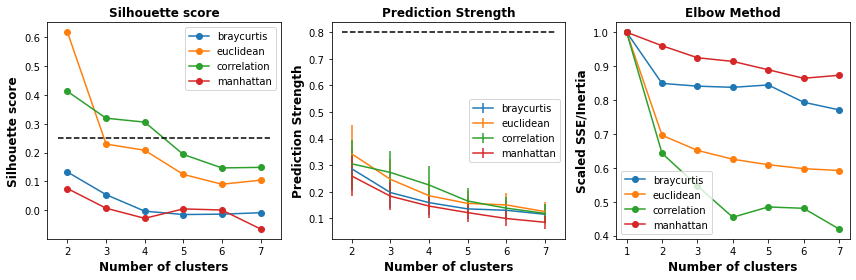

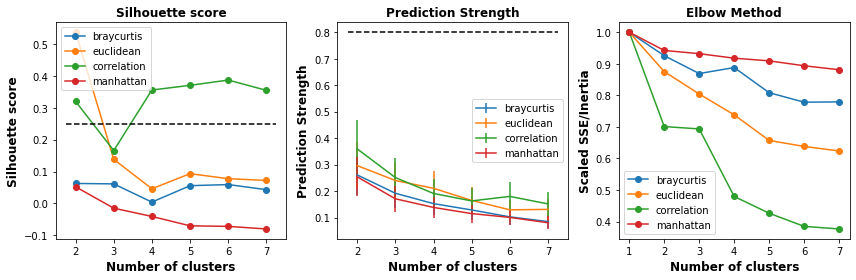

In [24]:
year='17'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
k_list=range(1,8)
_=do_kmedoids(df_metro_logRCA_time[naics_keys_yr], k_list, metrics_list=['braycurtis','euclidean','correlation','manhattan' ])
print ('Clustering on logRCA')

year='17'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
k_list=range(1,8)
_=do_kmedoids(df_metroRCA_time[naics_keys_yr], k_list, metrics_list=['braycurtis','euclidean','correlation','manhattan' ])
print ('Clustering on RCA')

Clustering on log Fractions


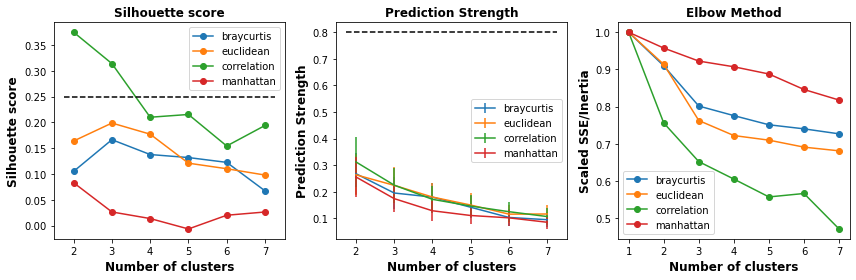

In [5]:
year='17'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
k_list=range(1,8)
_=do_kmedoids(df_metro_CLRf_time[naics_keys_yr], k_list, metrics_list=['braycurtis','euclidean','correlation','manhattan' ])
print ('Clustering on log Fractions')

Clustering on log Fractions


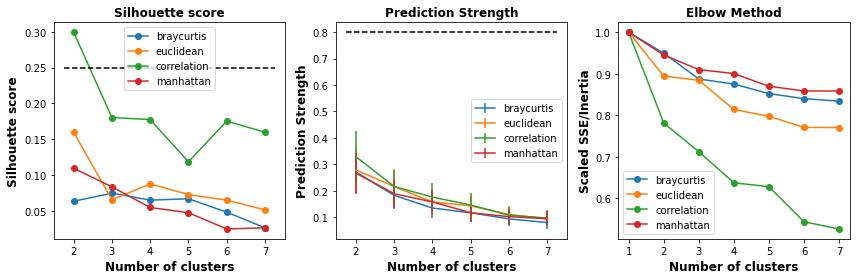

In [59]:
year='08'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
k_list=range(1,8)
_=do_kmedoids(df_metro_CLRf_time[naics_keys_yr], k_list, metrics_list=['braycurtis','euclidean','correlation','manhattan' ])
print ('Clustering on log Fractions')

Clustering on log Fractions


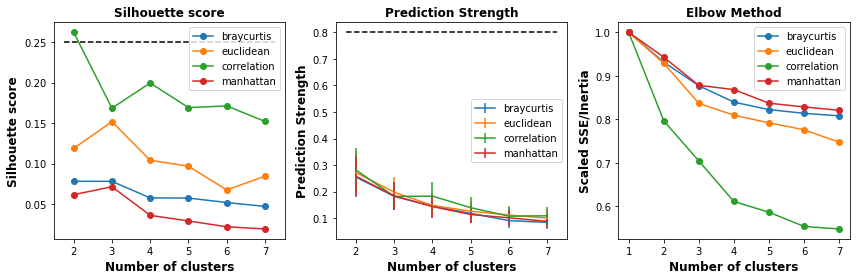

In [64]:
year='07'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
k_list=range(1,8)
_=do_kmedoids(df_metro_logF_time[naics_keys_yr], k_list, metrics_list=['braycurtis','euclidean','correlation','manhattan' ])


Clustering on log Fractions


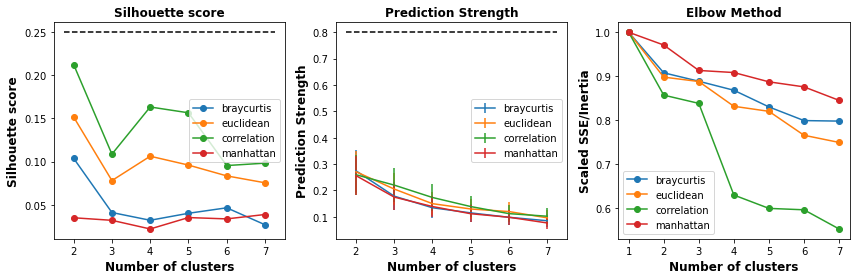

In [66]:
year='12'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
k_list=range(1,8)
_=do_kmedoids(df_metro_CLRf_time[naics_keys_yr], k_list, metrics_list=['braycurtis','euclidean','correlation','manhattan' ])


Clustering on log Fractions


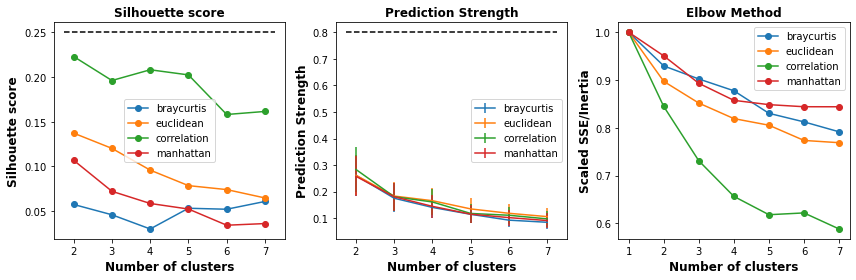

In [62]:
year='03'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
k_list=range(1,8)
_=do_kmedoids(df_metro_CLRf_time[naics_keys_yr], k_list, metrics_list=['braycurtis','euclidean','correlation','manhattan' ])


## clustering after dimensionality reduction improves silhouette score

number of dimensions= 4
total explained variation = 0.7750907391765667


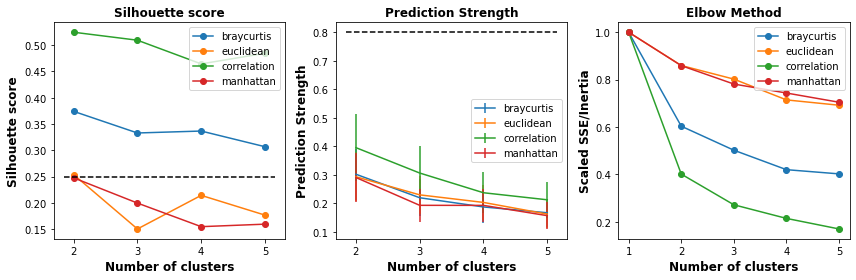

In [84]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
target_dim =4
year='08'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
PCA_obj = PCA(n_components=target_dim)
pca_vals = PCA_obj.fit_transform(df_metro_logF_time[naics_keys_yr])
print ('number of dimensions=',target_dim)
print('total explained variation = {}'.format(
    np.sum(PCA_obj.explained_variance_ratio_)))
pca_column_names = ['PC'+str(i+1) for i in range(target_dim)]
pca_vals_df = pd.DataFrame(data=pca_vals, columns=pca_column_names)

k_list = range(1, 6)
_,_,_,fig = do_kmedoids(pca_vals_df, k_list, metrics_list=[
                'braycurtis', 'euclidean', 'correlation', 'manhattan'])

number of dimensions= 4
total explained variation = 0.7703355063848492


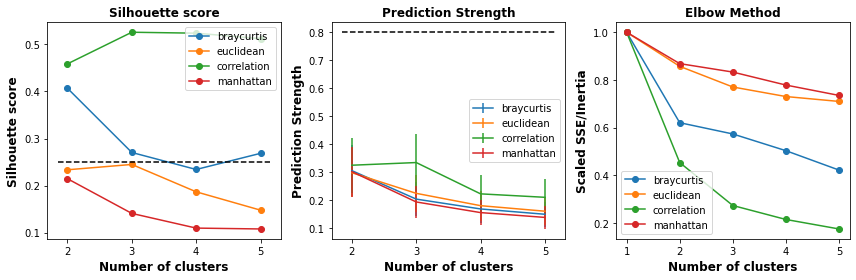

In [87]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
target_dim =4
year='12'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
PCA_obj = PCA(n_components=target_dim)
pca_vals = PCA_obj.fit_transform(df_metro_logF_time[naics_keys_yr])
print ('number of dimensions=',target_dim)
print('total explained variation = {}'.format(
    np.sum(PCA_obj.explained_variance_ratio_)))
pca_column_names = ['PC'+str(i+1) for i in range(target_dim)]
pca_vals_df = pd.DataFrame(data=pca_vals, columns=pca_column_names)

k_list = range(1, 6)
_,_,_,fig = do_kmedoids(pca_vals_df, k_list, metrics_list=[
                'braycurtis', 'euclidean', 'correlation', 'manhattan'])

number of dimensions= 4
total explained variation = 0.7365653406587169


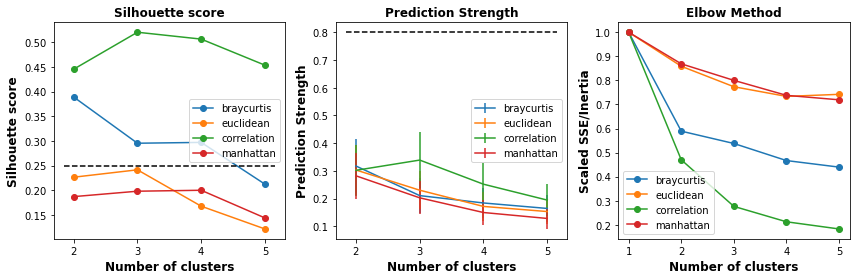

In [88]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
target_dim =4
year='02'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
PCA_obj = PCA(n_components=target_dim)
pca_vals = PCA_obj.fit_transform(df_metro_logF_time[naics_keys_yr])
print ('number of dimensions=',target_dim)
print('total explained variation = {}'.format(
    np.sum(PCA_obj.explained_variance_ratio_)))
pca_column_names = ['PC'+str(i+1) for i in range(target_dim)]
pca_vals_df = pd.DataFrame(data=pca_vals, columns=pca_column_names)

k_list = range(1, 6)
_,_,_,fig = do_kmedoids(pca_vals_df, k_list, metrics_list=[
                'braycurtis', 'euclidean', 'correlation', 'manhattan'])

number of dimensions= 3
total explained variation = 0.7793112666699458


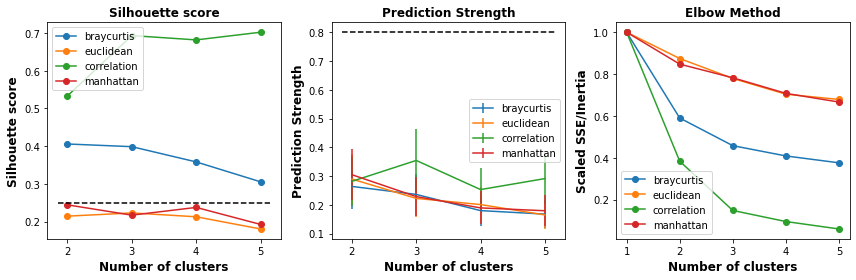

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
target_dim =3
year='12'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
PCA_obj = PCA(n_components=target_dim)
pca_vals = PCA_obj.fit_transform(df_metro_logRCA_time[naics_keys_yr])
print ('number of dimensions=',target_dim)
print('total explained variation = {}'.format(
    np.sum(PCA_obj.explained_variance_ratio_)))
pca_column_names = ['PC'+str(i+1) for i in range(target_dim)]
pca_vals_df = pd.DataFrame(data=pca_vals, columns=pca_column_names)

k_list = range(1, 6)
_,_,_,fig = do_kmedoids(pca_vals_df, k_list, metrics_list=[
                'braycurtis', 'euclidean', 'correlation', 'manhattan'])

##### prediction strength using different train-test split ratios doesn't make too much of a difference

number of dimensions= 4
total explained variation = 0.7365653406587169


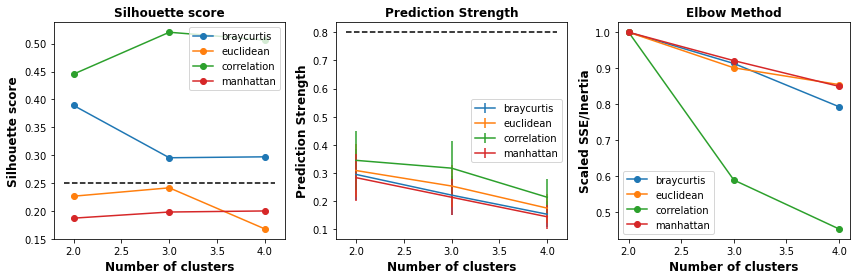

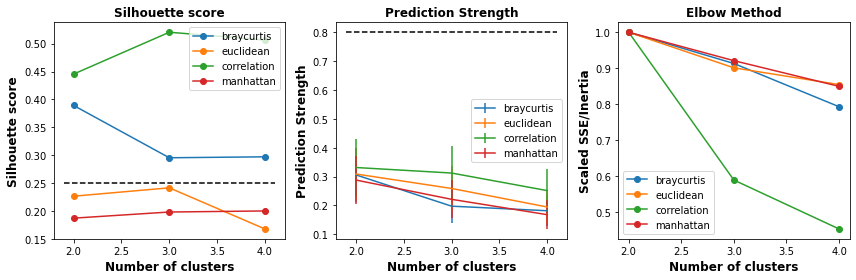

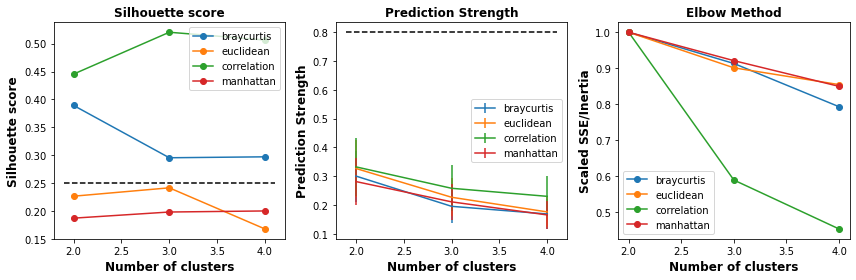

In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
target_dim =4
year='02'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
PCA_obj = PCA(n_components=target_dim)
pca_vals = PCA_obj.fit_transform(df_metro_logF_time[naics_keys_yr])
print ('number of dimensions=',target_dim)
print('total explained variation = {}'.format(
    np.sum(PCA_obj.explained_variance_ratio_)))
pca_column_names = ['PC'+str(i+1) for i in range(target_dim)]
pca_vals_df = pd.DataFrame(data=pca_vals, columns=pca_column_names)

k_list = range(2, 5)
_,_,_,fig = do_kmedoids(pca_vals_df, k_list,test_split=0.2, metrics_list=[
                'braycurtis', 'euclidean', 'correlation', 'manhattan'])

k_list = range(2, 5)
_,_,_,fig = do_kmedoids(pca_vals_df, k_list,test_split=0.5, metrics_list=[
                'braycurtis', 'euclidean', 'correlation', 'manhattan'])

k_list = range(2, 5)
_,_,_,fig = do_kmedoids(pca_vals_df, k_list,test_split=0.9, metrics_list=[
                'braycurtis', 'euclidean', 'correlation', 'manhattan'])

## NMDS plots

In [5]:
from sklearn.manifold import MDS

def MDS_StressPlot(distances,D_list, ax, fs=10, ms=10,mds=False):
    normalized_stress_list=[]
    sum_sqrd_dists=np.sum(np.square(np.ravel(distances)))/2.
    for n_comp in D_list:   
        MDS_obj = MDS(n_components=n_comp,metric=mds, dissimilarity='precomputed', n_jobs=4,max_iter=3000)
        MDS_obj.fit_transform(distances)
        ## scikit learn just returns sum of squared disparities so normalization is required
        normalized_stress=np.sqrt(MDS_obj.stress_/sum_sqrd_dists)        
        normalized_stress_list.append(normalized_stress)
        
    ax.plot(D_list,normalized_stress_list,'-o')
    ax.set_xlabel('# MDS Components', fontsize=fs)
    ax.set_ylabel('Stress', fontsize=fs)     
    return ax

def plot_NMDS(distances, ax, fs=10, ms=10,labels=None,mds=False):
    NMDS_obj = MDS(n_components=2, metric=mds, dissimilarity='precomputed', n_init=8, max_iter=6300,
                  n_jobs=4)
    NMDS_coords=NMDS_obj.fit_transform(distances)
    if labels is None:
        ax.scatter(NMDS_coords[:, 0], NMDS_coords[:, 1],  s=ms)
    else:
        color_list = create_color_list(scheme_name='sns_tab10')
        i=0
        for group in list(set(labels)):
            idx_group=np.where(labels==group)[0]
            print('len(idx_group)',len(idx_group))
            ax.scatter(NMDS_coords[idx_group, 0], NMDS_coords[idx_group, 1],c=np.array(color_list[i])[np.newaxis,:],  s=ms, label=group)
            i+=1
        ax.legend(loc='best')
        print ('NMDS stress in 2D might be too high, check stress calculation')   
    return ax

len(idx_group) 226
len(idx_group) 157
NMDS stress in 2D might be too high, check stress calculation
len(idx_group) 115
len(idx_group) 135
len(idx_group) 133
NMDS stress in 2D might be too high, check stress calculation


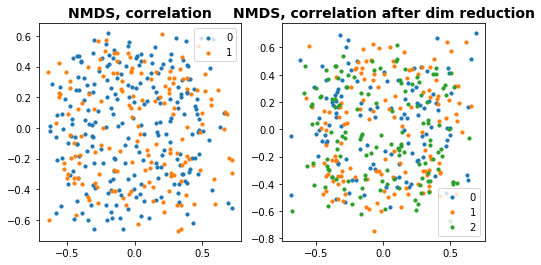

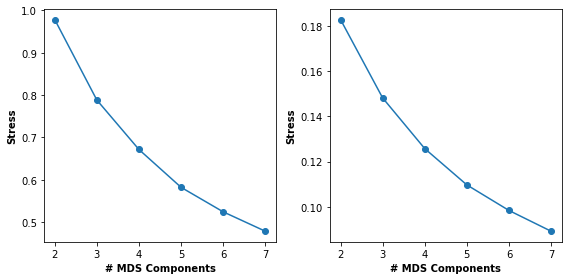

In [6]:


fig = plt.figure(figsize=(8, 4))
fig2 = plt.figure(figsize=(8, 4))
D_list=np.arange(2,8).astype(int)
target_dim =4
year='12'
naics_keys_yr=[k+'-Y'+year for k in naics_keys]
ax1 = fig.add_subplot(1, 2, 1)
ax1_2 = fig2.add_subplot(1, 2, 1)
distances = compute_pairwise_distances(df_metro_logF_time[naics_keys_yr].values, 'correlation')
km_obj, siScore, predStrengths = do_kmedoids(df_metro_logF_time[naics_keys_yr], [2], 
                                             metrics_list=['correlation'], show_fig=False)
ax1=plot_NMDS(distances, ax1, fs=10, ms=10,labels=km_obj.labels_)
ax1.set_title(r'NMDS, correlation', fontweight='bold')


ax1_2=MDS_StressPlot(distances,D_list, ax1_2)

ax2 = fig.add_subplot(1, 2, 2)
ax2_2 = fig2.add_subplot(1, 2, 2)
PCA_obj = PCA(n_components=target_dim)
pca_vals = PCA_obj.fit_transform(df_metro_logRCA_time[naics_keys_yr])
# print ('number of dimensions=',target_dim)
# print('total explained variation = {}'.format(np.sum(PCA_obj.explained_variance_ratio_)))
pca_column_names = ['PC'+str(i+1) for i in range(target_dim)]
pca_vals_df = pd.DataFrame(data=pca_vals, columns=pca_column_names)


distances = compute_pairwise_distances(pca_vals_df[pca_column_names].values, 'correlation')
km_obj, siScore, predStrengths = do_kmedoids(pca_vals_df[pca_column_names], [3], 
                                             metrics_list=['correlation'], show_fig=False)
ax2=plot_NMDS(distances, ax2, fs=10, ms=10,labels=km_obj.labels_)
ax2.set_title(r'NMDS, correlation after dim reduction', fontweight='bold')


ax2_2=MDS_StressPlot(distances,D_list, ax2_2)

plt.tight_layout()
fig.patch.set_facecolor('white')

fig2.tight_layout()
fig2.patch.set_facecolor('white')



why is the MDS stress still high even though original data was in 4 dimensions?

# rough